In [1]:
import pandas as pd
import numpy as np
from scipy.spatial import distance
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap


### aplicar filtro de outliers de trainval a test + representaciones de umbral por distancia de mahalanobis, promedios corregidos, originales y baselines de filtrados y descartados y generación de nuevos csvs sin los outliers

Especie: UAM502, 777 espectros eliminados de un total de 11342


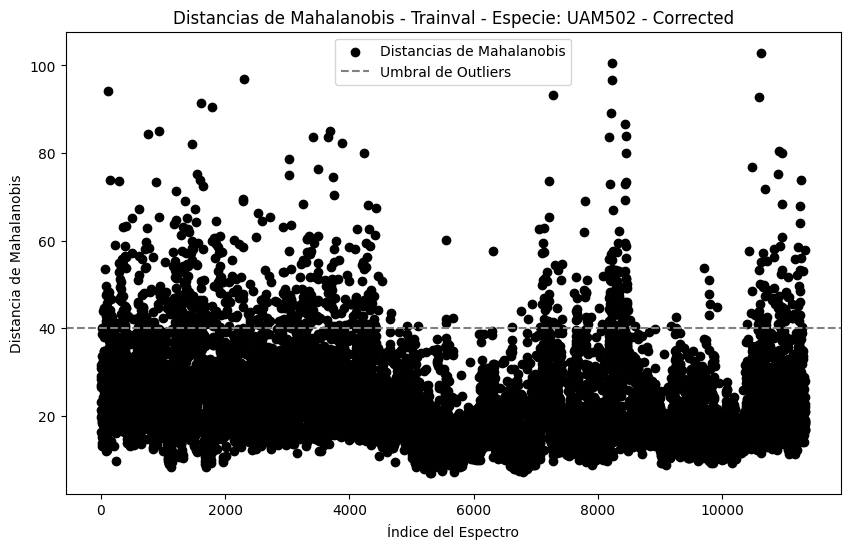

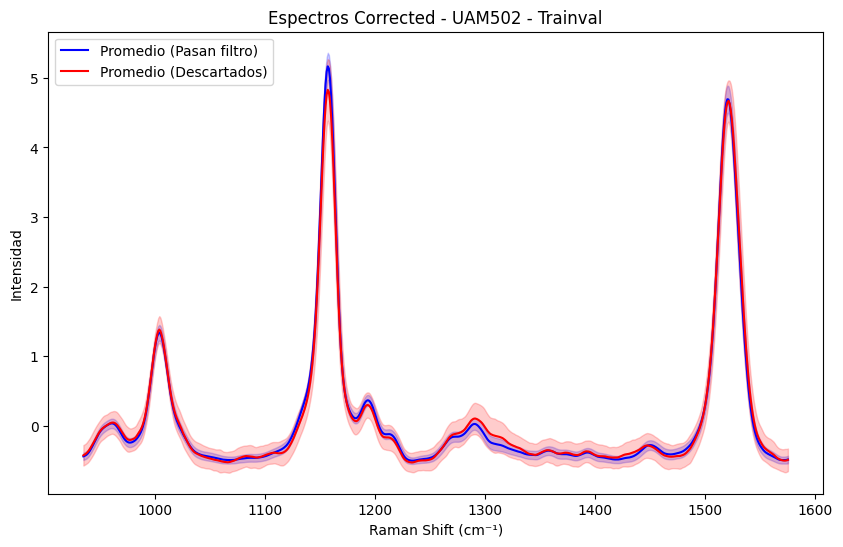

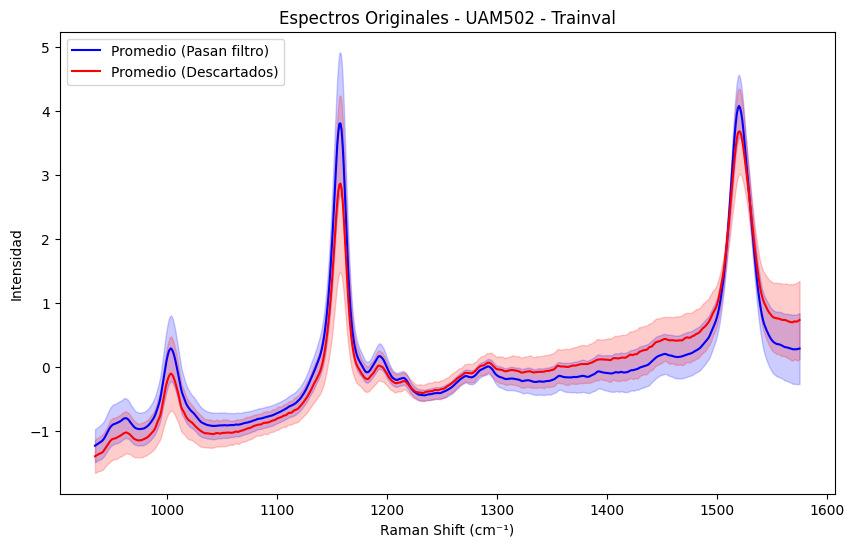

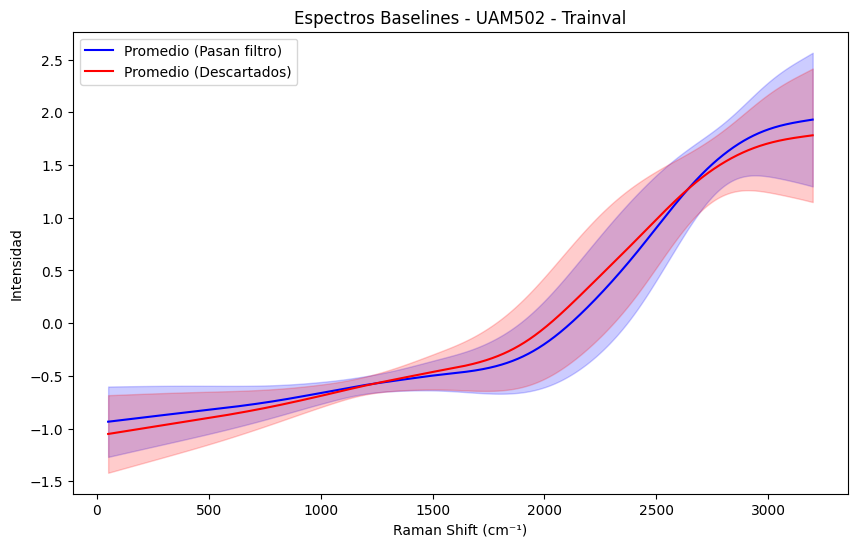

Especie: UAM588, 774 espectros eliminados de un total de 10938


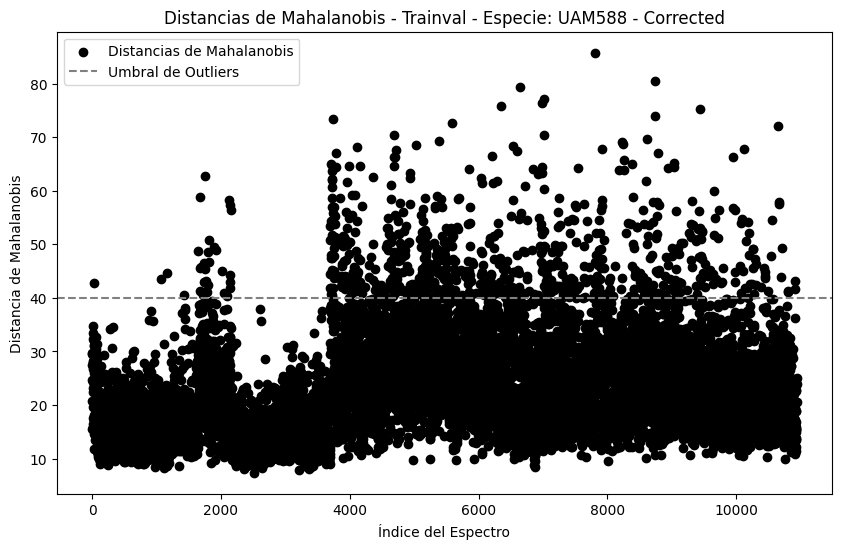

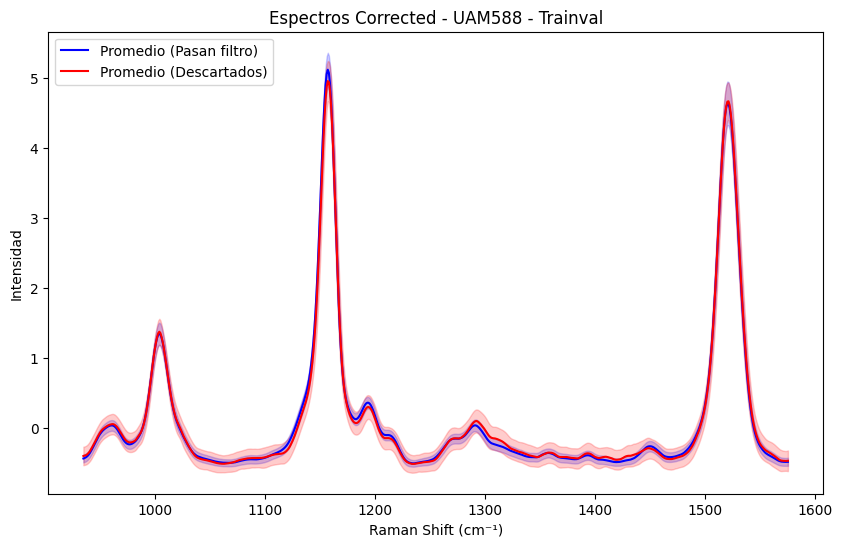

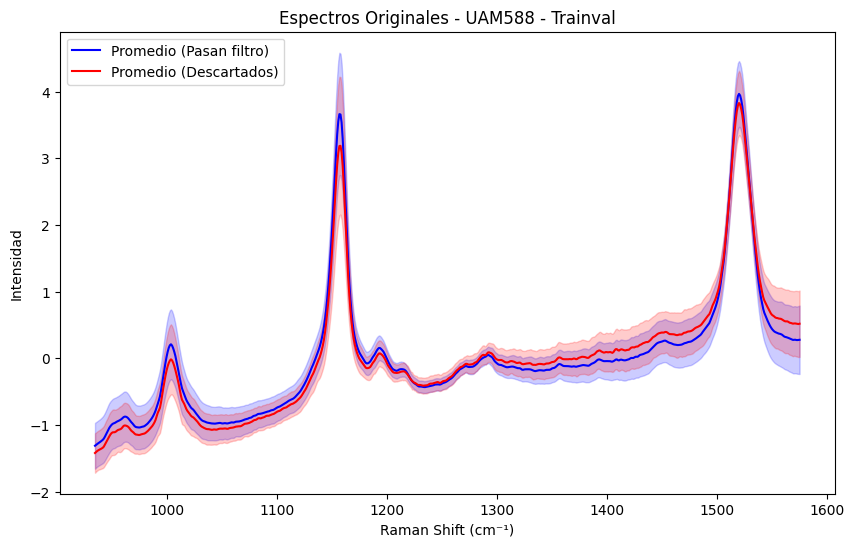

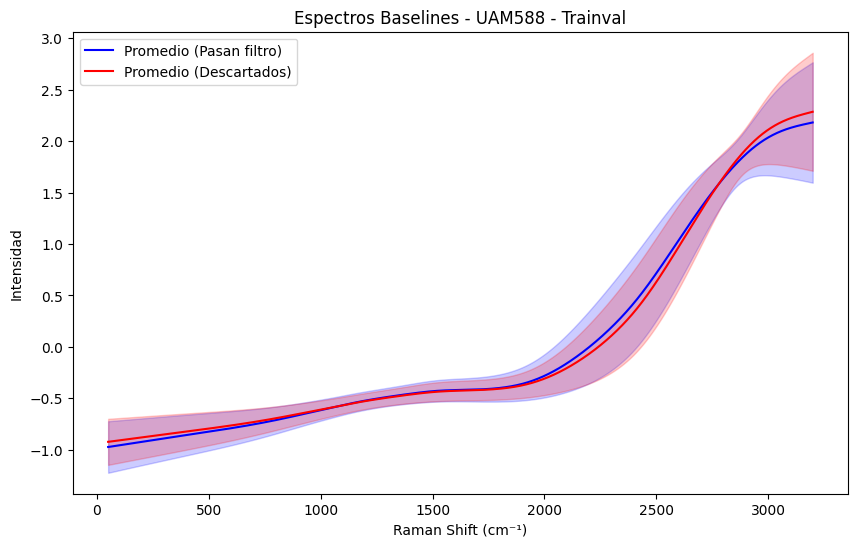

Especie: UAM565, 700 espectros eliminados de un total de 9009


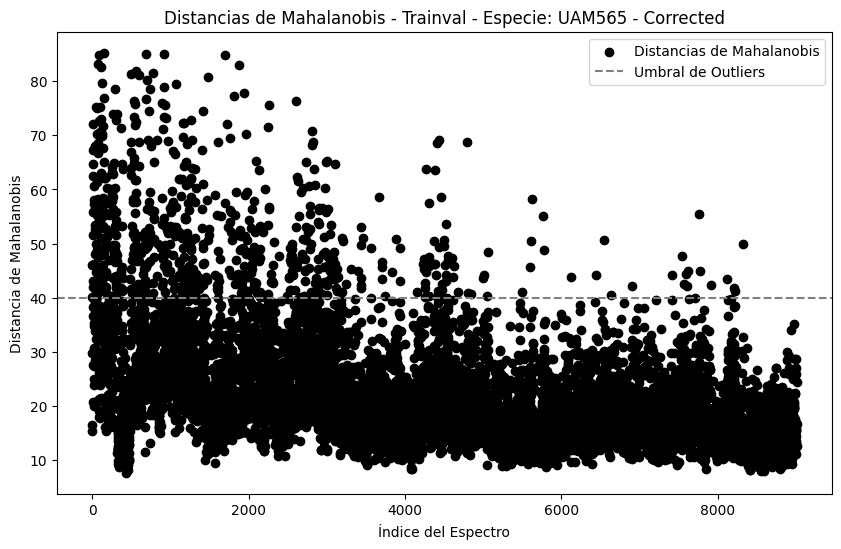

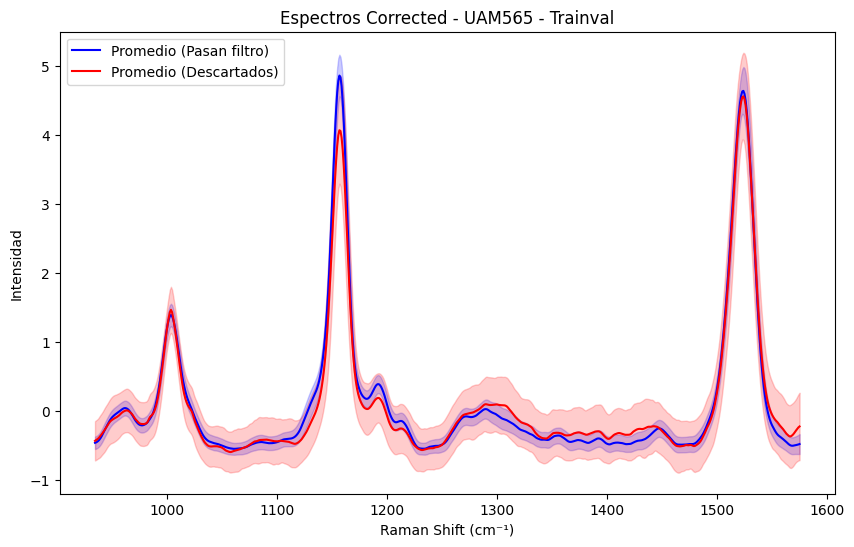

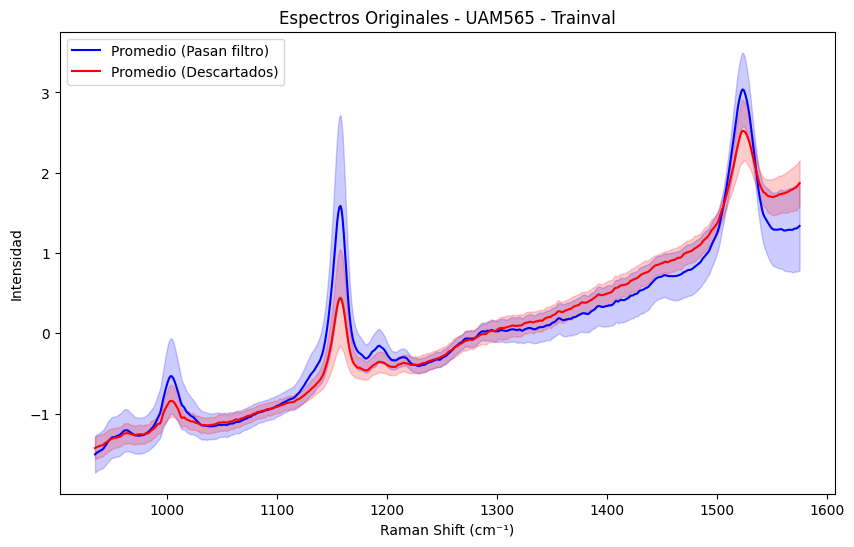

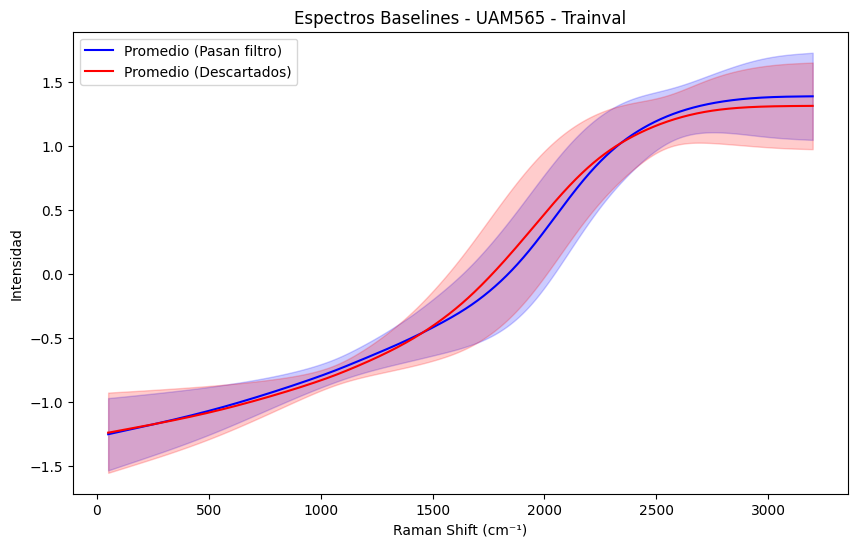

Especie: UAM253, 297 espectros eliminados de un total de 8353


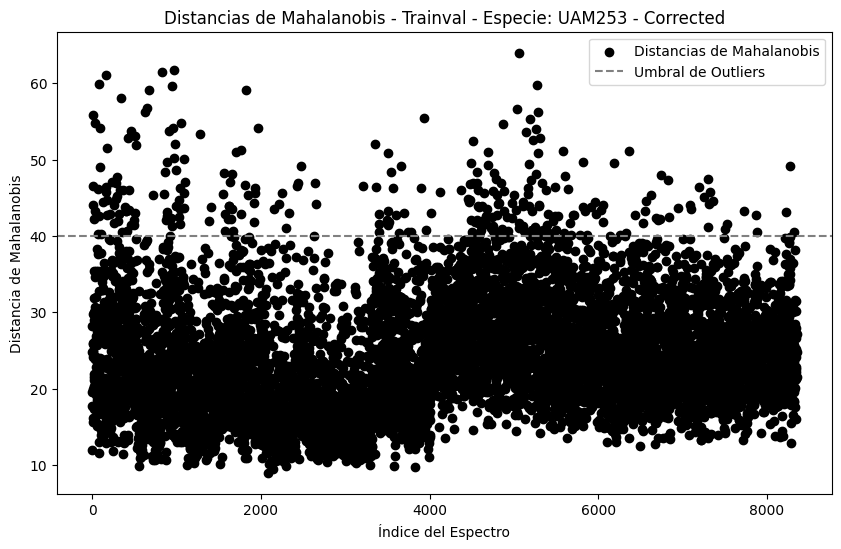

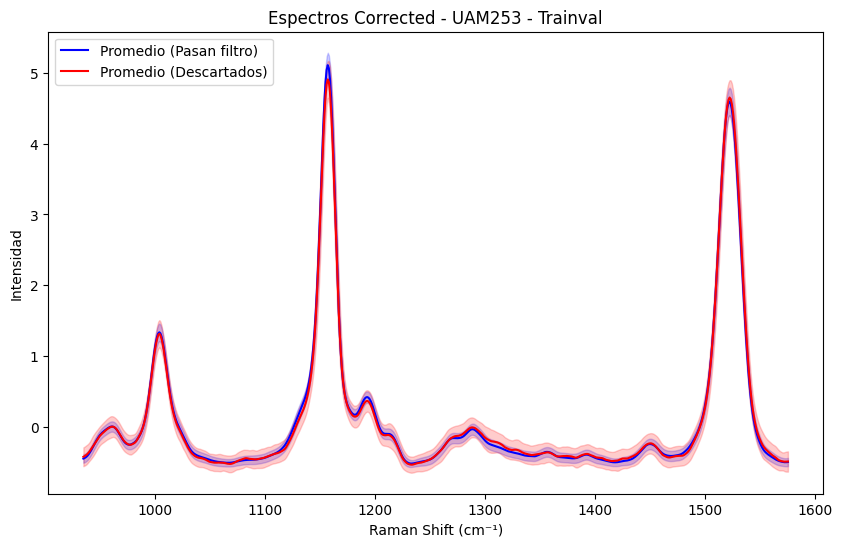

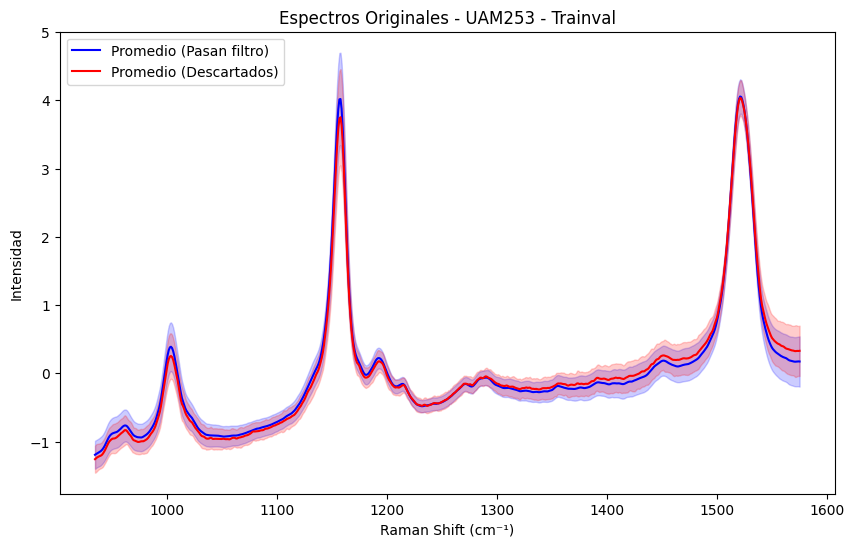

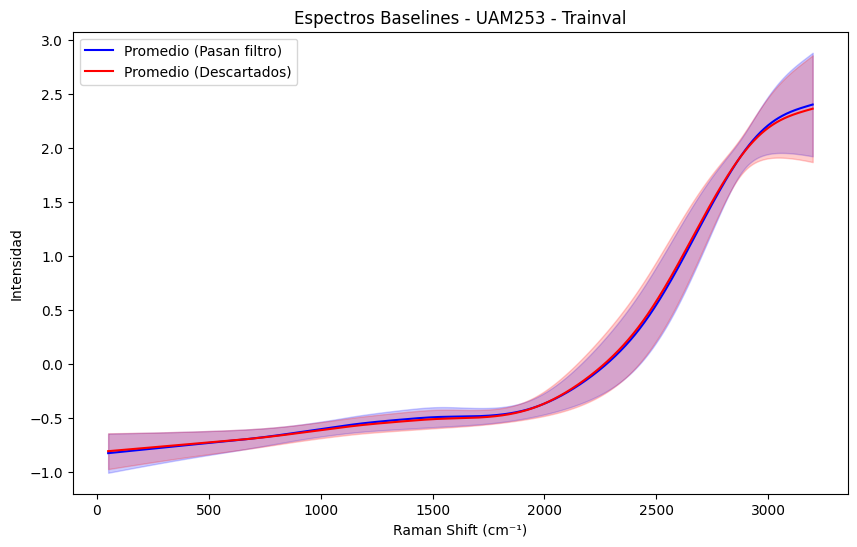

Especie: charco, 17 espectros eliminados de un total de 3033


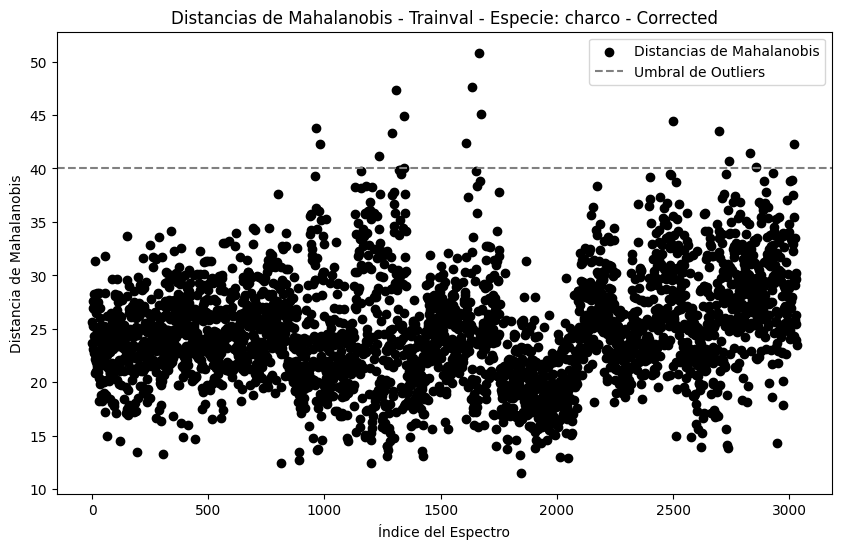

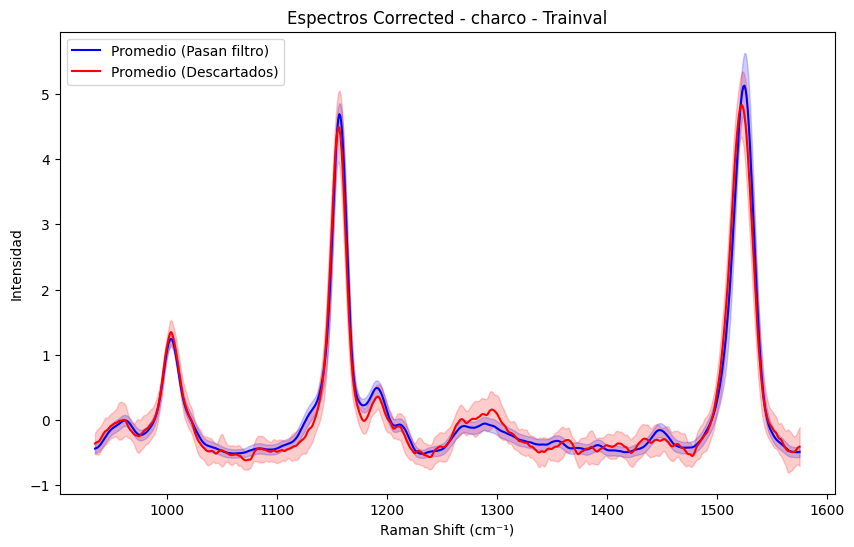

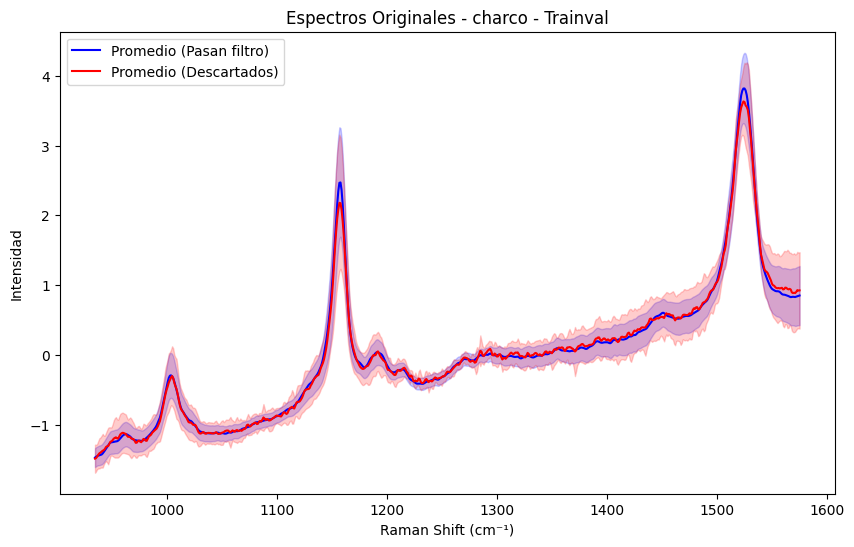

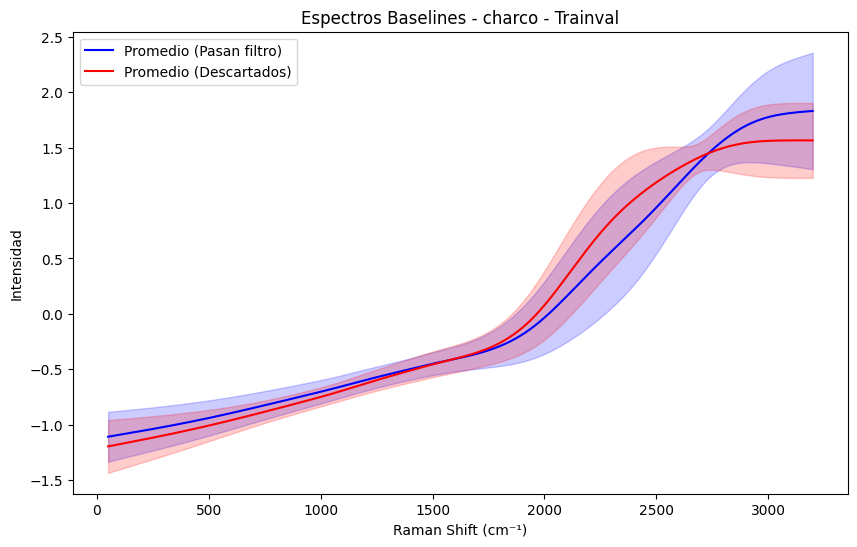

Especie: UAM502, 25 espectros eliminados de un total de 908


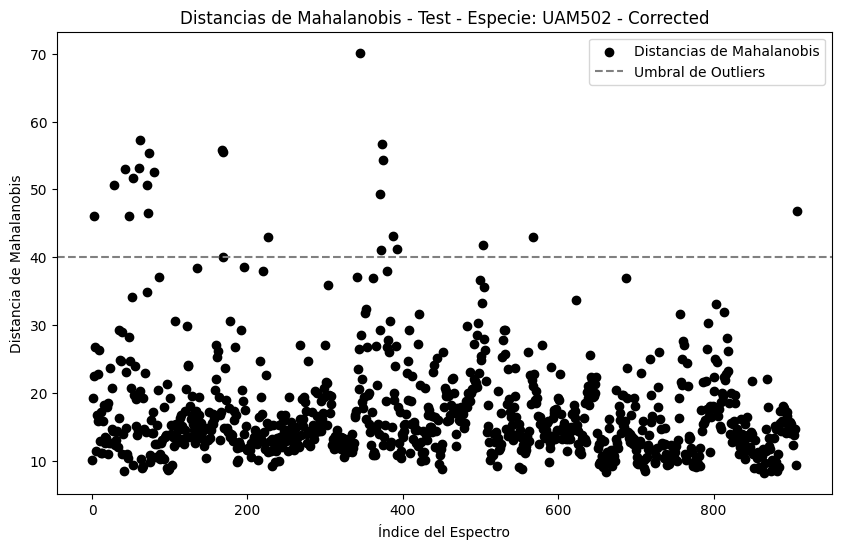

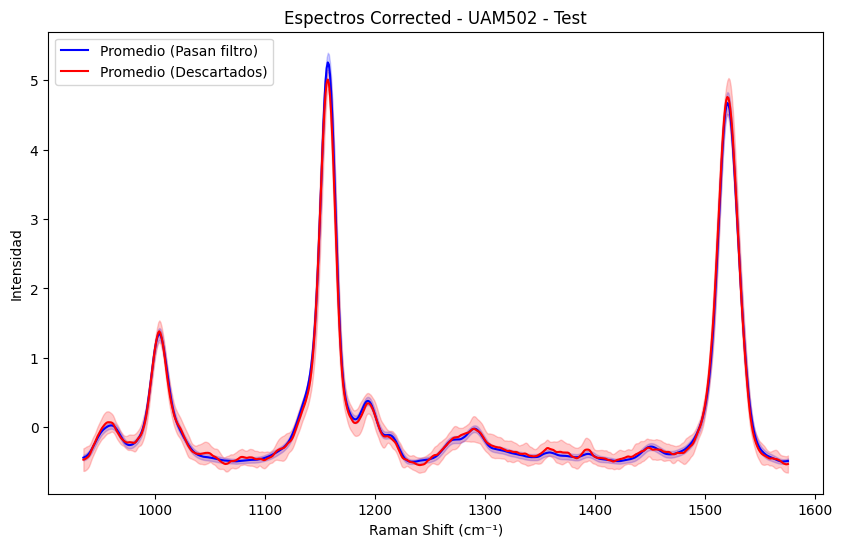

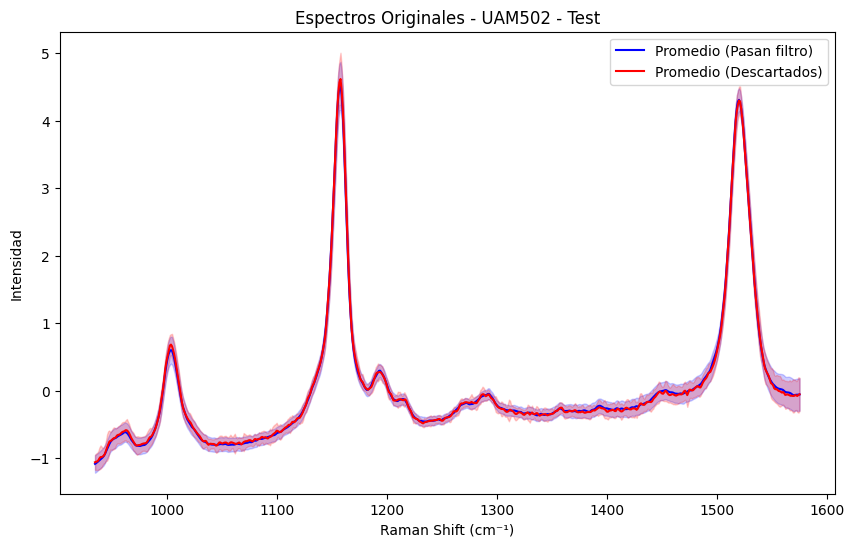

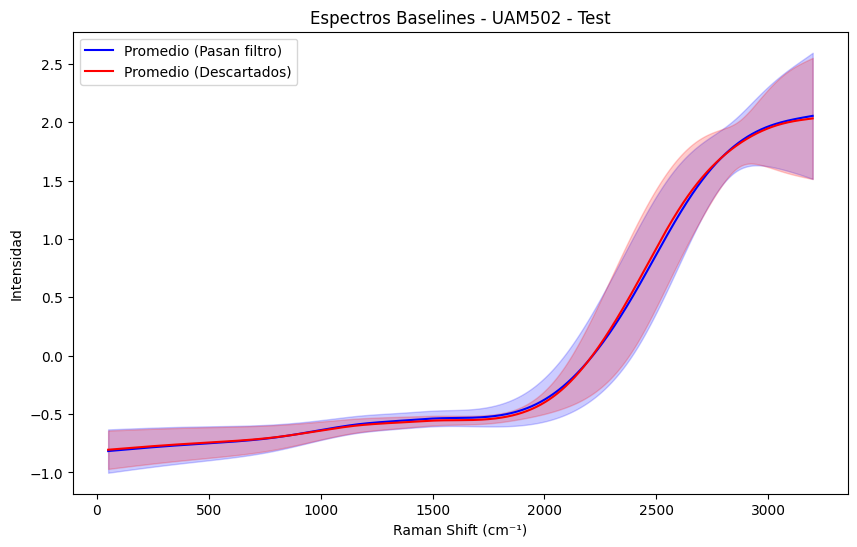

Especie: UAM588, 98 espectros eliminados de un total de 4021


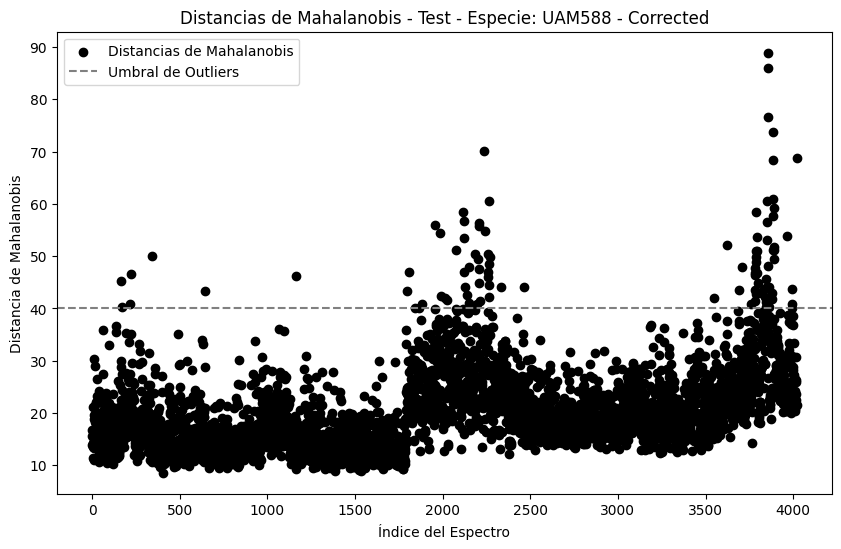

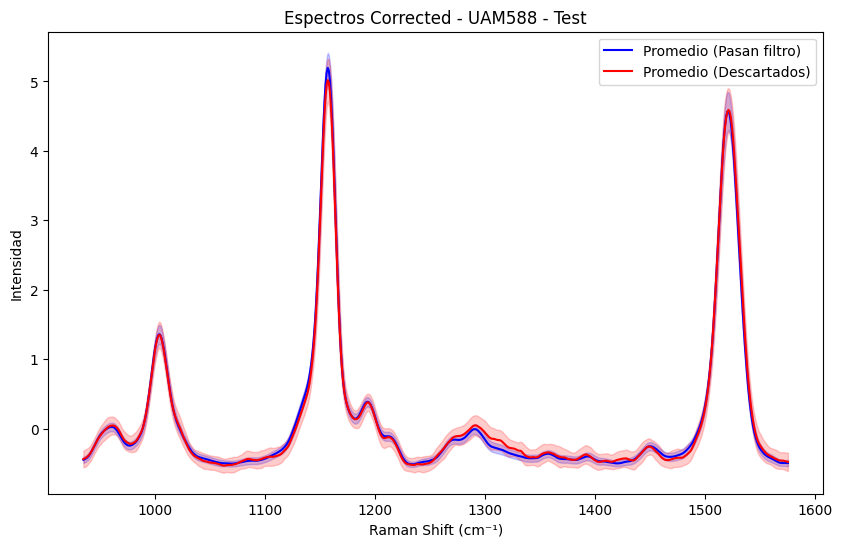

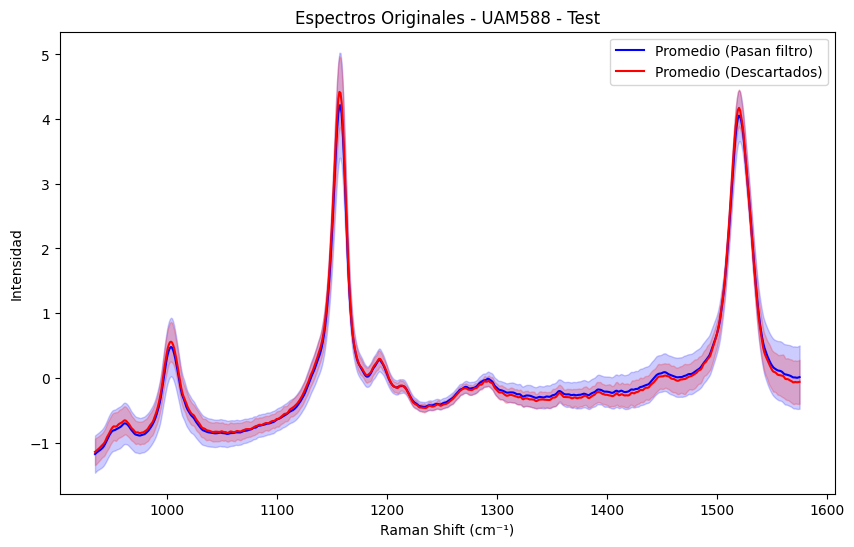

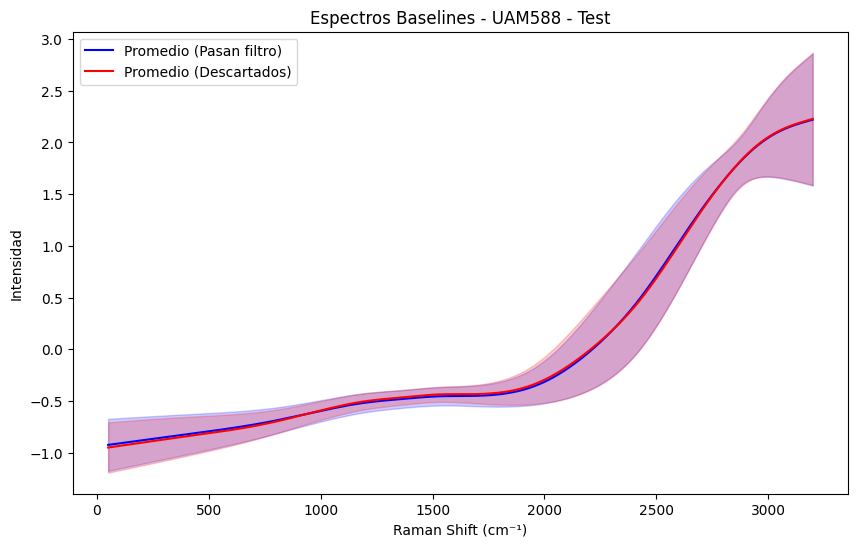

Especie: UAM565, 4 espectros eliminados de un total de 1414


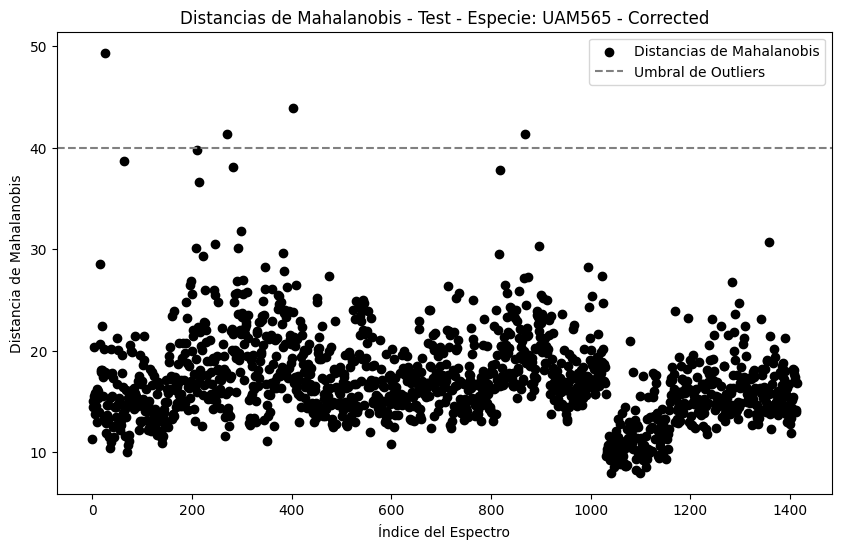

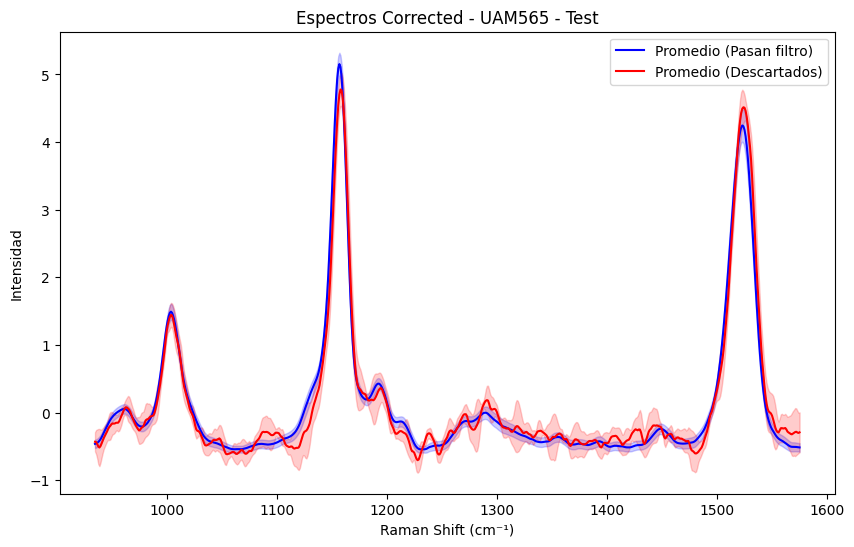

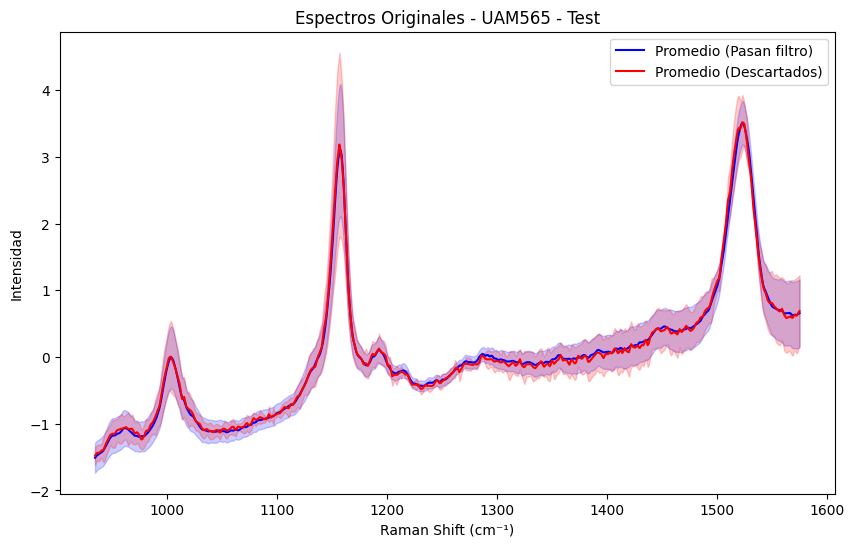

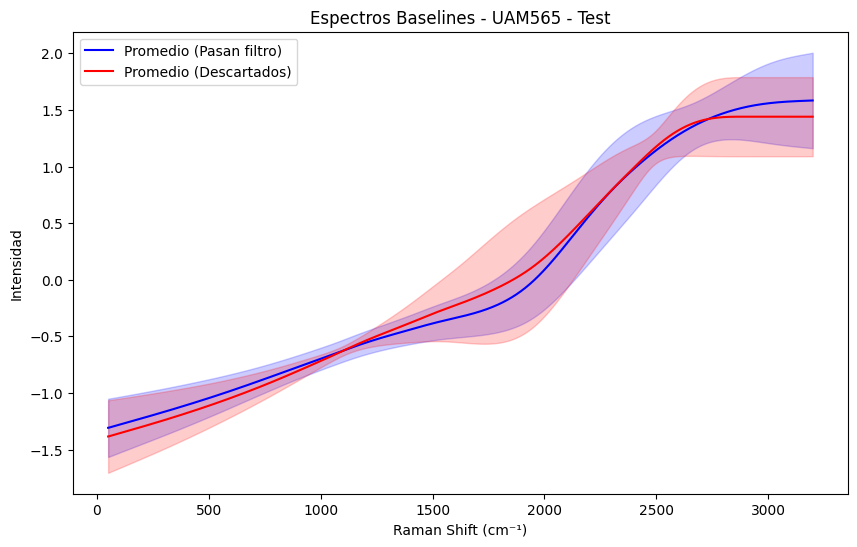

Especie: UAM253, 281 espectros eliminados de un total de 1634


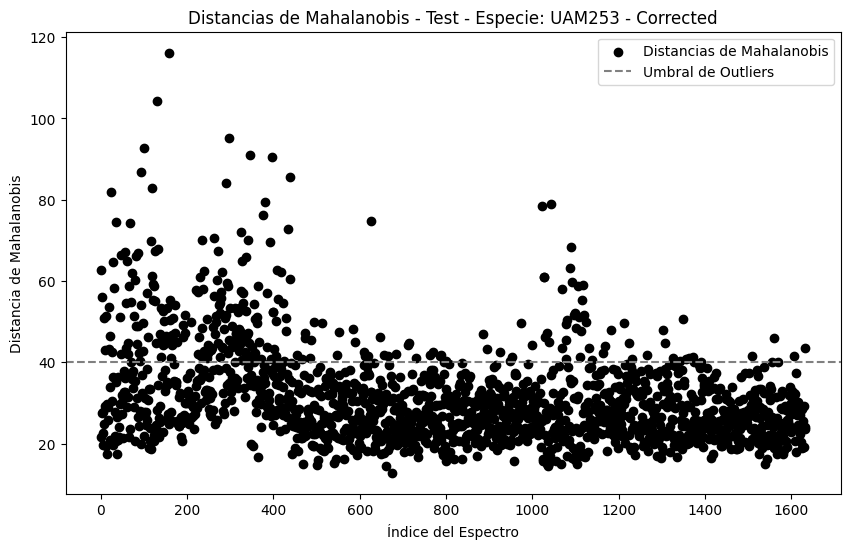

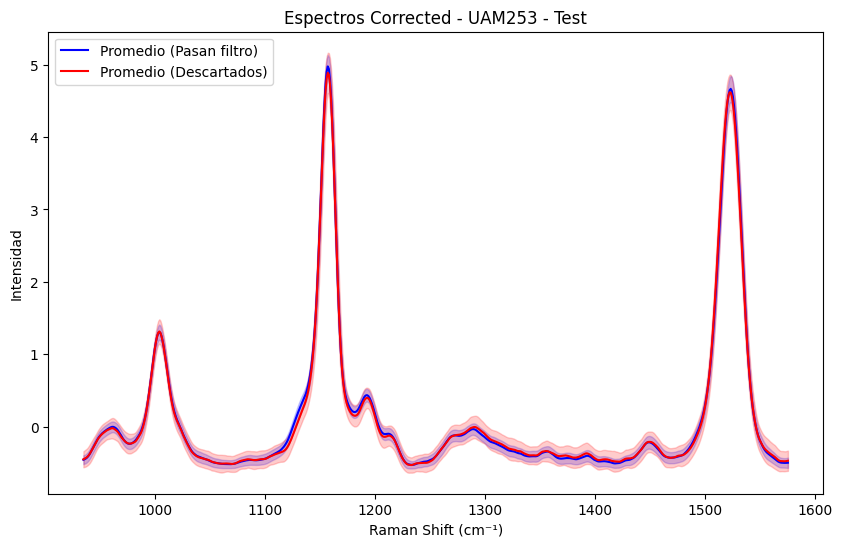

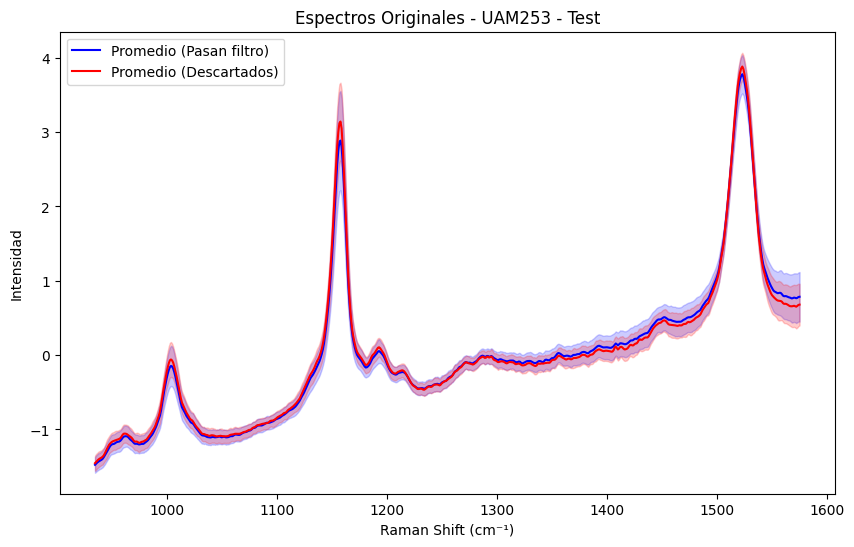

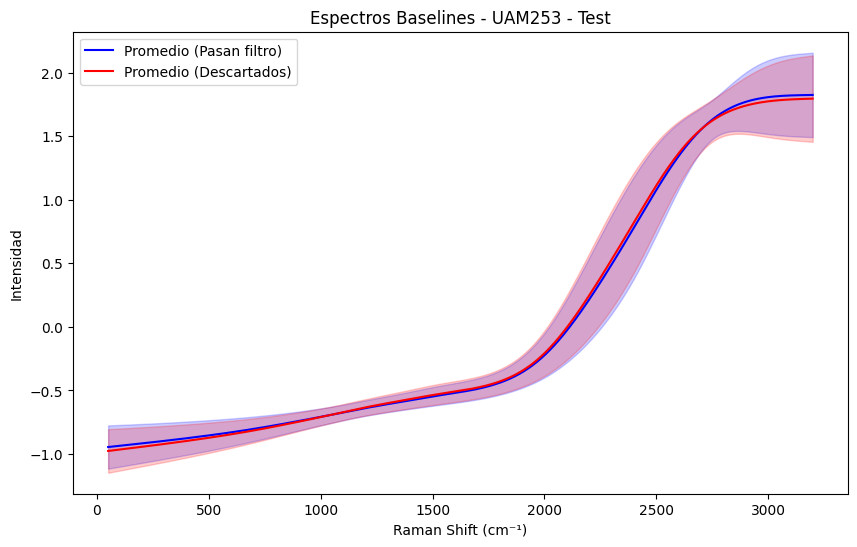

Especie: charco, 13 espectros eliminados de un total de 704


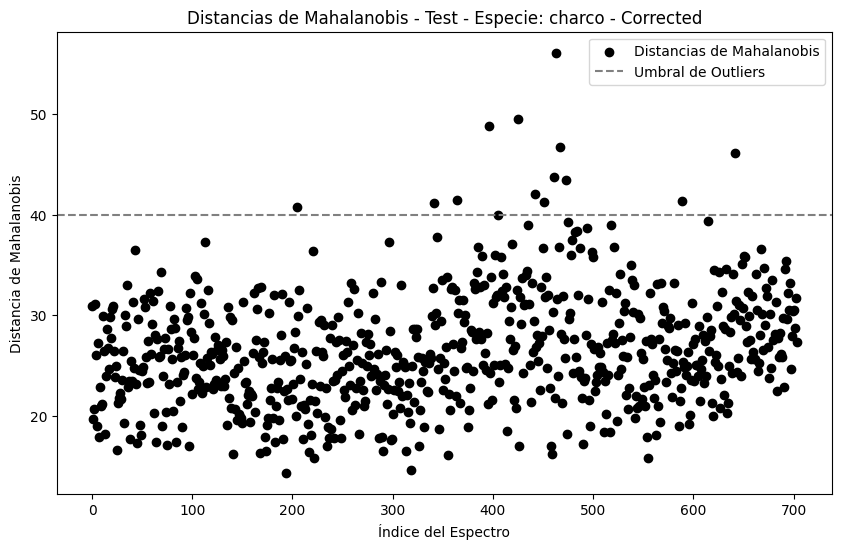

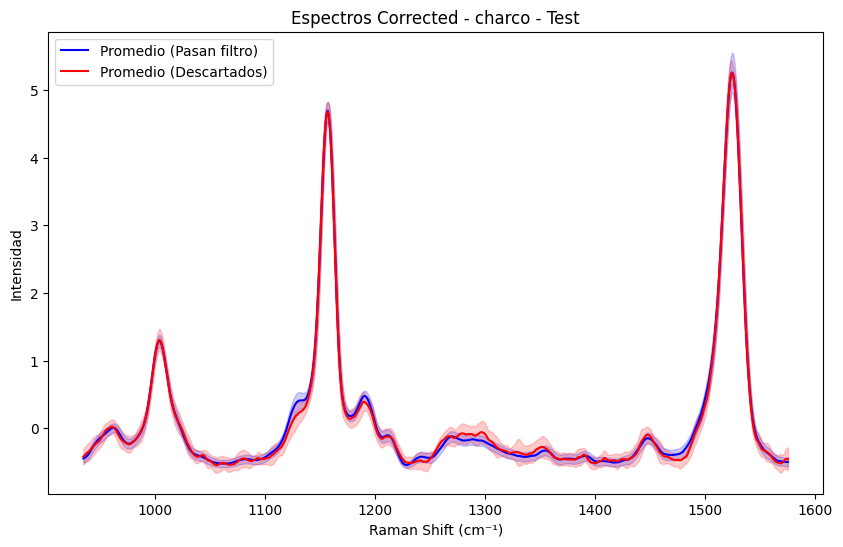

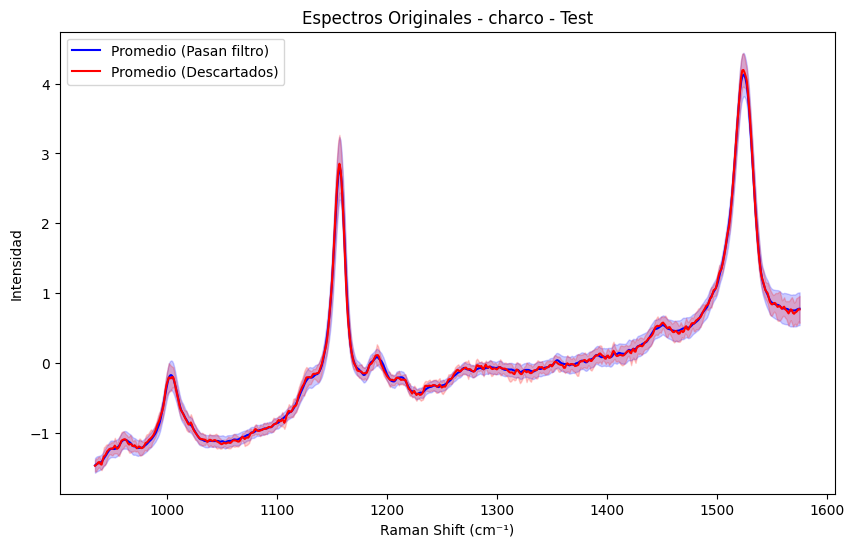

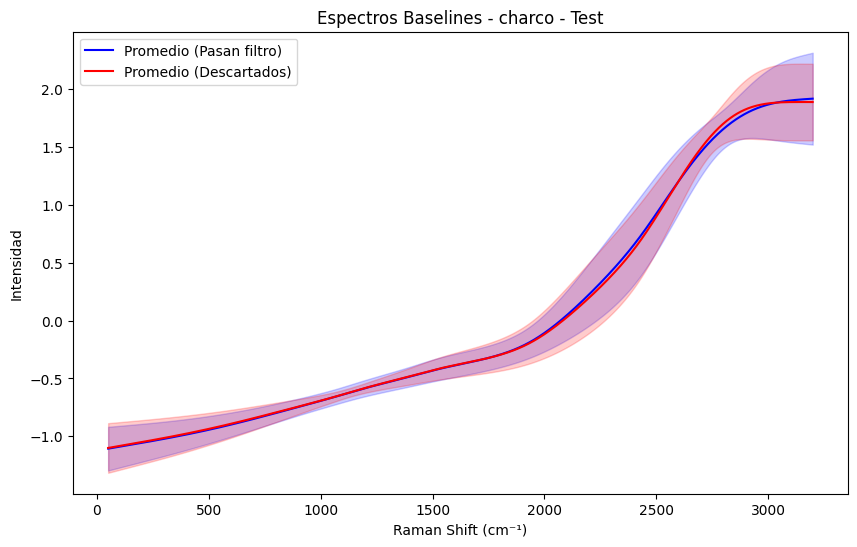

Filtrado completado en trainval y test, y archivos guardados.


In [18]:
import pandas as pd
import numpy as np
from scipy.spatial import distance
import matplotlib.pyplot as plt

# Función para graficar el espectro promedio y la desviación estándar
def plot_mean_and_std(df_passed, df_outliers, title, raman_shifts):
    plt.figure(figsize=(10, 6))
    
    # Calcular el promedio y la desviación estándar de los espectros que pasan el filtro
    if not df_passed.empty:
        mean_passed = df_passed.mean(axis=0)
        std_passed = df_passed.std(axis=0)
        plt.plot(raman_shifts, mean_passed, color='blue', label='Promedio (Pasan filtro)')
        plt.fill_between(raman_shifts, mean_passed - std_passed, mean_passed + std_passed, color='blue', alpha=0.2)
    
    # Calcular el promedio y la desviación estándar de los espectros descartados
    if not df_outliers.empty:
        mean_outliers = df_outliers.mean(axis=0)
        std_outliers = df_outliers.std(axis=0)
        plt.plot(raman_shifts, mean_outliers, color='red', label='Promedio (Descartados)')
        plt.fill_between(raman_shifts, mean_outliers - std_outliers, mean_outliers + std_outliers, color='red', alpha=0.2)

    plt.title(title)
    plt.xlabel("Raman Shift (cm⁻¹)")
    plt.ylabel("Intensidad")
    plt.legend()
    plt.show()

# Función para calcular la matriz de covarianza inversa y el vector de medias por especie
def compute_mahalanobis_params(df, y, species):
    species_mask = (y == species)
    df_species = df[species_mask]
    
    # Excluir las columnas categóricas para calcular Mahalanobis
    df_numeric = df_species.drop(columns=categorical_columns + coordinates_columns + names_column)
    
    # Calcular la matriz de covarianza y su inversa
    cov_matrix = np.cov(df_numeric.T)
    inv_cov_matrix = np.linalg.inv(cov_matrix)
    
    # Calcular el vector de medias
    mean_vector = df_numeric.mean(axis=0)
    
    return inv_cov_matrix, mean_vector

# Función para aplicar el filtro de Mahalanobis en un DataFrame
def apply_mahalanobis_filter(df_test, inv_cov_matrix, mean_vector, threshold=40):
    df_test_numeric = df_test.drop(columns=categorical_columns + coordinates_columns + names_column)
    
    # Calcular la distancia de Mahalanobis para cada espectro en el test
    mahalanobis_distances = df_test_numeric.apply(lambda row: distance.mahalanobis(row, mean_vector, inv_cov_matrix), axis=1)
    
    # Definir el umbral de distancia
    outliers_mask = mahalanobis_distances > threshold
    
    return outliers_mask, mahalanobis_distances

# Función para filtrar y graficar los resultados (promedios y desviación estándar)
def filter_and_plot(df, outliers_mask, raman_shifts, title):
    df_passed = df[~outliers_mask].drop(columns=categorical_columns + coordinates_columns + names_column)
    df_outliers = df[outliers_mask].drop(columns=categorical_columns + coordinates_columns + names_column)
    
    plot_mean_and_std(df_passed, df_outliers, title, raman_shifts)
    
    return df_passed, df_outliers

# Definir las columnas categóricas y de coordenadas
categorical_columns = ['date', 't_exp', 'especie', 'medium']
coordinates_columns = ['X', 'Y']
names_column = ['name']

# 1. Cargar los datos de trainval
ruta = [
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_CORRECTED_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv',
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_ORIGINALES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv',
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_BASELINES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv'
]

df = pd.read_csv(ruta[0])
df_originales = pd.read_csv(ruta[1])
df_baselines = pd.read_csv(ruta[2])

# Definir los rangos de los espectros Raman
raman_shifts_corrected = np.arange(935, 1576, 1)  # Para corrected y originales
raman_shifts_baselines = np.arange(50, 3200, 1)  # Para baselines

# 2. Aplicar el filtro de Mahalanobis para cada especie en trainval
outliers_indices_trainval = []
params_by_species = {}

y_trainval = df['especie']  # Etiquetas de las clases (especies)

for species in y_trainval.unique():
    inv_cov_matrix, mean_vector = compute_mahalanobis_params(df, y_trainval, species)
    params_by_species[species] = (inv_cov_matrix, mean_vector)
    
    # Filtrar solo los datos de la especie actual
    species_mask = (y_trainval == species)
    df_species = df[species_mask]
    df_species_originales = df_originales[species_mask]
    df_species_baselines = df_baselines[species_mask]
    
    # Aplicar Mahalanobis a esta especie para corrected
    outliers_mask_corrected, mahalanobis_distances_corrected = apply_mahalanobis_filter(df_species, inv_cov_matrix, mean_vector)

    # Contar los espectros descartados para esta especie
    eliminados = outliers_mask_corrected.sum()
    total = len(outliers_mask_corrected)
    print(f"Especie: {species}, {eliminados} espectros eliminados de un total de {total}")
    
    # Graficar las distancias de Mahalanobis para esta especie en corrected
    plt.figure(figsize=(10, 6))
    plt.scatter(range(len(mahalanobis_distances_corrected)), mahalanobis_distances_corrected, c='black', label='Distancias de Mahalanobis')
    plt.axhline(y=40, color='grey', linestyle='--', label="Umbral de Outliers")
    plt.title(f"Distancias de Mahalanobis - Trainval - Especie: {species} - Corrected")
    plt.xlabel("Índice del Espectro")
    plt.ylabel("Distancia de Mahalanobis")
    plt.legend()
    plt.show()

    # Filtrar y graficar los promedios y desviaciones estándar para corrected
    filter_and_plot(df_species, outliers_mask_corrected, raman_shifts_corrected, f"Espectros Corrected - {species} - Trainval")

    # Filtrar y graficar los promedios y desviaciones estándar para originales y baselines por especie
    filter_and_plot(df_species_originales, df_species_originales.index.isin(df_species.index[outliers_mask_corrected]), raman_shifts_corrected, f"Espectros Originales - {species} - Trainval")
    filter_and_plot(df_species_baselines, df_species_baselines.index.isin(df_species.index[outliers_mask_corrected]), raman_shifts_baselines, f"Espectros Baselines - {species} - Trainval")

    # Almacenar los índices de outliers
    outliers_indices_trainval.extend(df_species.index[outliers_mask_corrected])

# Eliminar los outliers en los tres DataFrames de trainval usando los índices de corrected
df_filtered = df.drop(outliers_indices_trainval)
df_originales_filtered = df_originales.drop(outliers_indices_trainval)
df_baselines_filtered = df_baselines.drop(outliers_indices_trainval)

# Guardar los DataFrames filtrados de trainval
'''df_filtered.to_csv(ruta[0].replace('.csv', '_WITHOUTOUTLIERS.csv'), index=False)
df_originales_filtered.to_csv(ruta[1].replace('.csv', '_WITHOUTOUTLIERS.csv'), index=False)
df_baselines_filtered.to_csv(ruta[2].replace('.csv', '_WITHOUTOUTLIERS.csv'), index=False)'''

# 3. Aplicar el filtro de Mahalanobis a los datos de test utilizando los parámetros calculados en trainval
test_paths = [
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_CORRECTED_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv',
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_ORIGINALES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv',
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_BASELINES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv'
]

df_test_corrected = pd.read_csv(test_paths[0])
df_test_originales = pd.read_csv(test_paths[1])
df_test_baselines = pd.read_csv(test_paths[2])

y_test = df_test_corrected['especie']

# Aplicar el filtro de Mahalanobis en test
outliers_indices_test = []

for species in y_test.unique():
    if species in params_by_species:
        inv_cov_matrix, mean_vector = params_by_species[species]
        
        # Filtrar solo los datos de la especie actual en test
        species_mask_test = (y_test == species)
        df_species_test_corrected = df_test_corrected[species_mask_test]
        df_species_test_originales = df_test_originales[species_mask_test]
        df_species_test_baselines = df_test_baselines[species_mask_test]
        
        # Aplicar Mahalanobis a esta especie para corrected
        outliers_mask_test_corrected, mahalanobis_distances_test_corrected = apply_mahalanobis_filter(df_species_test_corrected, inv_cov_matrix, mean_vector)
        
        outliers_indices_test.extend(df_species_test_corrected.index[outliers_mask_test_corrected])

        # Contar los espectros descartados para esta especie
        eliminados = outliers_mask_test_corrected.sum()
        total = len(outliers_mask_test_corrected)
        print(f"Especie: {species}, {eliminados} espectros eliminados de un total de {total}")

        # Graficar las distancias de Mahalanobis para test (corrected)
        plt.figure(figsize=(10, 6))
        plt.scatter(range(len(mahalanobis_distances_test_corrected)), mahalanobis_distances_test_corrected, c='black', label='Distancias de Mahalanobis')
        plt.axhline(y=40, color='grey', linestyle='--', label="Umbral de Outliers")
        plt.title(f"Distancias de Mahalanobis - Test - Especie: {species} - Corrected")
        plt.xlabel("Índice del Espectro")
        plt.ylabel("Distancia de Mahalanobis")
        plt.legend()
        plt.show()

        # Filtrar y graficar los promedios y desviaciones estándar para corrected por especie en test
        filter_and_plot(df_species_test_corrected, outliers_mask_test_corrected, raman_shifts_corrected, f"Espectros Corrected - {species} - Test")

        # Filtrar y graficar los promedios y desviaciones estándar para originales y baselines por especie en test
        filter_and_plot(df_species_test_originales, df_species_test_originales.index.isin(df_species_test_corrected.index[outliers_mask_test_corrected]), raman_shifts_corrected, f"Espectros Originales - {species} - Test")
        filter_and_plot(df_species_test_baselines, df_species_test_baselines.index.isin(df_species_test_corrected.index[outliers_mask_test_corrected]), raman_shifts_baselines, f"Espectros Baselines - {species} - Test")

# Eliminar los outliers en los tres DataFrames de test usando los índices de corrected
df_test_corrected_filtered = df_test_corrected.drop(outliers_indices_test)
df_test_originales_filtered = df_test_originales.drop(outliers_indices_test)
df_test_baselines_filtered = df_test_baselines.drop(outliers_indices_test)

# Guardar los DataFrames filtrados de test
'''df_test_corrected_filtered.to_csv(test_paths[0].replace('.csv', '_WITHOUTOUTLIERS.csv'), index=False)
df_test_originales_filtered.to_csv(test_paths[1].replace('.csv', '_WITHOUTOUTLIERS.csv'), index=False)
df_test_baselines_filtered.to_csv(test_paths[2].replace('.csv', '_WITHOUTOUTLIERS.csv'), index=False)
'''
print("Filtrado completado en trainval y test, y archivos guardados.")





## matriz de covarianza construida con todo el conjunto trainval

Especie: UAM502, 600 espectros eliminados de un total de 11342


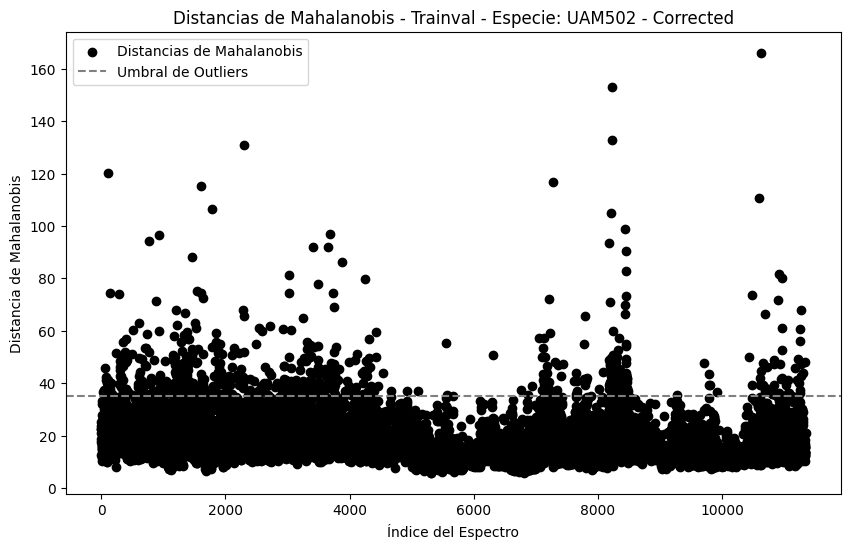

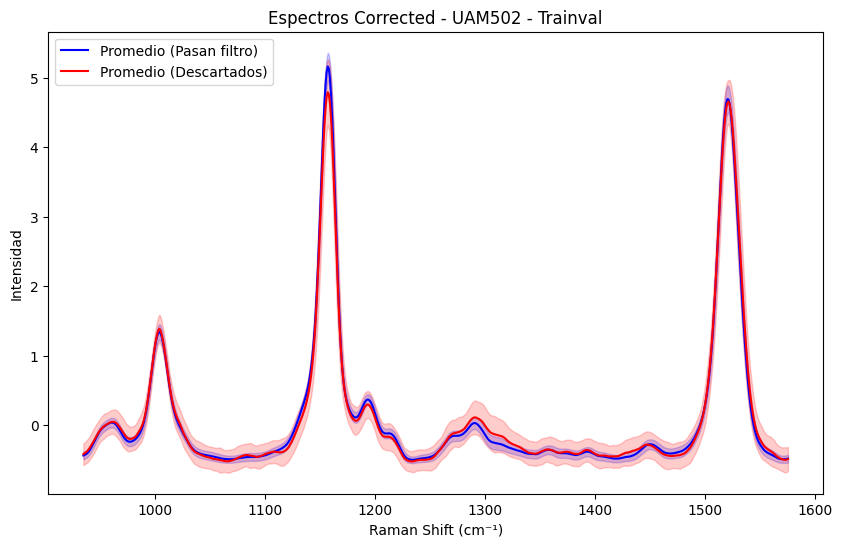

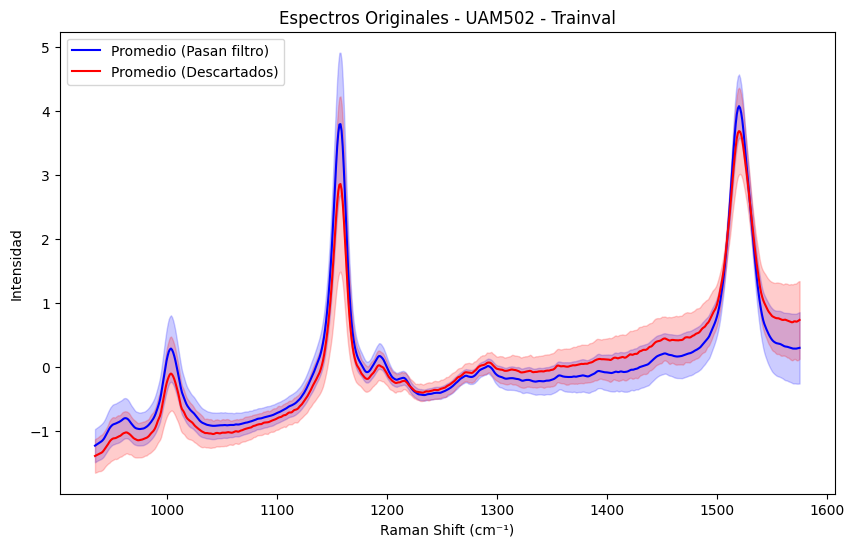

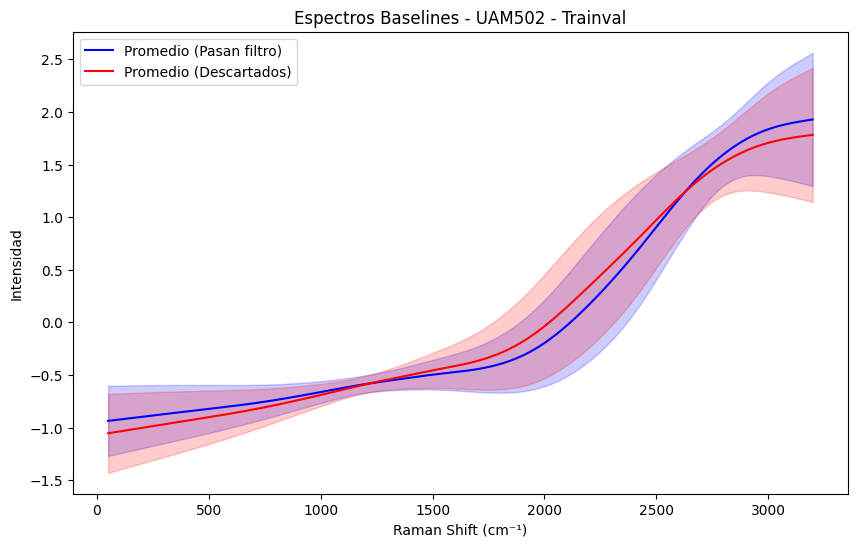

Especie: UAM588, 563 espectros eliminados de un total de 10938


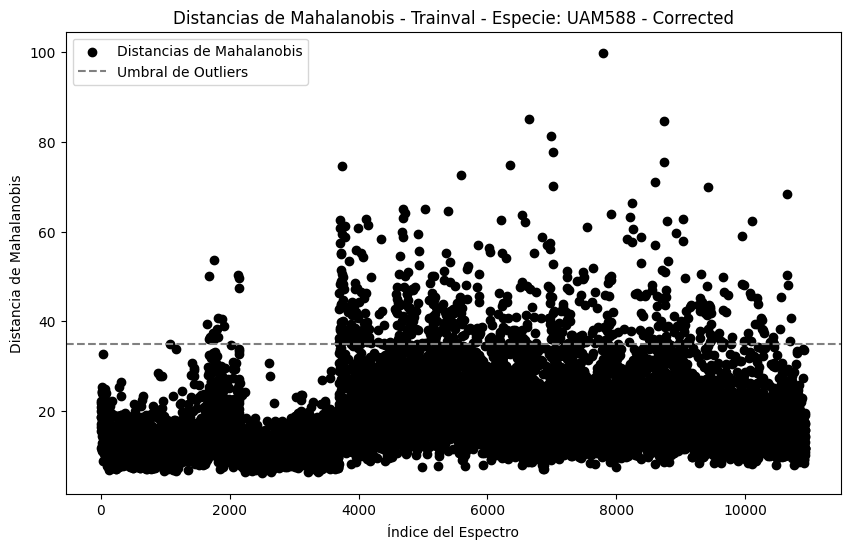

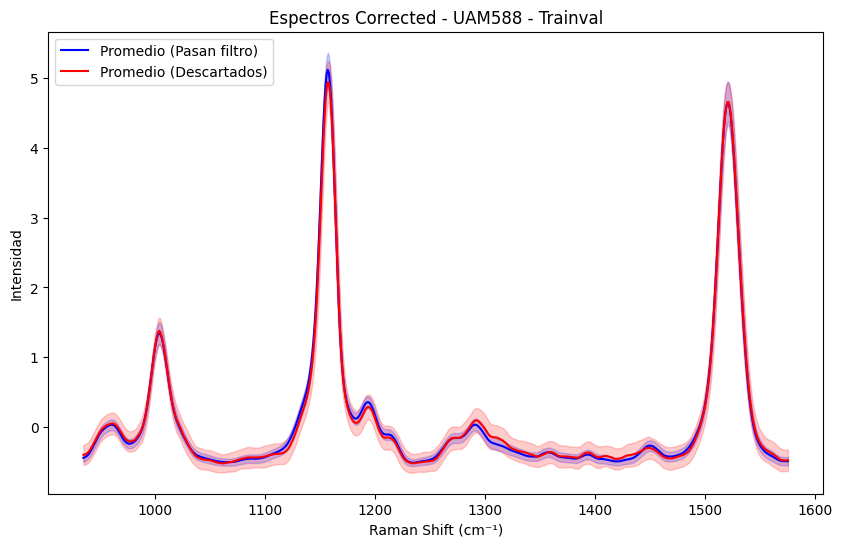

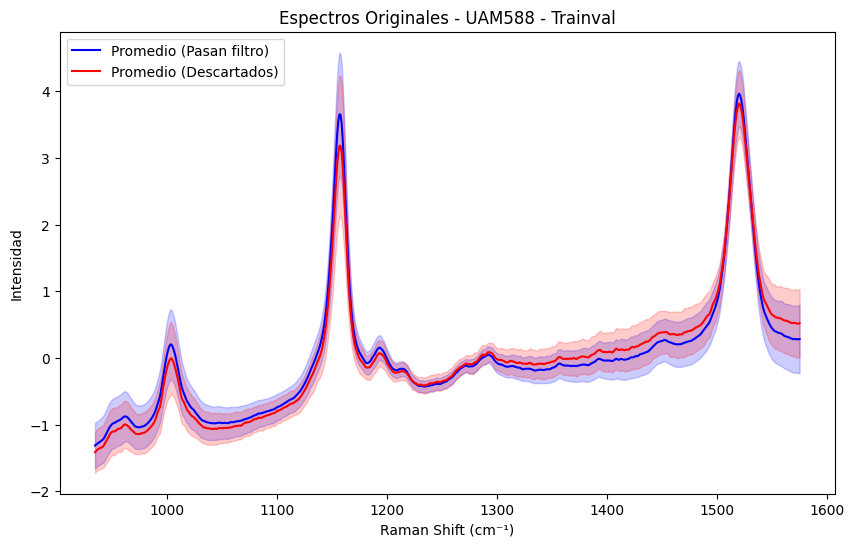

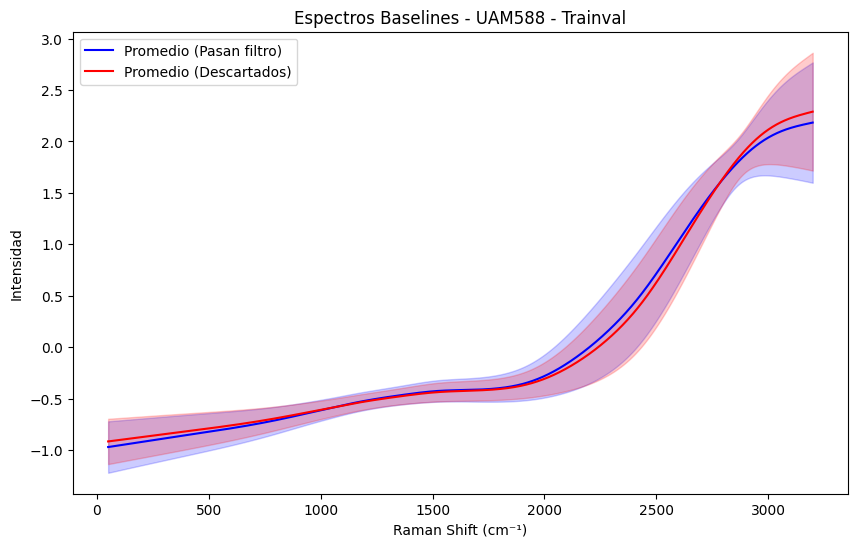

Especie: UAM565, 2608 espectros eliminados de un total de 9009


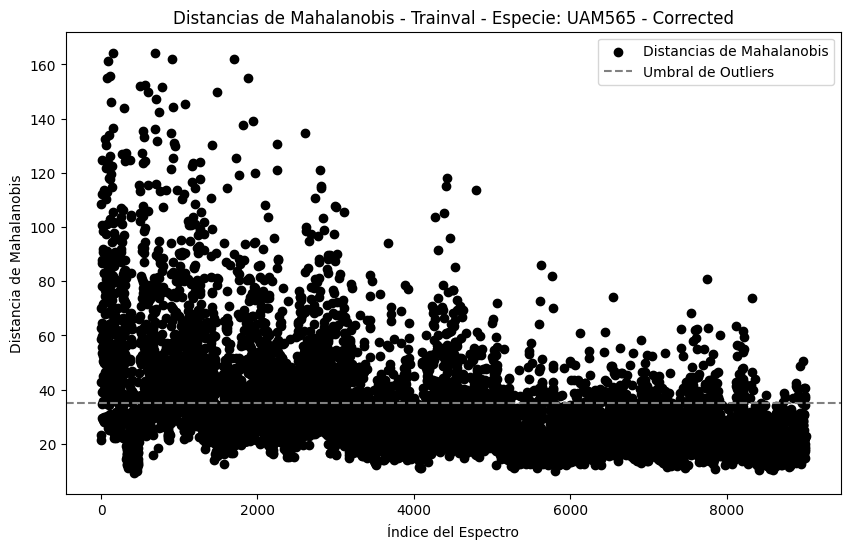

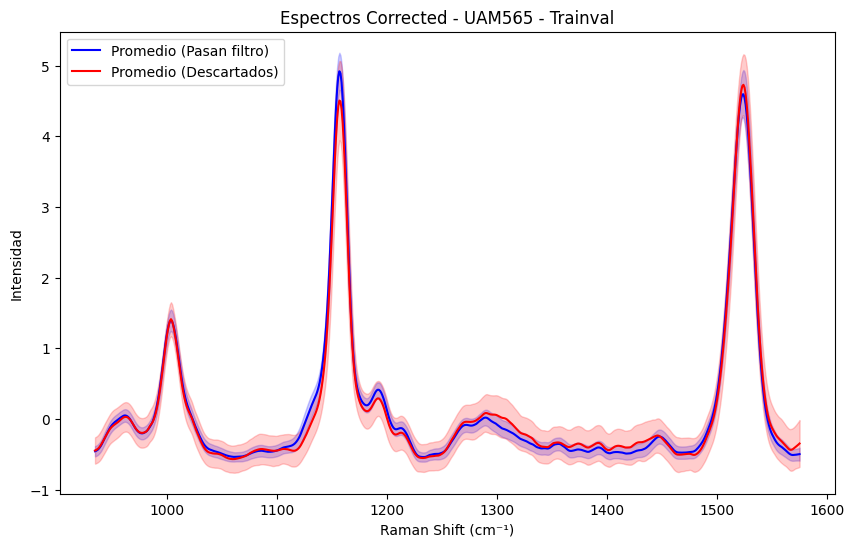

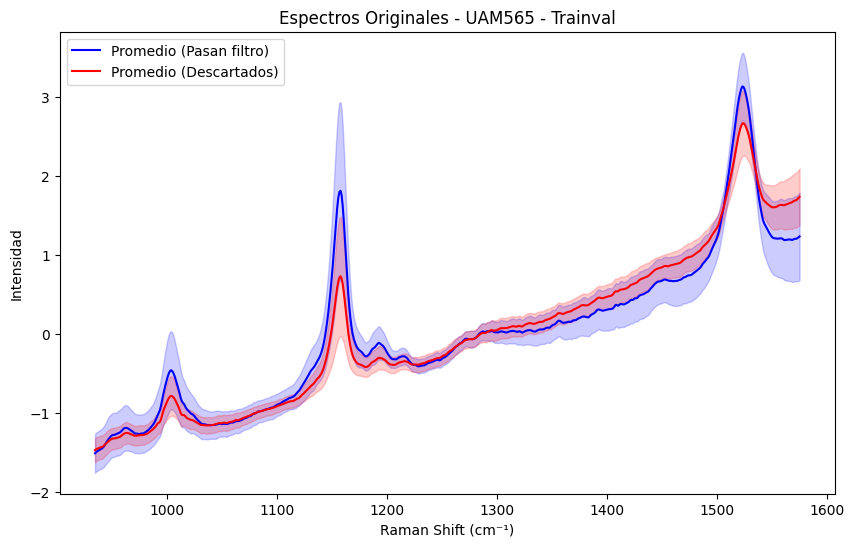

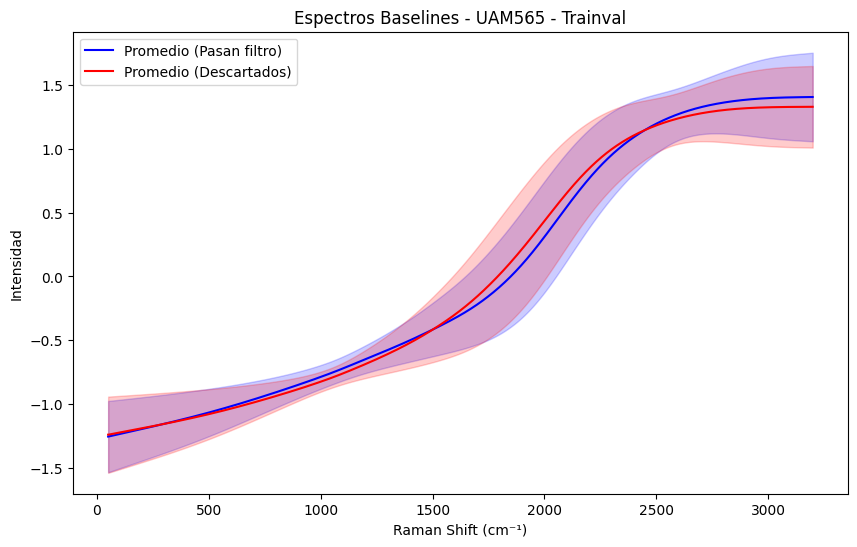

Especie: UAM253, 262 espectros eliminados de un total de 8353


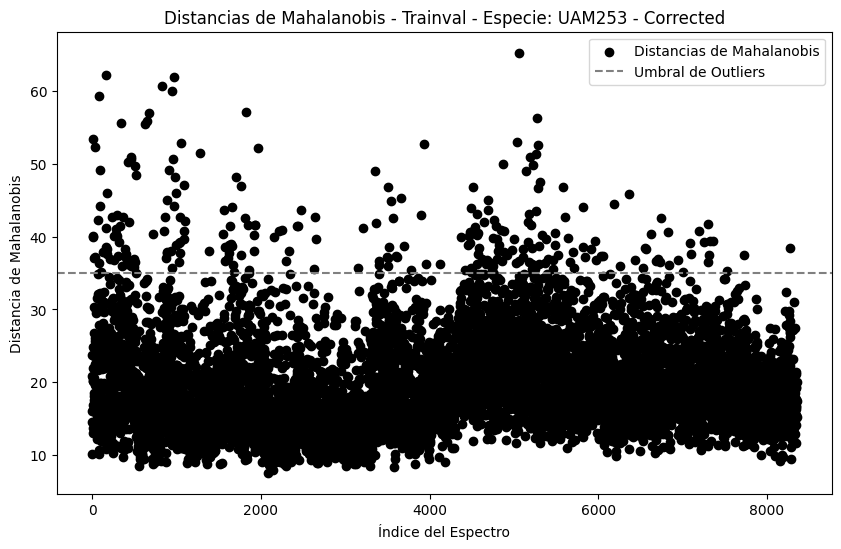

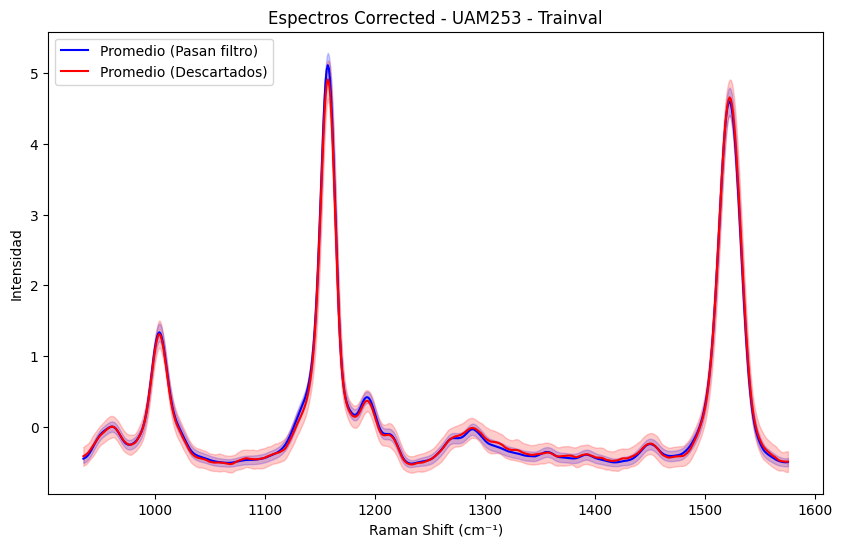

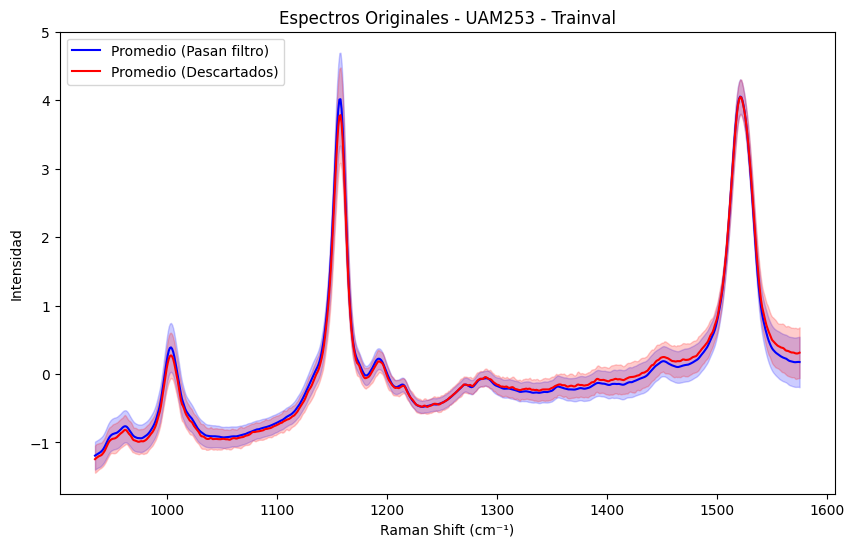

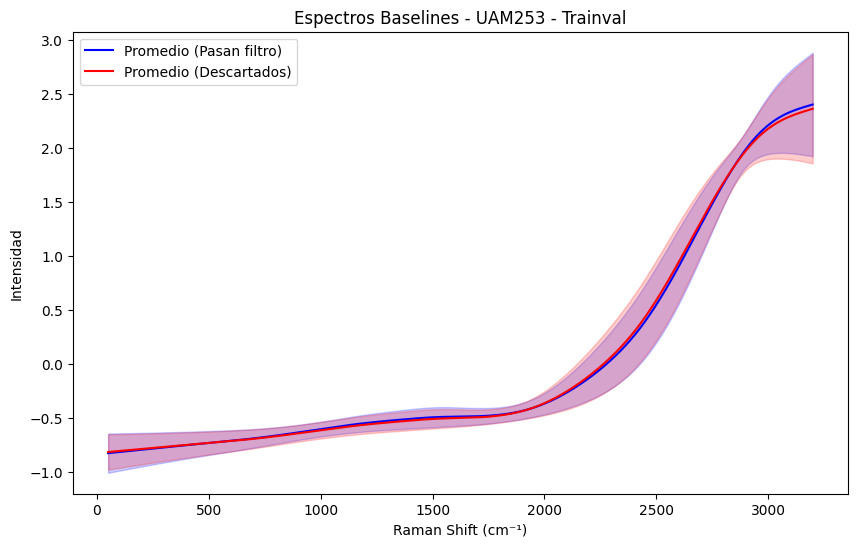

Especie: charco, 128 espectros eliminados de un total de 3033


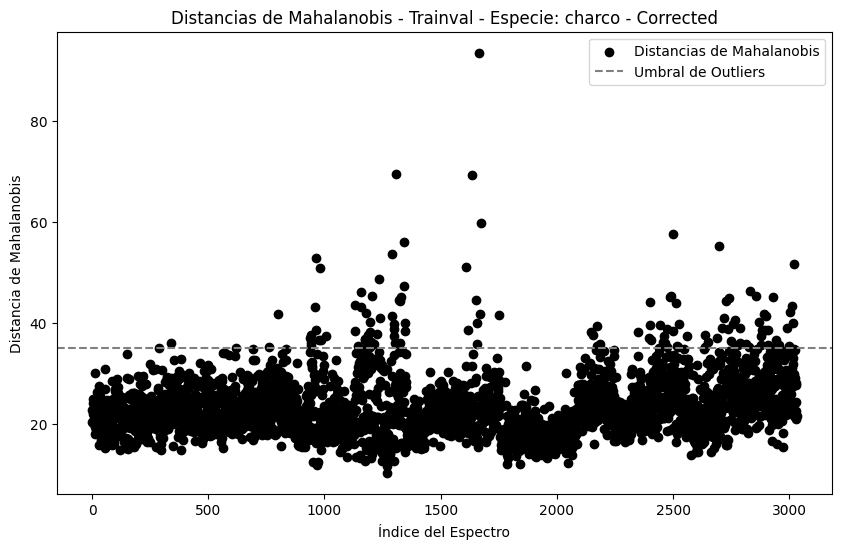

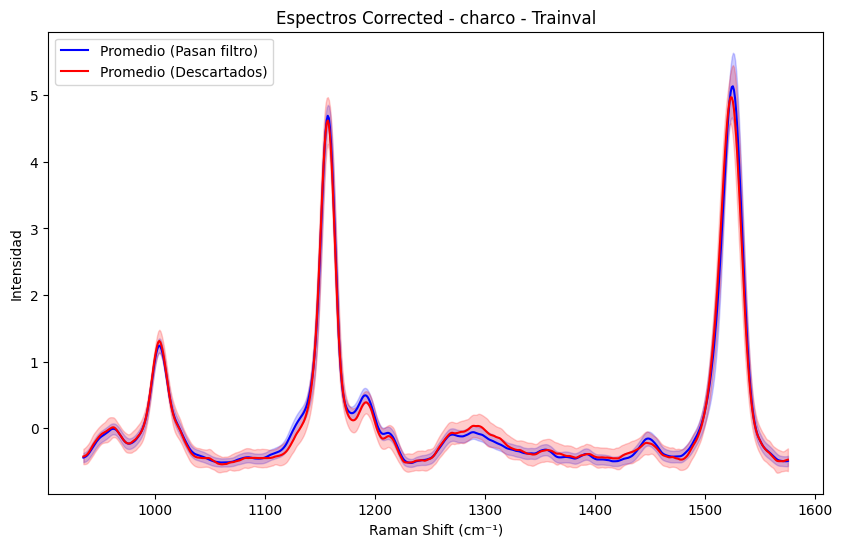

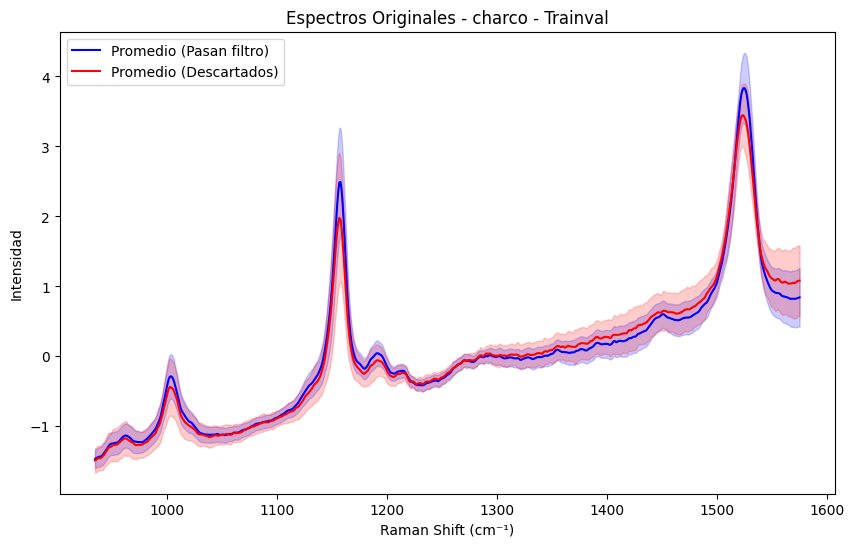

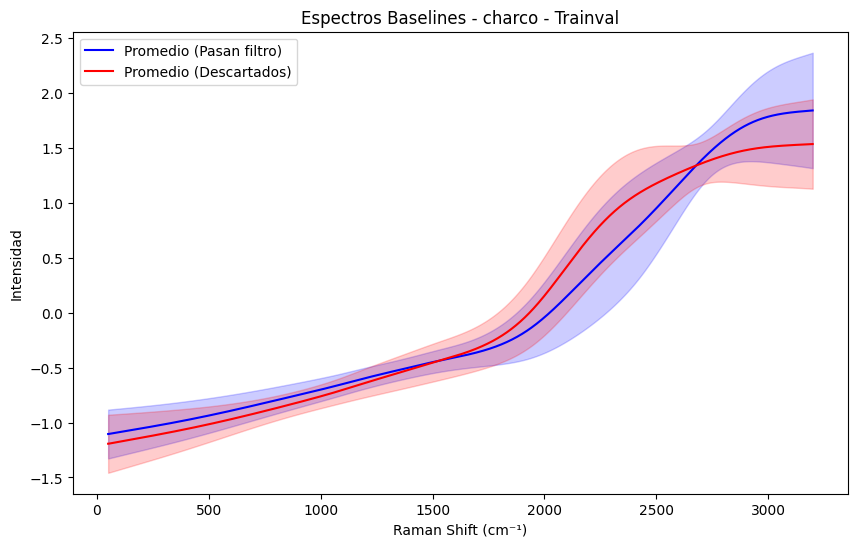

Especie: UAM502, 18 espectros eliminados de un total de 908


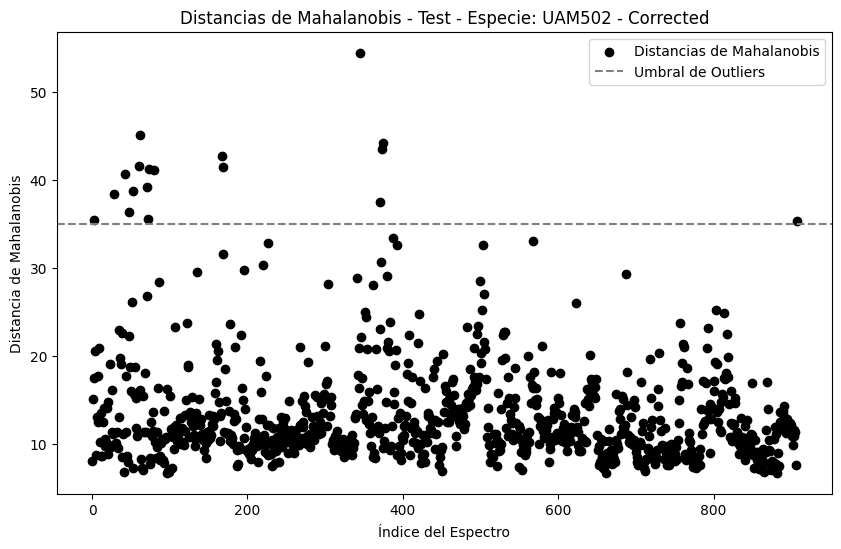

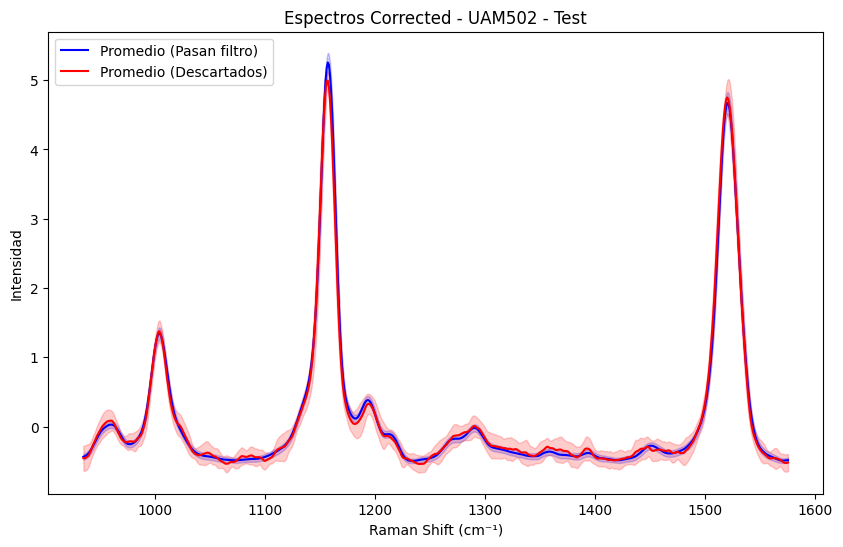

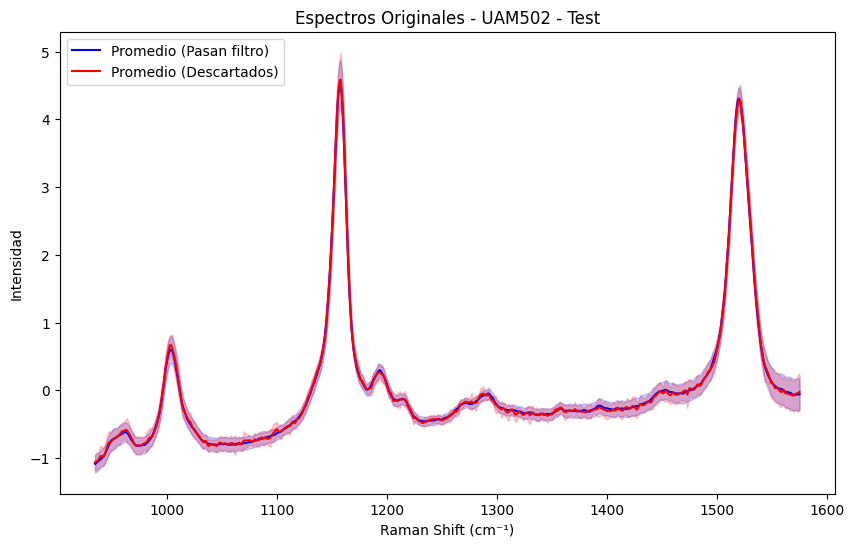

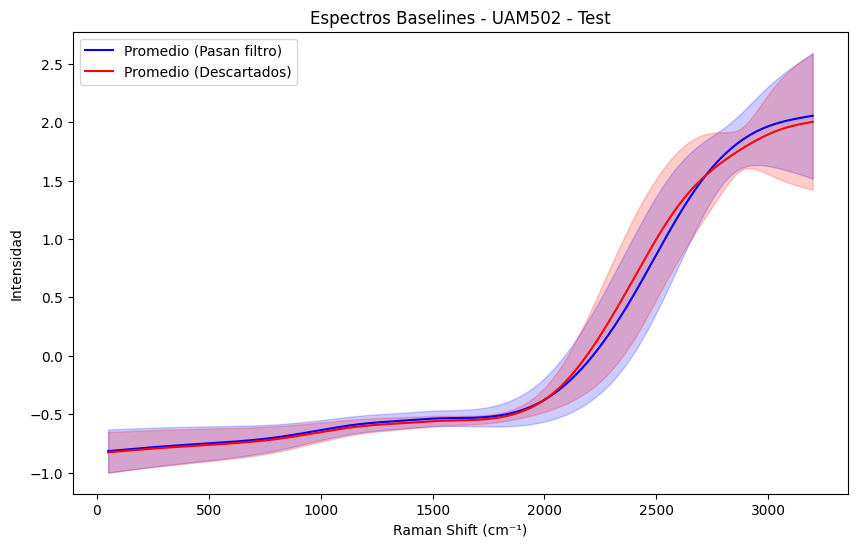

Especie: UAM588, 48 espectros eliminados de un total de 4021


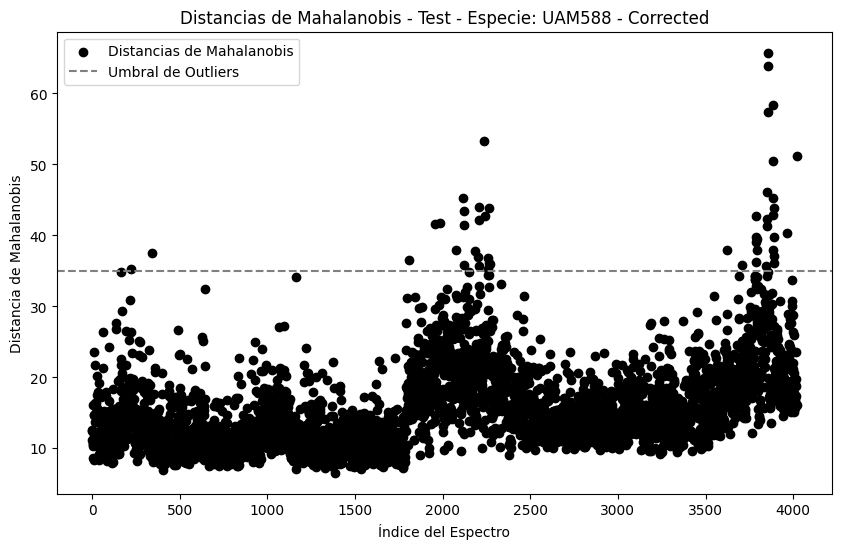

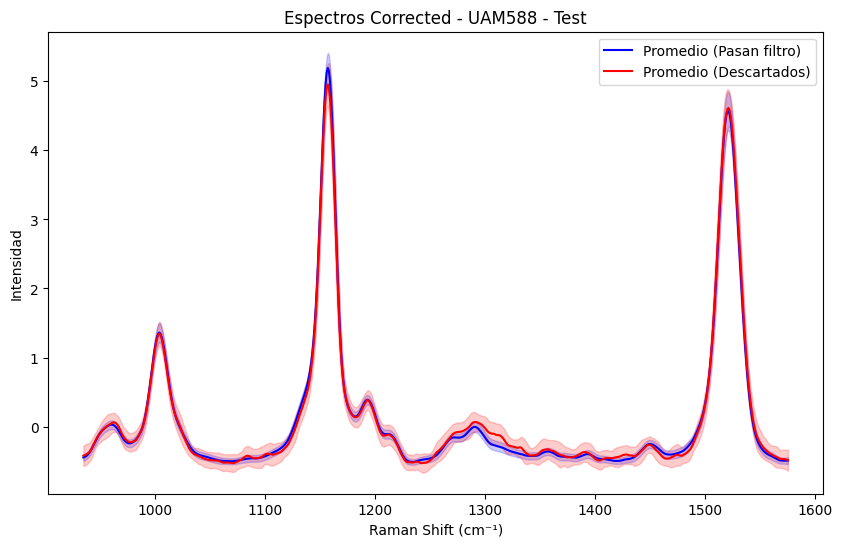

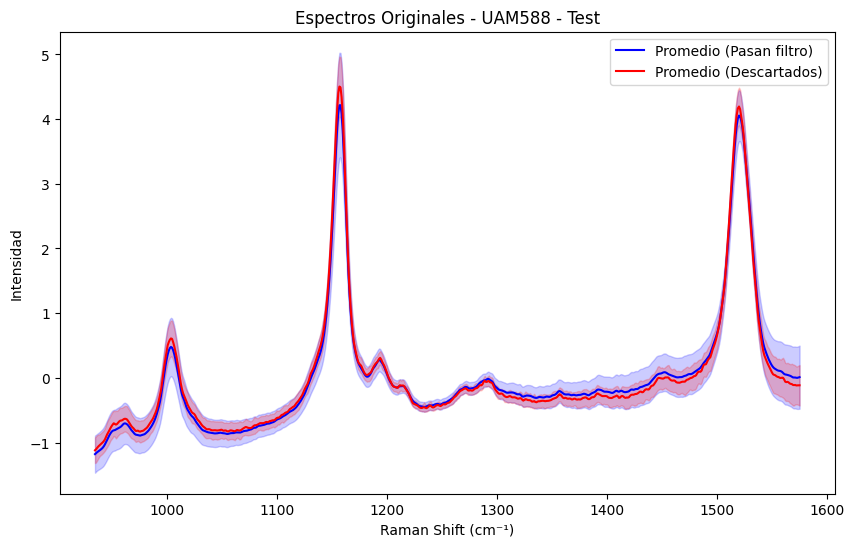

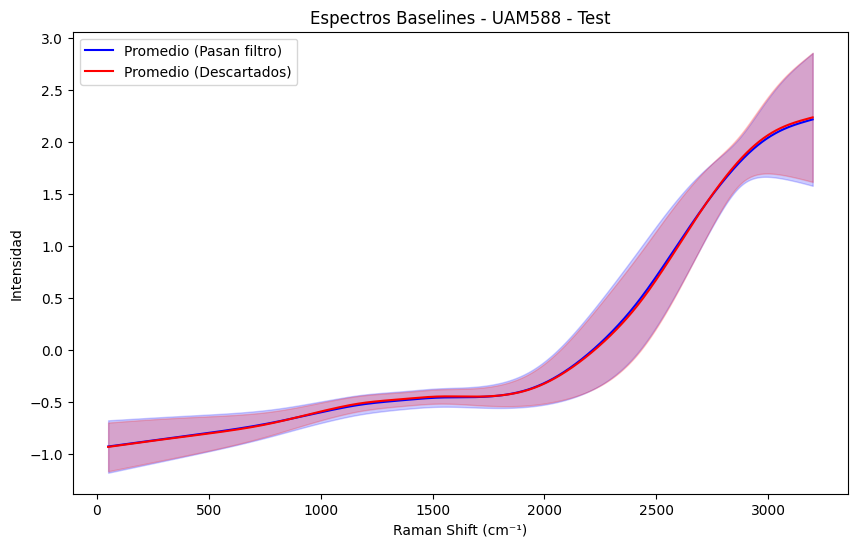

Especie: UAM565, 20 espectros eliminados de un total de 1414


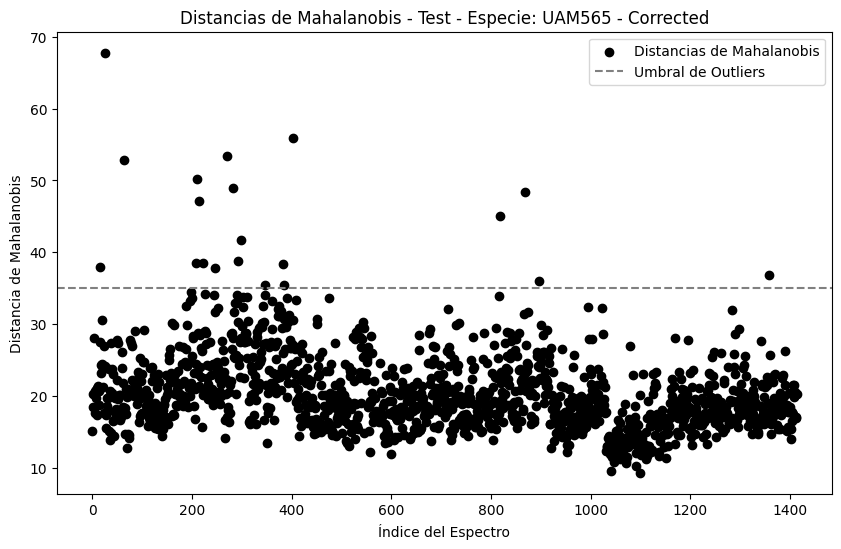

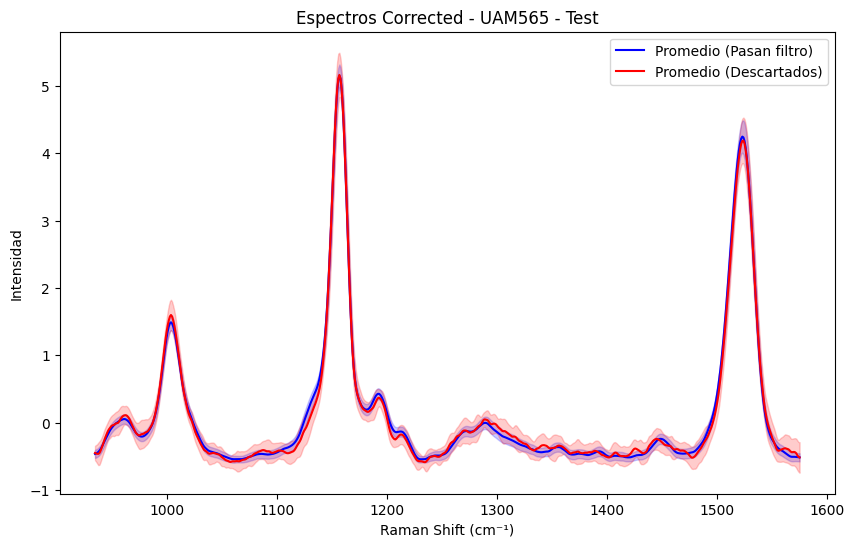

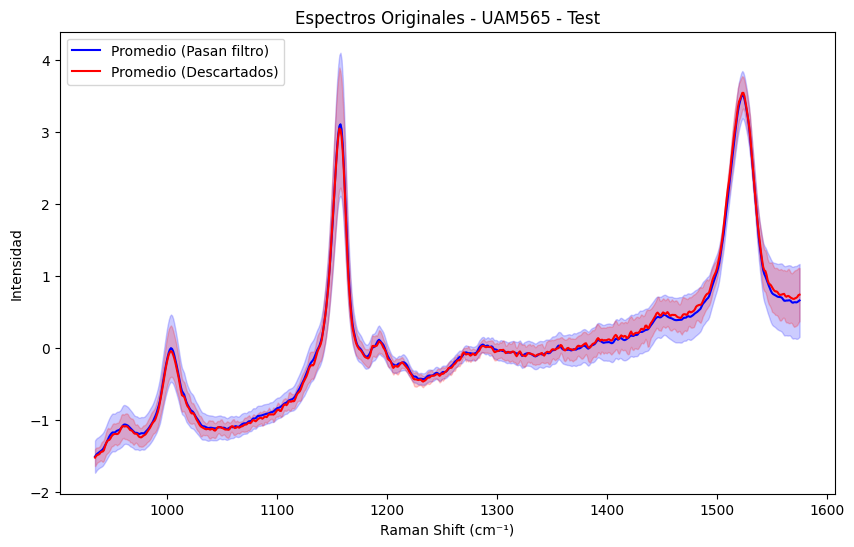

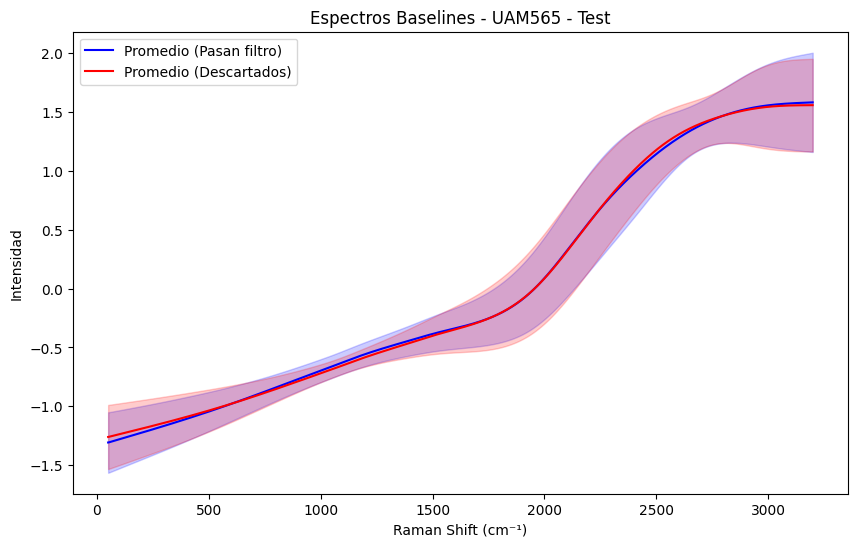

Especie: UAM253, 151 espectros eliminados de un total de 1634


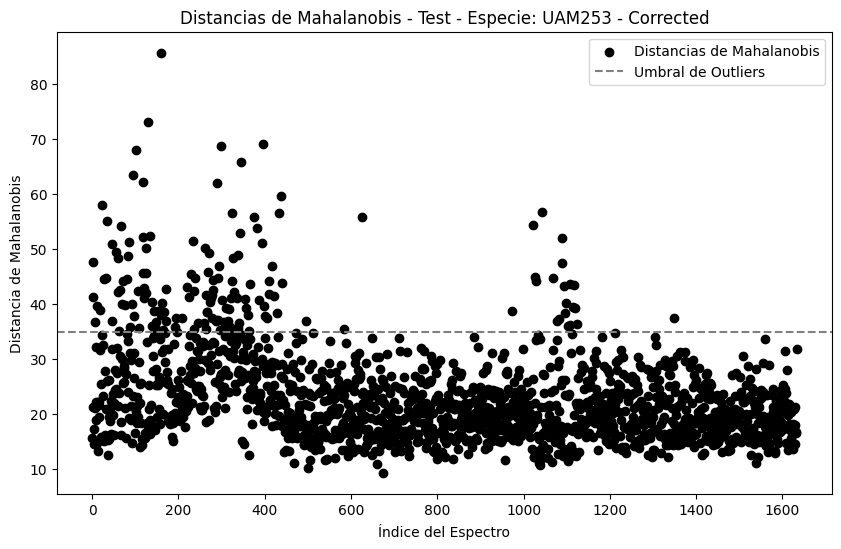

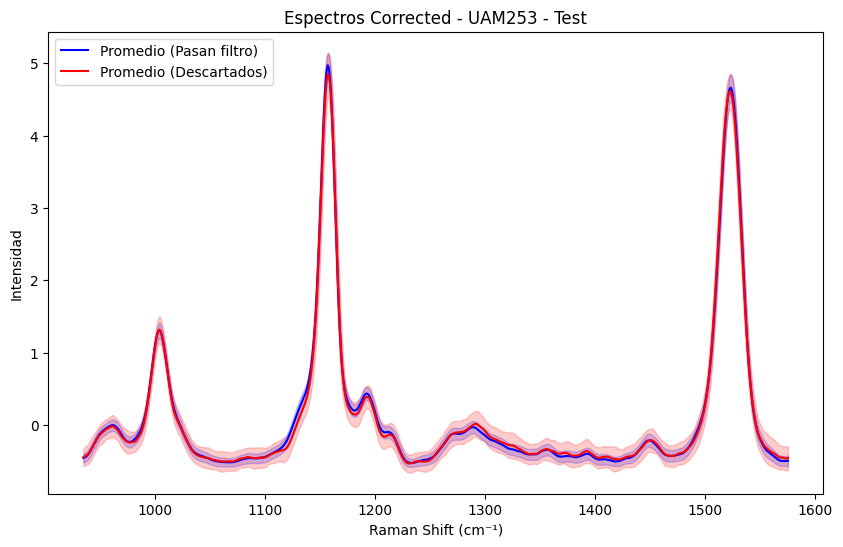

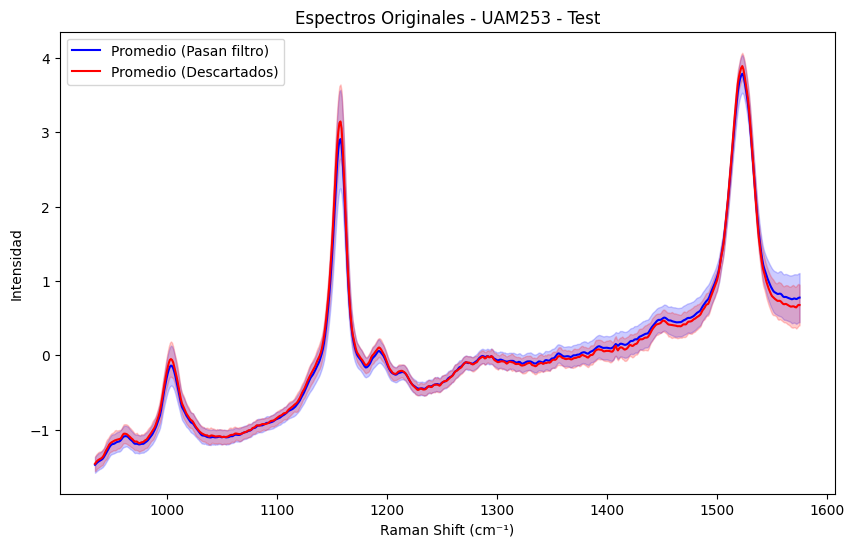

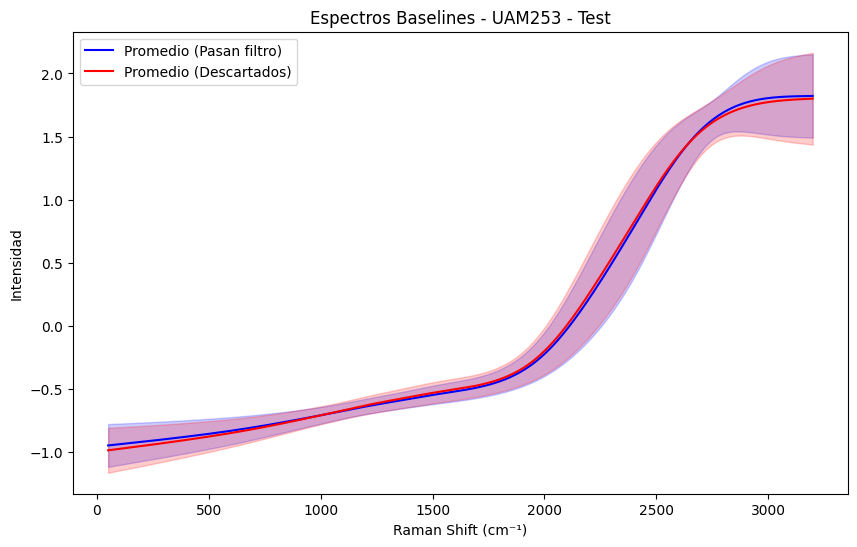

Especie: charco, 6 espectros eliminados de un total de 704


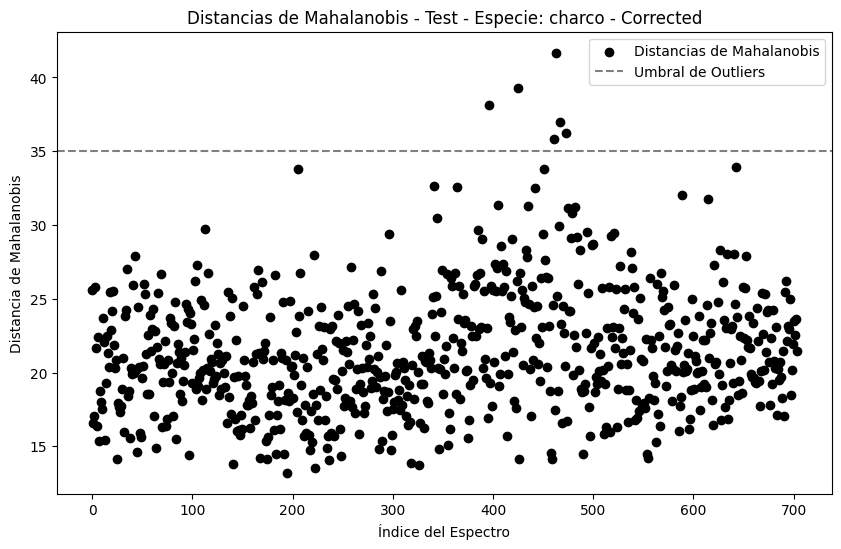

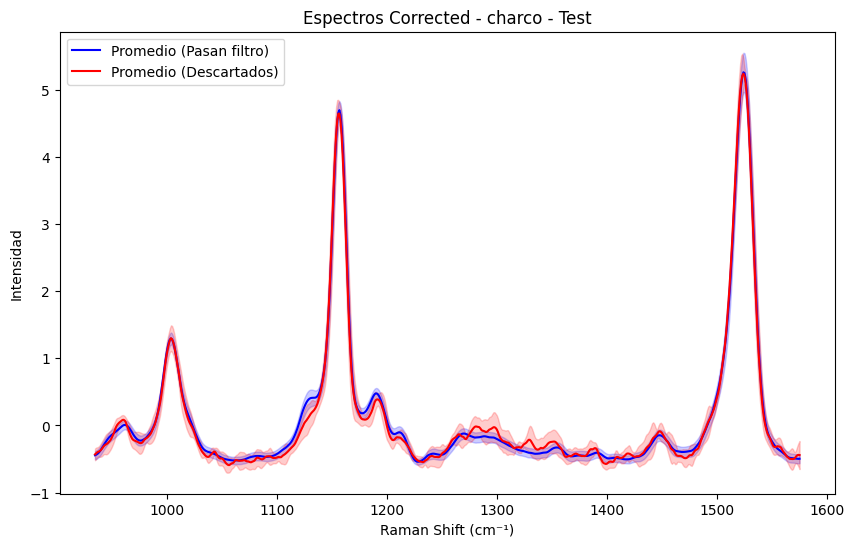

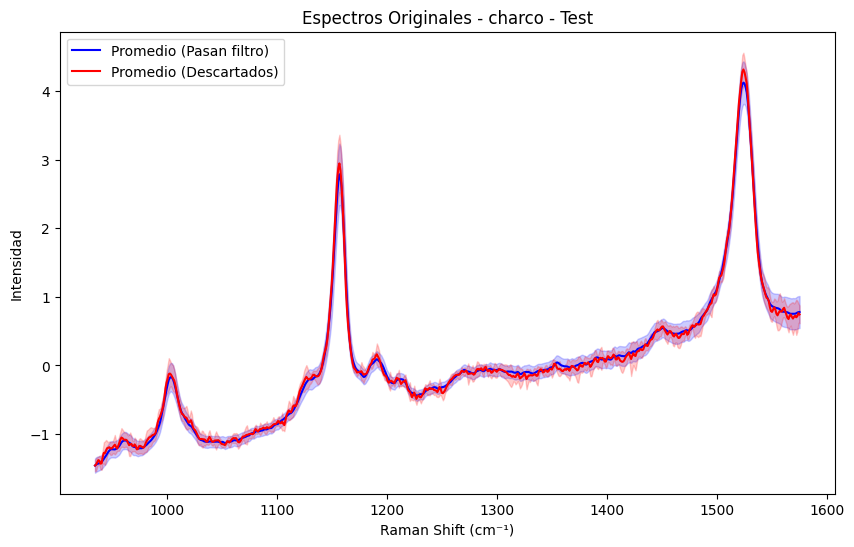

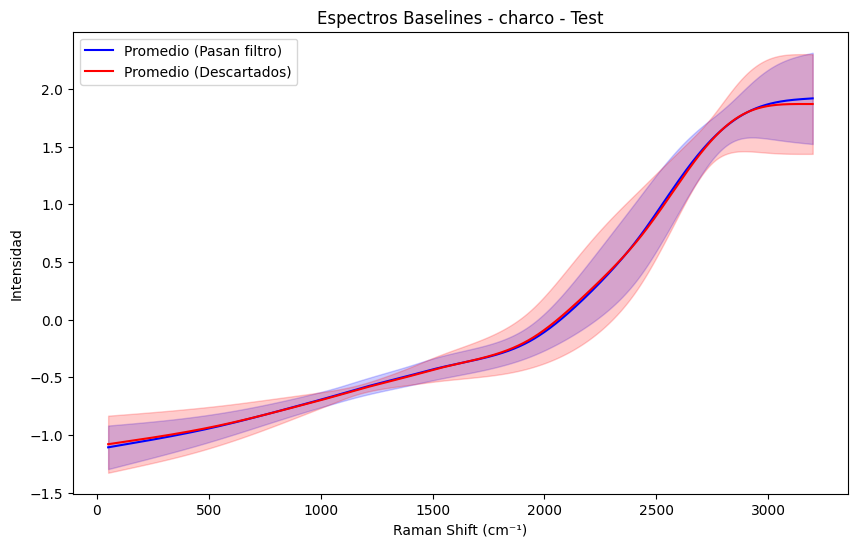

Filtrado completado en trainval y test, y archivos guardados.


In [20]:
import pandas as pd
import numpy as np
from scipy.spatial import distance
import matplotlib.pyplot as plt

# Función para graficar el espectro promedio y la desviación estándar
def plot_mean_and_std(df_passed, df_outliers, title, raman_shifts):
    plt.figure(figsize=(10, 6))
    
    # Calcular el promedio y la desviación estándar de los espectros que pasan el filtro
    if not df_passed.empty:
        mean_passed = df_passed.mean(axis=0)
        std_passed = df_passed.std(axis=0)
        plt.plot(raman_shifts, mean_passed, color='blue', label='Promedio (Pasan filtro)')
        plt.fill_between(raman_shifts, mean_passed - std_passed, mean_passed + std_passed, color='blue', alpha=0.2)
    
    # Calcular el promedio y la desviación estándar de los espectros descartados
    if not df_outliers.empty:
        mean_outliers = df_outliers.mean(axis=0)
        std_outliers = df_outliers.std(axis=0)
        plt.plot(raman_shifts, mean_outliers, color='red', label='Promedio (Descartados)')
        plt.fill_between(raman_shifts, mean_outliers - std_outliers, mean_outliers + std_outliers, color='red', alpha=0.2)

    plt.title(title)
    plt.xlabel("Raman Shift (cm⁻¹)")
    plt.ylabel("Intensidad")
    plt.legend()
    plt.show()

# Función para calcular la matriz de covarianza global e inversa, y el vector de medias
def compute_global_mahalanobis_params(df):
    # Excluir las columnas categóricas para calcular Mahalanobis
    df_numeric = df.drop(columns=categorical_columns + coordinates_columns + names_column)
    
    # Calcular la matriz de covarianza y su inversa
    cov_matrix = np.cov(df_numeric.T)
    inv_cov_matrix = np.linalg.inv(cov_matrix)
    
    # Calcular el vector de medias
    mean_vector = df_numeric.mean(axis=0)
    
    return inv_cov_matrix, mean_vector

# Función para aplicar el filtro de Mahalanobis en un DataFrame
def apply_mahalanobis_filter(df_test, inv_cov_matrix, mean_vector, threshold=35):
    df_test_numeric = df_test.drop(columns=categorical_columns + coordinates_columns + names_column)
    
    # Calcular la distancia de Mahalanobis para cada espectro en el test
    mahalanobis_distances = df_test_numeric.apply(lambda row: distance.mahalanobis(row, mean_vector, inv_cov_matrix), axis=1)
    
    # Definir el umbral de distancia
    outliers_mask = mahalanobis_distances > threshold
    
    return outliers_mask, mahalanobis_distances

# Función para filtrar y graficar los resultados (promedios y desviación estándar)
def filter_and_plot(df, outliers_mask, raman_shifts, title):
    df_passed = df[~outliers_mask].drop(columns=categorical_columns + coordinates_columns + names_column)
    df_outliers = df[outliers_mask].drop(columns=categorical_columns + coordinates_columns + names_column)
    
    plot_mean_and_std(df_passed, df_outliers, title, raman_shifts)
    
    return df_passed, df_outliers

# Definir las columnas categóricas y de coordenadas
categorical_columns = ['date', 't_exp', 'especie', 'medium']
coordinates_columns = ['X', 'Y']
names_column = ['name']

# 1. Cargar los datos de trainval
ruta = [
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_CORRECTED_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv',
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_ORIGINALES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv',
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_BASELINES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv'
]

df = pd.read_csv(ruta[0])
df_originales = pd.read_csv(ruta[1])
df_baselines = pd.read_csv(ruta[2])

# Definir los rangos de los espectros Raman
raman_shifts_corrected = np.arange(935, 1576, 1)  # Para corrected y originales
raman_shifts_baselines = np.arange(50, 3200, 1)  # Para baselines

# 2. Calcular la matriz de covarianza global e inversa, y el vector de medias en el conjunto total de trainval
inv_cov_matrix_global, mean_vector_global = compute_global_mahalanobis_params(df)

# 3. Aplicar el filtro de Mahalanobis en los datos de trainval (separado por especies)
outliers_indices_trainval = []

y_trainval = df['especie']  # Etiquetas de las clases (especies)

for species in y_trainval.unique():
    # Filtrar solo los datos de la especie actual
    species_mask = (y_trainval == species)
    df_species = df[species_mask]
    df_species_originales = df_originales[species_mask]
    df_species_baselines = df_baselines[species_mask]
    
    # Aplicar Mahalanobis a esta especie con la matriz de covarianza global
    outliers_mask_corrected, mahalanobis_distances_corrected = apply_mahalanobis_filter(df_species, inv_cov_matrix_global, mean_vector_global)

    # Contar los espectros descartados para esta especie
    eliminados = outliers_mask_corrected.sum()
    total = len(outliers_mask_corrected)
    print(f"Especie: {species}, {eliminados} espectros eliminados de un total de {total}")
    
    # Graficar las distancias de Mahalanobis para esta especie en corrected
    plt.figure(figsize=(10, 6))
    plt.scatter(range(len(mahalanobis_distances_corrected)), mahalanobis_distances_corrected, c='black', label='Distancias de Mahalanobis')
    plt.axhline(y=35, color='grey', linestyle='--', label="Umbral de Outliers")
    plt.title(f"Distancias de Mahalanobis - Trainval - Especie: {species} - Corrected")
    plt.xlabel("Índice del Espectro")
    plt.ylabel("Distancia de Mahalanobis")
    plt.legend()
    plt.show()

    # Filtrar y graficar los promedios y desviaciones estándar para corrected
    filter_and_plot(df_species, outliers_mask_corrected, raman_shifts_corrected, f"Espectros Corrected - {species} - Trainval")
    # Filtrar y graficar los promedios y desviaciones estándar para originales y baselines por especie
    filter_and_plot(df_species_originales, df_species_originales.index.isin(df_species.index[outliers_mask_corrected]), raman_shifts_corrected, f"Espectros Originales - {species} - Trainval")
    filter_and_plot(df_species_baselines, df_species_baselines.index.isin(df_species.index[outliers_mask_corrected]), raman_shifts_baselines, f"Espectros Baselines - {species} - Trainval")

    # Almacenar los índices de outliers
    outliers_indices_trainval.extend(df_species.index[outliers_mask_corrected])

# Eliminar los outliers en los tres DataFrames de trainval usando los índices de corrected
df_filtered = df.drop(outliers_indices_trainval)
df_originales_filtered = df_originales.drop(outliers_indices_trainval)
df_baselines_filtered = df_baselines.drop(outliers_indices_trainval)

# Guardar los DataFrames filtrados de trainval
df_filtered.to_csv(ruta[0].replace('.csv', '_WITHOUTOUTLIERS2.csv'), index=False)
df_originales_filtered.to_csv(ruta[1].replace('.csv', '_WITHOUTOUTLIERS2.csv'), index=False)
df_baselines_filtered.to_csv(ruta[2].replace('.csv', '_WITHOUTOUTLIERS2.csv'), index=False)

# 4. Aplicar el filtro de Mahalanobis global a los datos de test
test_paths = [
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_CORRECTED_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv',
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_ORIGINALES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv',
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_BASELINES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv'
]

df_test_corrected = pd.read_csv(test_paths[0])
df_test_originales = pd.read_csv(test_paths[1])
df_test_baselines = pd.read_csv(test_paths[2])

y_test = df_test_corrected['especie']

# Aplicar el filtro de Mahalanobis en test
outliers_indices_test = []

for species in y_test.unique():
    # Filtrar solo los datos de la especie actual en test
    species_mask_test = (y_test == species)
    df_species_test_corrected = df_test_corrected[species_mask_test]
    df_species_test_originales = df_test_originales[species_mask_test]
    df_species_test_baselines = df_test_baselines[species_mask_test]
    
    # Aplicar Mahalanobis a esta especie en test con la matriz global
    outliers_mask_test_corrected, mahalanobis_distances_test_corrected = apply_mahalanobis_filter(df_species_test_corrected, inv_cov_matrix_global, mean_vector_global)
    
    outliers_indices_test.extend(df_species_test_corrected.index[outliers_mask_test_corrected])

    # Contar los espectros descartados para esta especie
    eliminados = outliers_mask_test_corrected.sum()
    total = len(outliers_mask_test_corrected)
    print(f"Especie: {species}, {eliminados} espectros eliminados de un total de {total}")

    # Graficar las distancias de Mahalanobis para test (corrected)
    plt.figure(figsize=(10, 6))
    plt.scatter(range(len(mahalanobis_distances_test_corrected)), mahalanobis_distances_test_corrected, c='black', label='Distancias de Mahalanobis')
    plt.axhline(y=35, color='grey', linestyle='--', label="Umbral de Outliers")
    plt.title(f"Distancias de Mahalanobis - Test - Especie: {species} - Corrected")
    plt.xlabel("Índice del Espectro")
    plt.ylabel("Distancia de Mahalanobis")
    plt.legend()
    plt.show()

    # Filtrar y graficar los promedios y desviaciones estándar para corrected por especie en test
    filter_and_plot(df_species_test_corrected, outliers_mask_test_corrected, raman_shifts_corrected, f"Espectros Corrected - {species} - Test")
    # Filtrar y graficar los promedios y desviaciones estándar para originales y baselines por especie en test
    filter_and_plot(df_species_test_originales, df_species_test_originales.index.isin(df_species_test_corrected.index[outliers_mask_test_corrected]), raman_shifts_corrected, f"Espectros Originales - {species} - Test")
    filter_and_plot(df_species_test_baselines, df_species_test_baselines.index.isin(df_species_test_corrected.index[outliers_mask_test_corrected]), raman_shifts_baselines, f"Espectros Baselines - {species} - Test")

# Eliminar los outliers en los tres DataFrames de test usando los índices de corrected
df_test_corrected_filtered = df_test_corrected.drop(outliers_indices_test)
df_test_originales_filtered = df_test_originales.drop(outliers_indices_test)
df_test_baselines_filtered = df_test_baselines.drop(outliers_indices_test)

# Guardar los DataFrames filtrados de test
df_test_corrected_filtered.to_csv(test_paths[0].replace('.csv', '_WITHOUTOUTLIERS2.csv'), index=False)
df_test_originales_filtered.to_csv(test_paths[1].replace('.csv', '_WITHOUTOUTLIERS2.csv'), index=False)
df_test_baselines_filtered.to_csv(test_paths[2].replace('.csv', '_WITHOUTOUTLIERS2.csv'), index=False)

print("Filtrado completado en trainval y test, y archivos guardados.")


## MÁS OBJETIVO, K-MEANS + UMBRAL AUTOMÁTICO

In [ ]:
df_test_corrected_filtered

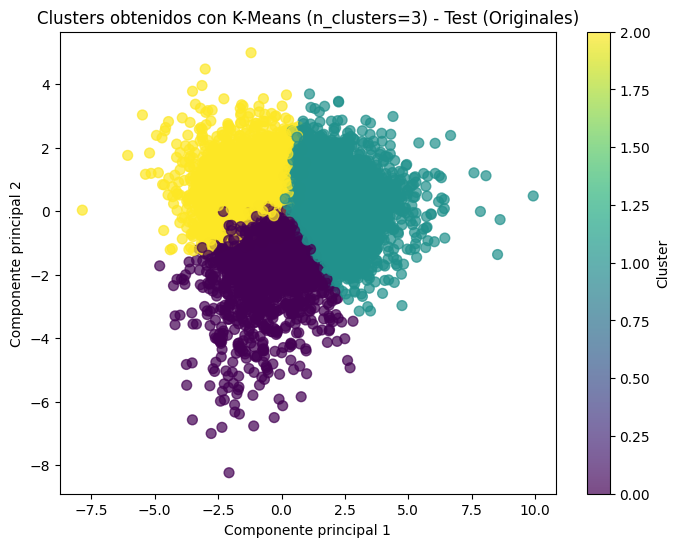

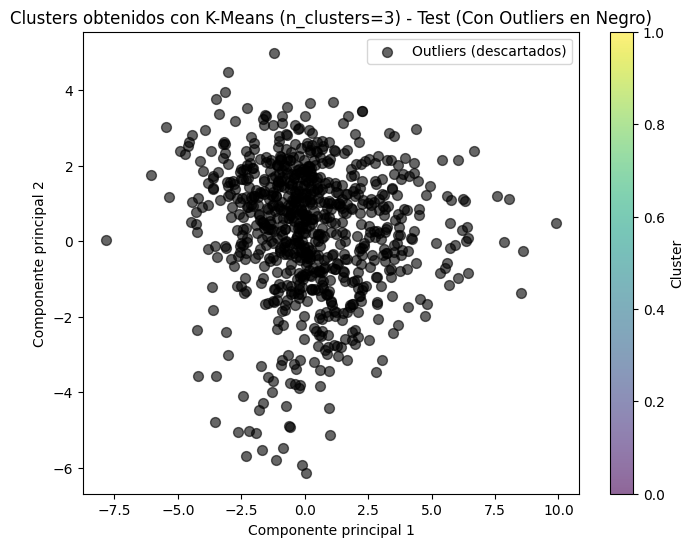

In [63]:
# Función para graficar clusters con puntos descartados en negro
def plot_clusters_with_outliers(data_2d, clusters, outliers_mask, title):
    plt.figure(figsize=(8, 6))
    
    # Graficar los espectros descartados en negro
    plt.scatter(data_2d[outliers_mask, 0], data_2d[outliers_mask, 1], color='black', label='Outliers (descartados)', s=50, alpha=0.6)
    

    
    plt.xlabel('Componente principal 1')
    plt.ylabel('Componente principal 2')
    plt.title(title)
    plt.legend()
    plt.colorbar(label='Cluster')
    plt.show()

# --- INTEGRACIÓN EN EL FLUJO ORIGINAL ---
# Reducir dimensionalidad para los clusters de test
reduced_data_test = reduce_dimensionality_with_pca(df_test_numeric, n_components=2)

# Máscara global de outliers en el conjunto de test
outliers_mask_global = np.isin(df_test_corrected.index, outliers_indices_test)

# Visualizar los clusters originales (antes del filtrado)
plt.figure(figsize=(8, 6))
plt.scatter(reduced_data_test[:, 0], reduced_data_test[:, 1], c=clusters_test, cmap='viridis', s=50, alpha=0.7)
plt.xlabel('Componente principal 1')
plt.ylabel('Componente principal 2')
plt.title(f"Clusters obtenidos con K-Means (n_clusters={n_clusters}) - Test (Originales)")
plt.colorbar(label='Cluster')
plt.show()

# Visualizar los clusters con outliers marcados en negro
plot_clusters_with_outliers(
    reduced_data_test,
    clusters_test,
    outliers_mask_global,
    title=f"Clusters obtenidos con K-Means (n_clusters={n_clusters}) - Test (Con Outliers en Negro)"
)


Conteo inicial de espectros por 'especie' en Corrected:
especie
UAM588    4021
UAM253    1634
UAM565    1414
UAM502     908
Name: count, dtype: int64
Calculando número óptimo de clusters para Corrected...


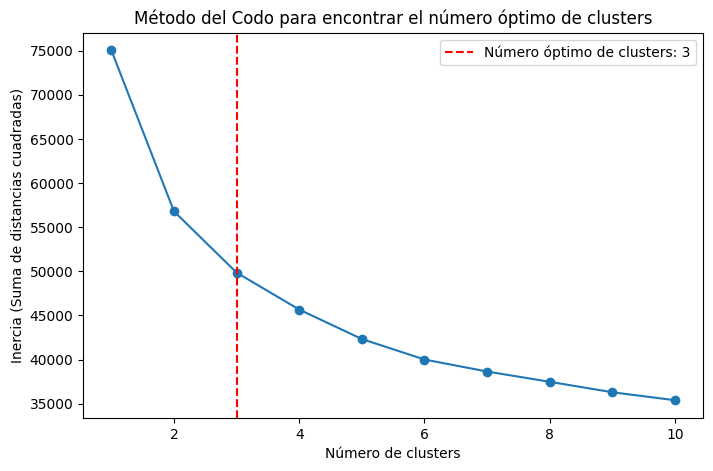

Número óptimo de clusters: 3


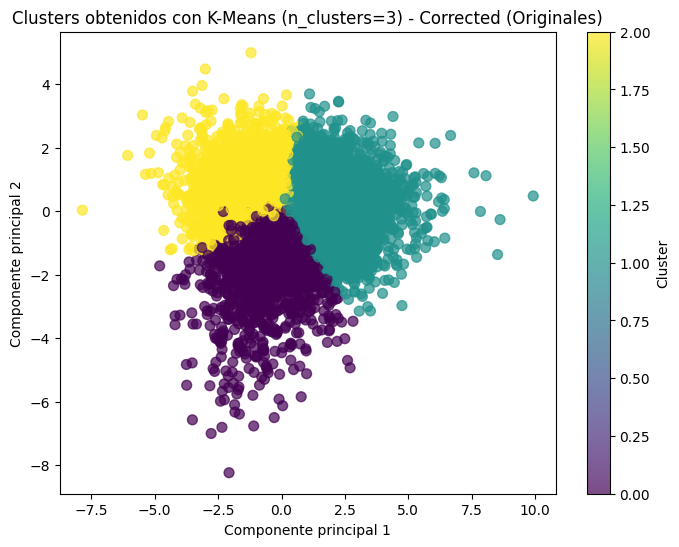

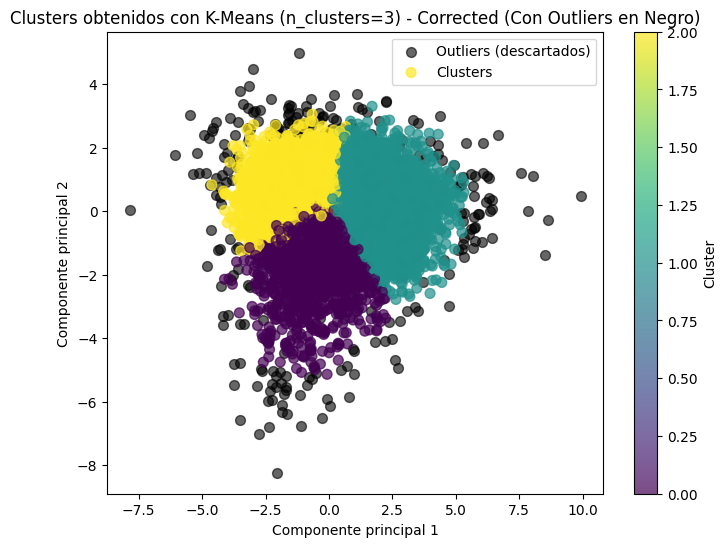

Número de puntos eliminados en Corrected: 400

Conteo final de espectros por 'especie' en Corrected:
especie
UAM588    3878
UAM253    1456
UAM565    1365
UAM502     878
Name: count, dtype: int64
Datasets filtrados guardados en:
  Corrected: C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_CORRECTED_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_kmeans_euclideandistance_TEST2.csv
  Originals: C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_ORIGINALES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_kmeans_euclideandistance_TEST2.csv
  Baselines: C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_BASELINES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_kmeans_euclideandistanc

In [74]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from kneed import KneeLocator

# Función para calcular el número óptimo de clusters usando el método del codo
def find_optimal_clusters(data, max_k=10):
    inertia = []
    for k in range(1, max_k + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        inertia.append(kmeans.inertia_)
    
    # Encontrar el codo automáticamente
    kneedle = KneeLocator(range(1, max_k + 1), inertia, curve="convex", direction="decreasing")
    optimal_k = kneedle.elbow

    # Graficar el método del codo
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, max_k + 1), inertia, marker='o')
    plt.axvline(optimal_k, color='red', linestyle='--', label=f'Número óptimo de clusters: {optimal_k}')
    plt.xlabel('Número de clusters')
    plt.ylabel('Inercia (Suma de distancias cuadradas)')
    plt.title('Método del Codo para encontrar el número óptimo de clusters')
    plt.legend()
    plt.show()

    return optimal_k

# Función para reducir dimensionalidad con PCA
def reduce_dimensionality_with_pca(data, n_components=2):
    pca = PCA(n_components=n_components)
    reduced_data = pca.fit_transform(data)
    return reduced_data

# Función para graficar clusters con puntos descartados en negro
def plot_clusters_with_outliers(data_2d, clusters, outliers_mask, title):
    plt.figure(figsize=(8, 6))
    # Graficar los espectros descartados en negro
    plt.scatter(data_2d[outliers_mask, 0], data_2d[outliers_mask, 1], color='black', label='Outliers (descartados)', s=50, alpha=0.6)
    # Graficar los espectros que pasan el filtro, coloreados por cluster
    plt.scatter(data_2d[~outliers_mask, 0], data_2d[~outliers_mask, 1], c=clusters[~outliers_mask], cmap='viridis', s=50, alpha=0.7, label='Clusters')
    plt.xlabel('Componente principal 1')
    plt.ylabel('Componente principal 2')
    plt.title(title)
    plt.legend()
    plt.colorbar(label='Cluster')
    plt.show()

# Función para calcular distancias al centroide y filtrar outliers
def filter_outliers_by_distance(data, clusters, centroids, percentile=95):
    distances = np.zeros(len(data))
    outliers_mask = np.zeros(len(data), dtype=bool)
    for cluster_num in np.unique(clusters):
        cluster_mask = (clusters == cluster_num)
        cluster_data = data[cluster_mask]
        cluster_centroid = centroids[cluster_num]
        # Calcular distancias al centroide para este cluster
        cluster_distances = np.linalg.norm(cluster_data - cluster_centroid, axis=1)
        distances[cluster_mask] = cluster_distances
        # Definir umbral de outliers
        threshold = np.percentile(cluster_distances, percentile)
        outliers_mask[cluster_mask] = cluster_distances > threshold
    return outliers_mask, distances

# --- INICIO DEL PROCESO ---
# Rutas de los datasets
datasets = {
    "Corrected": r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_CORRECTED_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv',
    "Originals": r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_ORIGINALES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv',
    "Baselines": r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_BASELINES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES.csv'
}

# Cargar los tres datasets
df_corrected = pd.read_csv(datasets["Corrected"])
df_corrected = df_corrected[df_corrected['especie'] != 'charco']

df_originals = pd.read_csv(datasets["Originals"])
df_originals = df_originals[df_originals['especie'] != 'charco']

df_baselines = pd.read_csv(datasets["Baselines"])
df_baselines = df_baselines[df_baselines['especie'] != 'charco']

# Conteo inicial por especie en Corrected
print("Conteo inicial de espectros por 'especie' en Corrected:")
print(df_corrected['especie'].value_counts())

# Preprocesamiento: eliminar columnas categóricas
categorical_columns = ['date', 't_exp', 'especie', 'medium']
coordinates_columns = ['X', 'Y']
names_column = ['name']
df_corrected_numeric = df_corrected.drop(columns=categorical_columns + coordinates_columns + names_column)

# Determinar el número óptimo de clusters usando el método del codo
print("Calculando número óptimo de clusters para Corrected...")
n_clusters = find_optimal_clusters(df_corrected_numeric.values, max_k=10)
print(f"Número óptimo de clusters: {n_clusters}")

# Aplicar K-Means con el número óptimo de clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters_corrected = kmeans.fit_predict(df_corrected_numeric)
centroids_corrected = kmeans.cluster_centers_

# Reducir dimensionalidad para visualización
reduced_data_corrected = reduce_dimensionality_with_pca(df_corrected_numeric.values, n_components=2)

# Graficar los clusters originales (antes del filtrado)
plt.figure(figsize=(8, 6))
plt.scatter(reduced_data_corrected[:, 0], reduced_data_corrected[:, 1], c=clusters_corrected, cmap='viridis', s=50, alpha=0.7)
plt.xlabel('Componente principal 1')
plt.ylabel('Componente principal 2')
plt.title(f"Clusters obtenidos con K-Means (n_clusters={n_clusters}) - Corrected (Originales)")
plt.colorbar(label='Cluster')
plt.show()

# Filtrar outliers basado en la distancia al centroide
outliers_mask_corrected, distances_corrected = filter_outliers_by_distance(
    df_corrected_numeric.values, clusters_corrected, centroids_corrected, percentile=95
)

# Graficar los clusters con outliers marcados en negro
plot_clusters_with_outliers(
    reduced_data_corrected,
    clusters_corrected,
    outliers_mask_corrected,
    title=f"Clusters obtenidos con K-Means (n_clusters={n_clusters}) - Corrected (Con Outliers en Negro)"
)

# Obtener los índices de los outliers
outliers_indices = df_corrected.index[outliers_mask_corrected]
print(f"Número de puntos eliminados en Corrected: {len(outliers_indices)}")

# Eliminar los outliers en Corrected, Originals y Baselines
df_corrected_filtered = df_corrected.drop(outliers_indices)
df_originals_filtered = df_originals.drop(outliers_indices)
df_baselines_filtered = df_baselines.drop(outliers_indices)

# Conteo final por especie
print("\nConteo final de espectros por 'especie' en Corrected:")
print(df_corrected_filtered['especie'].value_counts())

# Guardar los datasets filtrados
filtered_corrected_path = datasets["Corrected"].replace('.csv', '_WITHOUTOUTLIERS_kmeans_euclideandistance_TEST2.csv')
filtered_originals_path = datasets["Originals"].replace('.csv', '_WITHOUTOUTLIERS_kmeans_euclideandistance_TEST2.csv')
filtered_baselines_path = datasets["Baselines"].replace('.csv', '_WITHOUTOUTLIERS_kmeans_euclideandistance_TEST2.csv')

df_corrected_filtered.to_csv(filtered_corrected_path, index=False)
df_originals_filtered.to_csv(filtered_originals_path, index=False)
df_baselines_filtered.to_csv(filtered_baselines_path, index=False)

print(f"Datasets filtrados guardados en:\n  Corrected: {filtered_corrected_path}\n  Originals: {filtered_originals_path}\n  Baselines: {filtered_baselines_path}")




# Representación de los espectros filtrados y descartados en mapa de coordenadas

## CONJUNTO MIX

In [79]:
categorical_columns

['date', 't_exp', 'especie', 'medium']

Distribución de especies antes de aplicar K-Means (trainval):
especie
UAM502    11342
UAM588    10938
UAM565     9009
UAM253     8353
Name: count, dtype: int64

Distribución de especies después del filtrado (test):
especie
UAM588    3878
UAM253    1456
UAM565    1365
UAM502     878
Name: count, dtype: int64


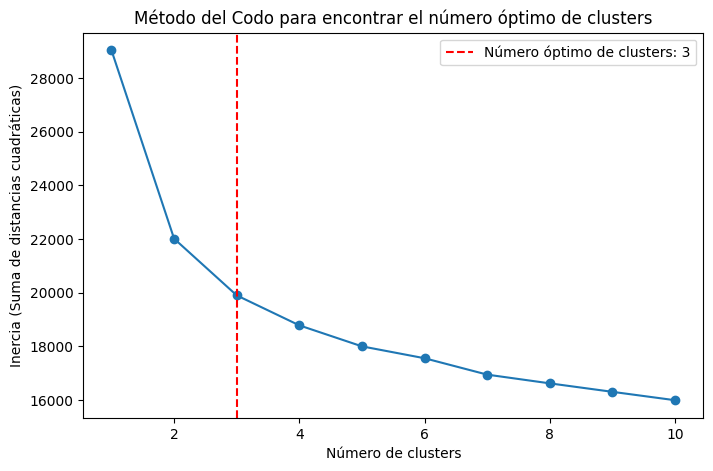

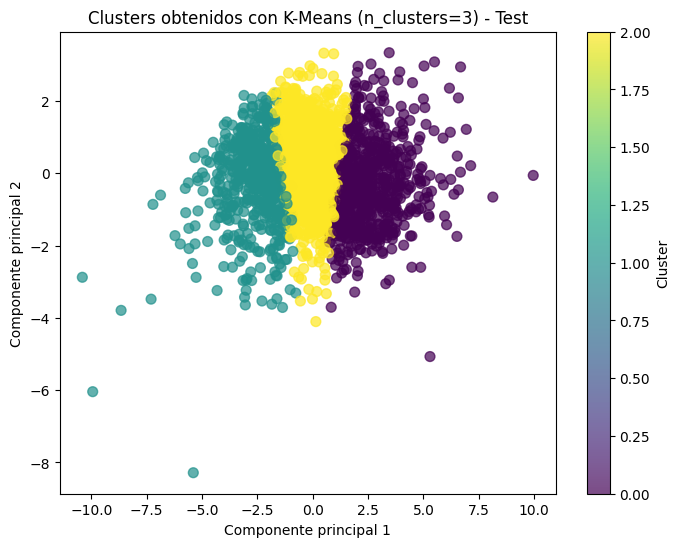

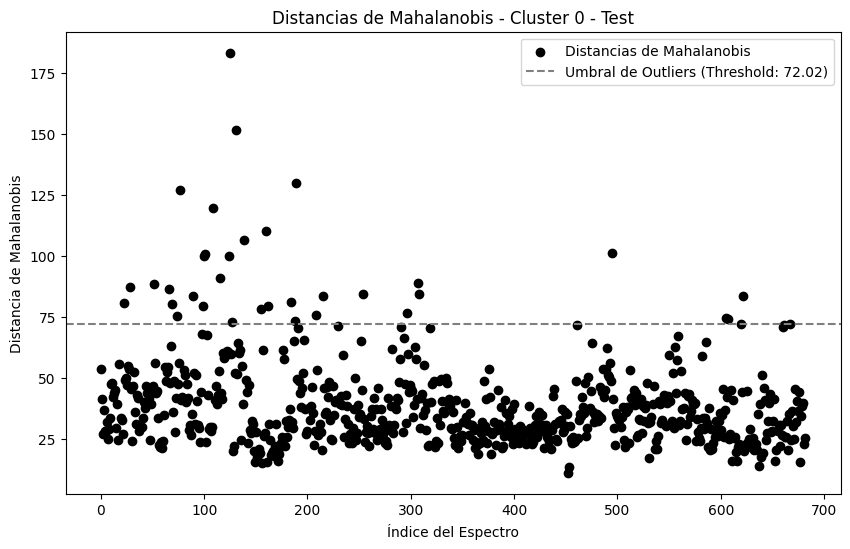

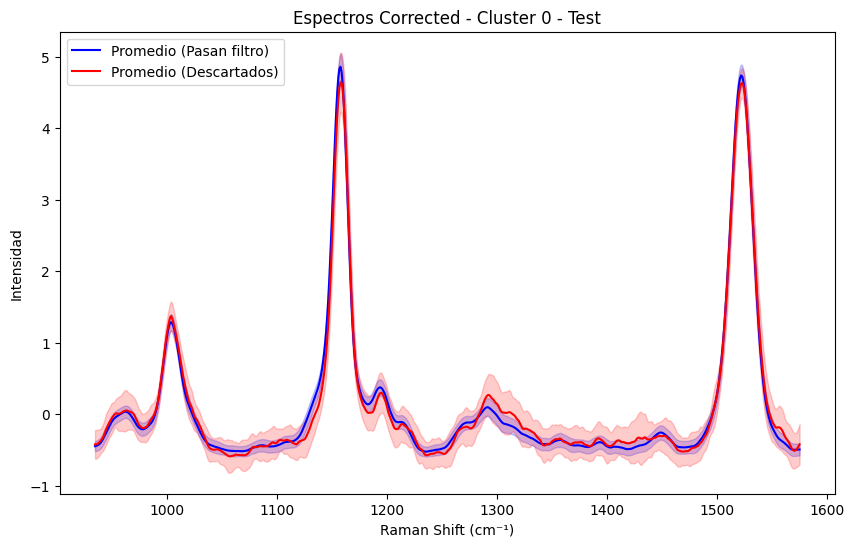

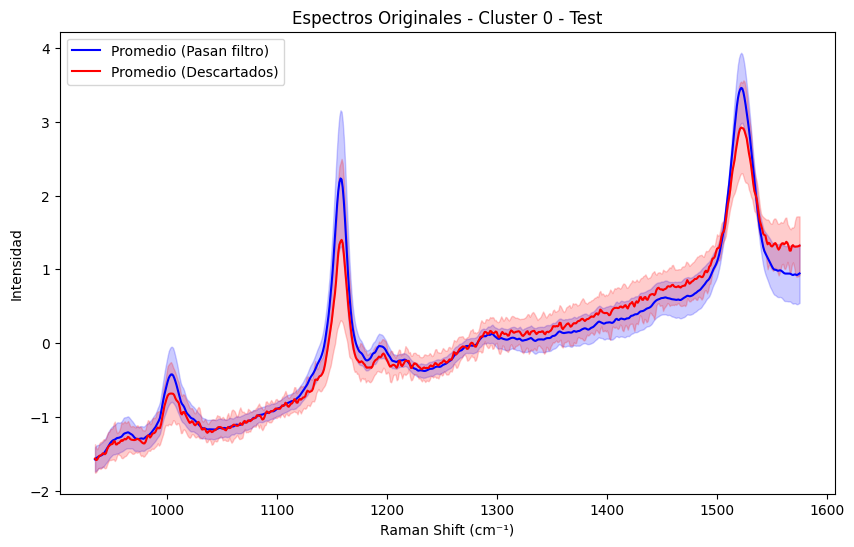

...

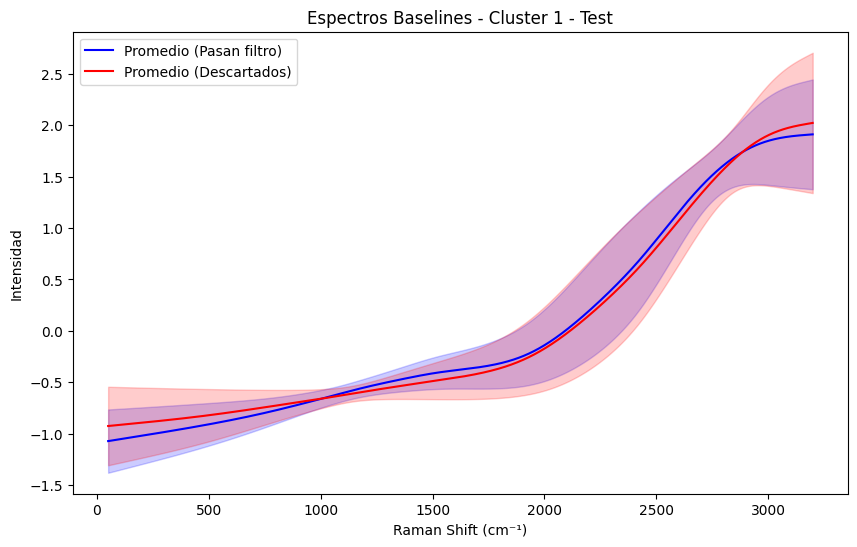

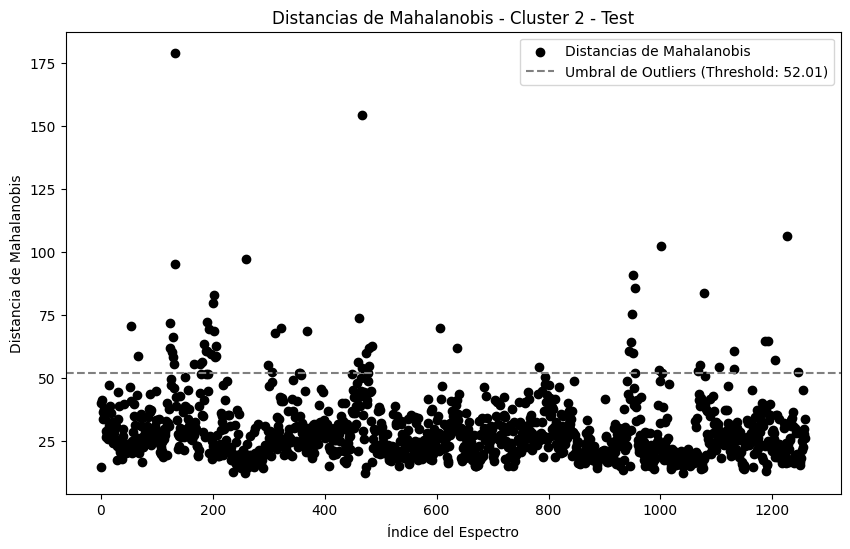

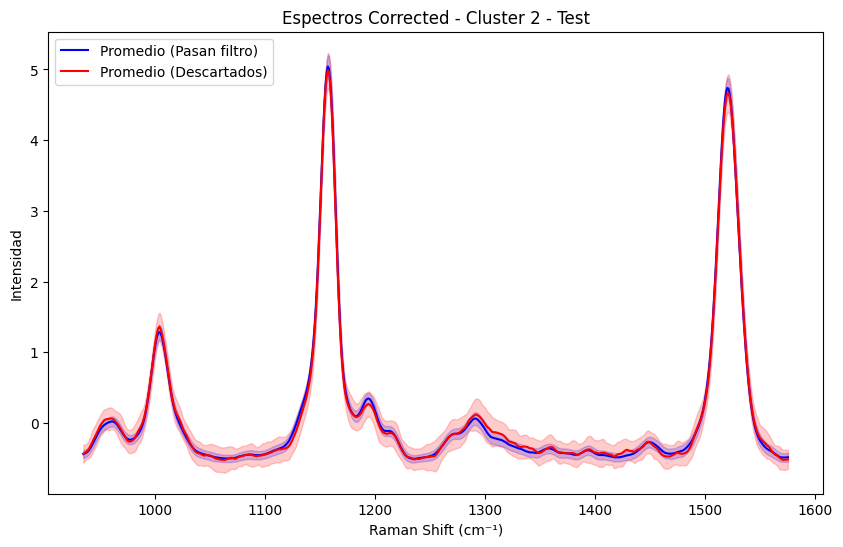

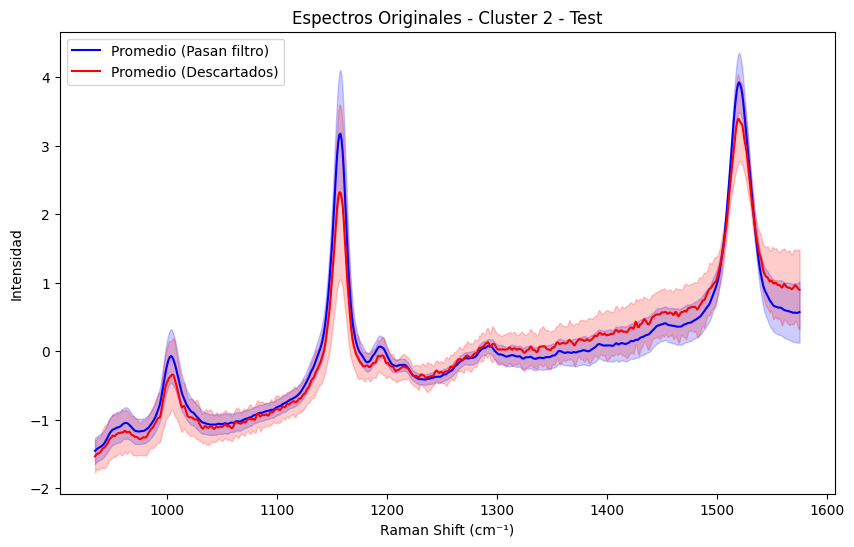

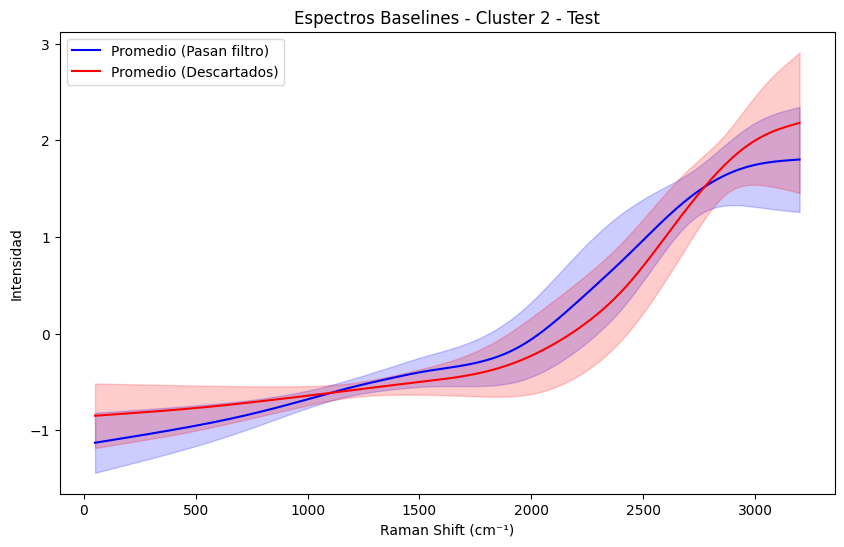

Filtrado completado en trainval y test, y archivos guardados.


In [81]:

































import pandas as pd
import numpy as np
from scipy.spatial import distance
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from kneed import KneeLocator  # Para detectar el codo automáticamente

# Función para graficar el espectro promedio y la desviación estándar
def plot_mean_and_std(df_passed, df_outliers, title, raman_shifts):
    plt.figure(figsize=(10, 6))
    
    # Calcular el promedio y la desviación estándar de los espectros que pasan el filtro
    if not df_passed.empty:
        mean_passed = df_passed.mean(axis=0)
        std_passed = df_passed.std(axis=0)
        plt.plot(raman_shifts, mean_passed, color='blue', label='Promedio (Pasan filtro)')
        plt.fill_between(raman_shifts, mean_passed - std_passed, mean_passed + std_passed, color='blue', alpha=0.2)
    
    # Calcular el promedio y la desviación estándar de los espectros descartados
    if not df_outliers.empty:
        mean_outliers = df_outliers.mean(axis=0)
        std_outliers = df_outliers.std(axis=0)
        plt.plot(raman_shifts, mean_outliers, color='red', label='Promedio (Descartados)')
        plt.fill_between(raman_shifts, mean_outliers - std_outliers, mean_outliers + std_outliers, color='red', alpha=0.2)

    plt.title(title)
    plt.xlabel("Raman Shift (cm⁻¹)")
    plt.ylabel("Intensidad")
    plt.legend()
    plt.show()

# Función para graficar las distancias de Mahalanobis
def plot_mahalanobis_distances(mahalanobis_distances, threshold, title):
    plt.figure(figsize=(10, 6))
    plt.scatter(range(len(mahalanobis_distances)), mahalanobis_distances, c='black', label='Distancias de Mahalanobis')
    plt.axhline(y=threshold, color='grey', linestyle='--', label=f"Umbral de Outliers (Threshold: {threshold:.2f})")
    plt.title(title)
    plt.xlabel("Índice del Espectro")
    plt.ylabel("Distancia de Mahalanobis")
    plt.legend()
    plt.show()

# Función para calcular la matriz de covarianza global e inversa, y el vector de medias
def compute_global_mahalanobis_params(df):
    df_numeric = df.drop(columns=categorical_columns + coordinates_columns + names_column)
    cov_matrix = np.cov(df_numeric.T)
    inv_cov_matrix = np.linalg.inv(cov_matrix)
    mean_vector = df_numeric.mean(axis=0)
    return inv_cov_matrix, mean_vector

# Función para aplicar Mahalanobis y obtener los outliers de cada cluster
def apply_mahalanobis_filter_by_cluster(df, cluster_labels, inv_cov_matrix, mean_vector, cluster_num, percentile=90):
    cluster_mask = (cluster_labels == cluster_num)
    df_cluster = df[cluster_mask].drop(columns=categorical_columns + coordinates_columns + names_column)
    mahalanobis_distances = df_cluster.apply(lambda row: distance.mahalanobis(row, mean_vector, inv_cov_matrix), axis=1)
    threshold = np.percentile(mahalanobis_distances, percentile)
    #threshold = 40
    outliers_mask = mahalanobis_distances > threshold
    return outliers_mask, mahalanobis_distances, threshold



# Función para aplicar el filtro de Mahalanobis en un DataFrame
def apply_mahalanobis_filter(df_test, inv_cov_matrix, mean_vector, threshold = 50):
    df_test_numeric = df_test.drop(columns=categorical_columns + coordinates_columns + names_column)
    
    # Calcular la distancia de Mahalanobis para cada espectro en el test
    mahalanobis_distances = df_test_numeric.apply(lambda row: distance.mahalanobis(row, mean_vector, inv_cov_matrix), axis=1)
    

    # Definir el umbral de distancia
    outliers_mask = mahalanobis_distances > threshold
    
    return outliers_mask, mahalanobis_distances



# Función para aplicar K-Means y determinar el número óptimo de clusters usando el método del codo
def find_optimal_clusters(data, max_k=10):
    inertia = []
    for k in range(1, max_k + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        inertia.append(kmeans.inertia_)
    
    # Usar kneed para encontrar el codo automáticamente
    kneedle = KneeLocator(range(1, max_k + 1), inertia, curve="convex", direction="decreasing")
    optimal_k = kneedle.elbow
    
    # Graficar el método del codo
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, max_k + 1), inertia, marker='o')
    plt.axvline(optimal_k, color='red', linestyle='--', label=f'Número óptimo de clusters: {optimal_k}')
    plt.xlabel('Número de clusters')
    plt.ylabel('Inercia (Suma de distancias cuadráticas)')
    plt.title('Método del Codo para encontrar el número óptimo de clusters')
    plt.legend()
    plt.show()
    
    return optimal_k

# Función para aplicar K-Means y obtener los clusters
def apply_kmeans(data, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(data)
    return clusters

# Función para reducir la dimensionalidad con PCA (para visualización)
def reduce_dimensionality_with_pca(data, n_components=2):
    pca = PCA(n_components=n_components)
    reduced_data = pca.fit_transform(data)
    return reduced_data



def filter_and_plot(df, outliers_mask, raman_shifts, title):
    df_passed = df[~outliers_mask].drop(columns=categorical_columns + coordinates_columns + names_column)
    df_outliers = df[outliers_mask].drop(columns=categorical_columns + coordinates_columns + names_column)
    
    plot_mean_and_std(df_passed, df_outliers, title, raman_shifts)
    
    return df_passed, df_outliers




# Definir las columnas categóricas y de coordenadas
categorical_columns = ['date', 't_exp', 'especie', 'medium']
coordinates_columns = ['X', 'Y']
names_column = ['name']

# 1. Cargar los datos de trainval
ruta = [
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\species_CORRECTED_normSPECTRUM_SNR30_V271124_FILTRADOPLASTICO2percent_withCOORDINATES.csv',
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\species_ORIGINALES_normSPECTRUM_SNR30_V271124_FILTRADOPLASTICO2percent_withCOORDINATES.csv',
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\species_BASELINES_normSPECTRUM_SNR30_V271124_FILTRADOPLASTICO2percent_withCOORDINATES.csv'
]


df = pd.read_csv(ruta[0])
df = df[df['especie'] != 'charco']
df_originales = pd.read_csv(ruta[1])
df_originales = df_originales[df_originales['especie'] != 'charco']
df_baselines = pd.read_csv(ruta[2])
df_baselines = df_baselines[df_baselines['especie'] != 'charco']


# Imprimir la distribución de especies antes del filtrado
print("Distribución de especies antes de aplicar K-Means (trainval):")
print(df['especie'].value_counts())


# Definir los rangos de los espectros Raman
raman_shifts_corrected = np.arange(935, 1576, 1)  # Para corrected y originales
raman_shifts_baselines = np.arange(50, 3200, 1)  # Para baselines




# 3. Aplicar el filtro de Mahalanobis en los datos de trainval (separado por especies)
outliers_indices_trainval = []

y_trainval = df['especie']  # Etiquetas de las clases (especies)




######

# Imprimir la distribución de especies después del filtrado en test
print("\nDistribución de especies después del filtrado (test):")
print(df_filtered['especie'].value_counts())


# 9. Aplicar el filtro de Mahalanobis por cluster en test
# 9. Aplicar el filtro de Mahalanobis por cluster en test
test_paths = [
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\MIX_CORRECTED.csv',
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\MIX_ORIGINALES.csv',
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\MIX_BASELINES.csv'
]





df_test_corrected = pd.read_csv(test_paths[0])
df_test_originales = pd.read_csv(test_paths[1])
df_test_baselines = pd.read_csv(test_paths[2])



# Aplicar K-Means en test (mismo número de clusters que en trainval)
categorical_columns = ['date', 't_exp']
df_test_numeric = df_test_corrected.drop(columns=categorical_columns + coordinates_columns + names_column)
find_optimal_clusters(df_test_numeric, max_k=10)

# Aplicar K-Means a los datos de test
clusters_test = apply_kmeans(df_test_numeric, n_clusters=n_clusters)

# Visualizar los clusters en 2D (test)
reduced_data_test = reduce_dimensionality_with_pca(df_test_numeric, n_components=2)
plt.figure(figsize=(8, 6))
plt.scatter(reduced_data_test[:, 0], reduced_data_test[:, 1], c=clusters_test, cmap='viridis', s=50, alpha=0.7)
plt.xlabel('Componente principal 1')
plt.ylabel('Componente principal 2')
plt.title(f'Clusters obtenidos con K-Means (n_clusters={n_clusters}) - Test')
plt.colorbar(label='Cluster')
plt.show()

# Aplicar Mahalanobis por cluster en los datos de test
outliers_indices_test = []
for cluster_num in range(n_clusters):
    outliers_mask_test, mahalanobis_distances_test, threshold_test = apply_mahalanobis_filter_by_cluster(
        df_test_corrected, clusters_test, inv_cov_matrix_global, mean_vector_global, cluster_num, percentile=95)

    # Graficar las distancias de Mahalanobis para test
    plot_mahalanobis_distances(mahalanobis_distances_test, threshold_test, f"Distancias de Mahalanobis - Cluster {cluster_num} - Test")

    # Filtrar los datos del cluster y graficar los espectros promedio y desviación estándar para test
    df_cluster_test = df_test_corrected[clusters_test == cluster_num]
    filter_and_plot(df_cluster_test, outliers_mask_test, raman_shifts_corrected, f"Espectros Corrected - Cluster {cluster_num} - Test")
    
    df_cluster_test_originales = df_test_originales[clusters_test == cluster_num]
    df_cluster_test_baselines = df_test_baselines[clusters_test == cluster_num]
    
    filter_and_plot(df_cluster_test_originales, outliers_mask_test, raman_shifts_corrected, f"Espectros Originales - Cluster {cluster_num} - Test")
    filter_and_plot(df_cluster_test_baselines, outliers_mask_test, raman_shifts_baselines, f"Espectros Baselines - Cluster {cluster_num} - Test")

    # Almacenar los índices de outliers
    outliers_indices_test.extend(df_cluster_test.index[outliers_mask_test])

# Eliminar los outliers en los DataFrames de test
df_test_corrected_filtered = df_test_corrected.drop(outliers_indices_test)
df_test_originales_filtered = df_test_originales.drop(outliers_indices_test)
df_test_baselines_filtered = df_test_baselines.drop(outliers_indices_test)



# Guardar los DataFrames filtrados de test
df_test_corrected_filtered.to_csv(test_paths[0].replace('.csv', '_WITHOUTOUTLIERS_percentile_091224.csv'), index=False)
df_test_originales_filtered.to_csv(test_paths[1].replace('.csv', '_WITHOUTOUTLIERS_percentile_091224.csv'), index=False)
df_test_baselines_filtered.to_csv(test_paths[2].replace('.csv', '_WITHOUTOUTLIERS_percentile_091224.csv'), index=False)

print("Filtrado completado en trainval y test, y archivos guardados.")



In [94]:
df_test_corrected_filtered

,X,Y,935,936,937,938,939,940,941,942,...,1569,1570,1571,1572,1573,1574,1575,name,date,t_exp
0,-63.009223,-11.432642,-0.432329,-0.427939,-0.418824,-0.409383,-0.398198,-0.379967,-0.355260,-0.325124,...,-0.523090,-0.518728,-0.506936,-0.490580,-0.486851,-0.492989,-0.495427,180724_UAM253UAM502,180724,0
1,-186.785440,41.352332,-0.447392,-0.439720,-0.456302,-0.464336,-0.454098,-0.430513,-0.405465,-0.393424,...,-0.351534,-0.382440,-0.426887,-0.474945,-0.506811,-0.528002,-0.550263,180724_UAM253UAM502_4_larga,180724,0
2,-263.165440,43.352332,-0.309093,-0.293196,-0.290670,-0.309301,-0.332635,-0.333990,-0.315652,-0.280749,...,-0.469952,-0.497618,-0.496170,-0.484001,-0.477253,-0.477038,-0.475819,180724_UAM253UAM502_4_larga,180724,0
3,-255.125440,43.352332,-0.469974,-0.432302,-0.368842,-0.281218,-0.189708,-0.127869,-0.094675,-0.054722,...,-0.599789,-0.594530,-0.604185,-0.633796,-0.629373,-0.606789,-0.609304,180724_UAM253UAM502_4_larga,180724,0
4,-239.045440,43.352332,-0.473848,-0.492141,-0.501521,-0.487756,-0.459889,-0.456622,-0.467401,-0.458096,...,-0.659720,-0.648921,-0.652343,-0.647094,-0.604003,-0.560132,-0.575531,180724_UAM253UAM502_4_larga,180724,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2536,-23.664560,-12.502591,-0.376069,-0.390400,-0.401747,-0.400875,-0.392081,-0.370933,-0.339115,-0.309110,...,-0.518723,-0.505804,-0.496412,-0.490817,-0.482148,-0.470905,-0.452845,210724_UAM253UAM588_1,210724,0
2537,2.465440,-4.502591,-0.398749,-0.393332,-0.380359,-0.357008,-0.328783,-0.306727,-0.291468,-0.265327,...,-0.460931,-0.451834,-0.460939,-0.487569,-0.516628,-0.547082,-0.565775,210724_UAM253UAM588_1,210724,0
2538,32.615440,-2.502591,-0.479847,-0.452388,-0.429751,-0.405876,-0.374992,-0.343187,-0.318301,-0.295159,...,-0.463200,-0.440285,-0.417212,-0.391649,-0.373079,-0.355303,-0.346655,210724_UAM253UAM588_1,210724,0
2539,42.665440,-2.502591,-0.424102,-0.410272,-0.405081,-0.430552,-0.466324,-0.486336,-0.490921,-0.476532,...,-0.368170,-0.342783,-0.337103,-0.356148,-0.380919,-0.399119,-0.407081,210724_UAM253UAM588_1,210724,0


In [98]:
from sklearn.preprocessing import StandardScaler

def standarization(df):
    """
    Preprocessing of spectral data.
    Input:
        baselines: DataFrame, raw spectral data.
    Output:
        DataFrame: Preprocessed spectral data with categorical data concatenated.
    """
    # Separar las columnas categóricas
    categorical_data = df[['X', 'Y', 'name', 'date', 't_exp']]
    df = df.drop(columns=['X', 'Y', 'name', 'date', 't_exp'])

    # Normalize each corrected spectrum
    X_norm_list = []
    for _, row in df.iterrows():
        total = np.sum(row)
        if total != 0:
            X_norm_list.append(pd.DataFrame([row / total * 2000]))
        else:
            X_norm_list.append(pd.DataFrame([row]))
    X_norm = pd.concat(X_norm_list, ignore_index=True)

    # Standardize data
    scaler = StandardScaler()
    z_numpy = X_norm.values
    z_numpy_scaled_rows = scaler.fit_transform(z_numpy.T).T
    X_norm_stdz = pd.DataFrame(data=z_numpy_scaled_rows, columns=df.columns)

    # Concatenar las columnas categóricas de vuelta al DataFrame preprocesado
    X_norm_stdz = pd.concat([X_norm_stdz, categorical_data.reset_index(drop=True)], axis=1)

    return X_norm_stdz

In [99]:
df_test_corrected_filtered = standarization(df_test_corrected_filtered)
df_test_originales_filtered = standarization(df_test_originales_filtered)
df_test_baselines_filtered = standarization(df_test_baselines_filtered)

In [100]:
# Guardar los DataFrames filtrados de test
df_test_corrected_filtered.to_csv(test_paths[0].replace('.csv', '_WITHOUTOUTLIERS_percentile_091224.csv'), index=False)
df_test_originales_filtered.to_csv(test_paths[1].replace('.csv', '_WITHOUTOUTLIERS_percentile_091224.csv'), index=False)
df_test_baselines_filtered.to_csv(test_paths[2].replace('.csv', '_WITHOUTOUTLIERS_percentile_091224.csv'), index=False)

In [101]:
df_test_corrected_filtered = pd.read_csv(test_paths[0].replace('.csv', '_WITHOUTOUTLIERS_percentile_091224.csv'))
df_test_originales_filtered = pd.read_csv(test_paths[1].replace('.csv', '_WITHOUTOUTLIERS_percentile_091224.csv'))
df_test_baselines_filtered = pd.read_csv(test_paths[2].replace('.csv', '_WITHOUTOUTLIERS_percentile_091224.csv'))


Procesando archivo: 031024_UAM253_500ms_1acc_pwcas1_5um_1
Válidos: 44, Outliers: 0


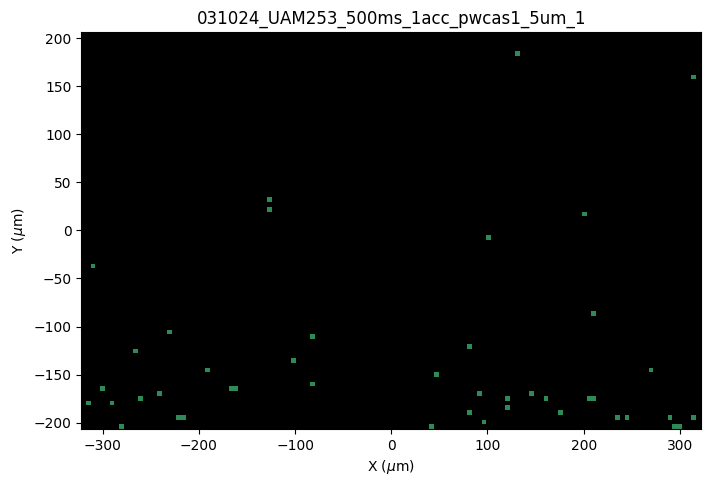


Procesando archivo: 041024_UAM253_500ms_1acc_pwcas1_5um_2
Válidos: 49, Outliers: 0


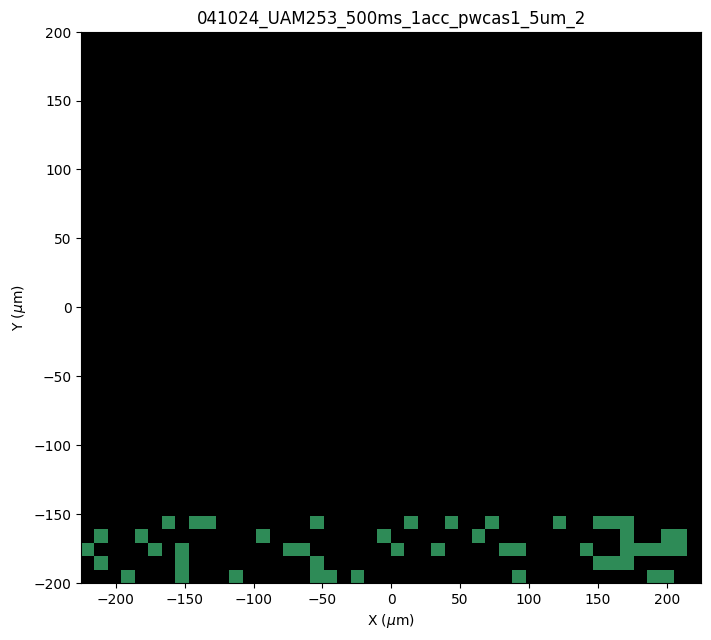


Procesando archivo: 041024_UAM253_500ms_1acc_pwras_5um_1
Válidos: 406, Outliers: 0


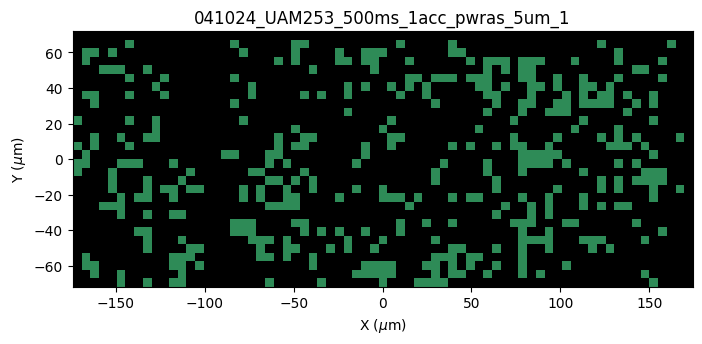


Procesando archivo: 041024_UAM253_500ms_1acc_pwras_5um_3
Válidos: 2009, Outliers: 0


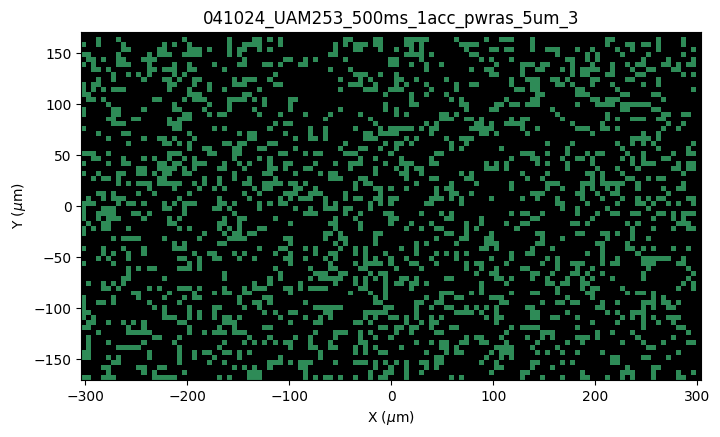


Procesando archivo: 060624_UAM502_300ms_1acc_pwras_5um
Válidos: 155, Outliers: 0


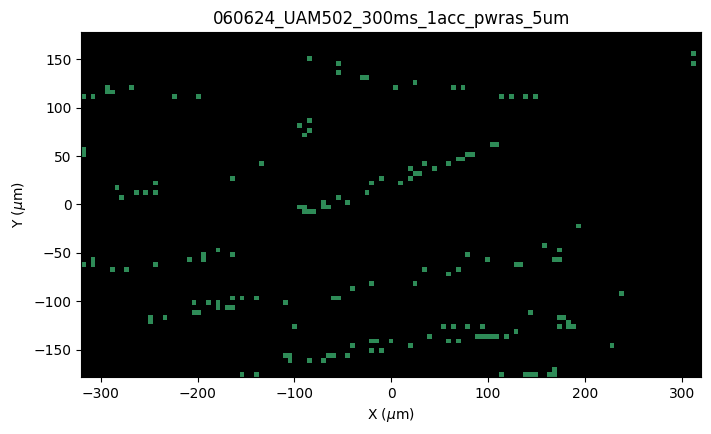


Procesando archivo: 080724_UAM588_1s_1acc_5um_pwcasiras
Válidos: 191, Outliers: 0


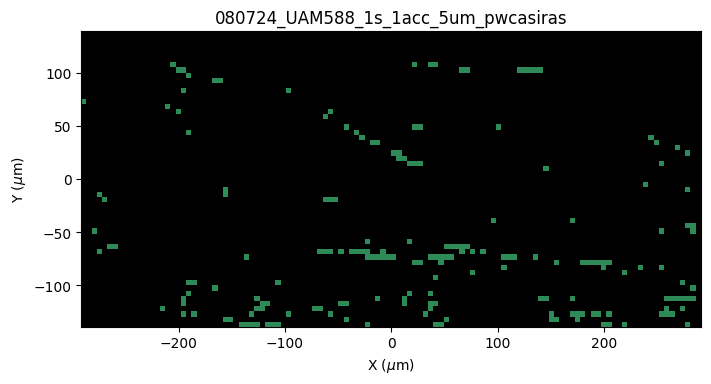


Procesando archivo: 080824_UAM565_500ms_1acc_pwmuesca1_2um_2_largo
Válidos: 1170, Outliers: 0


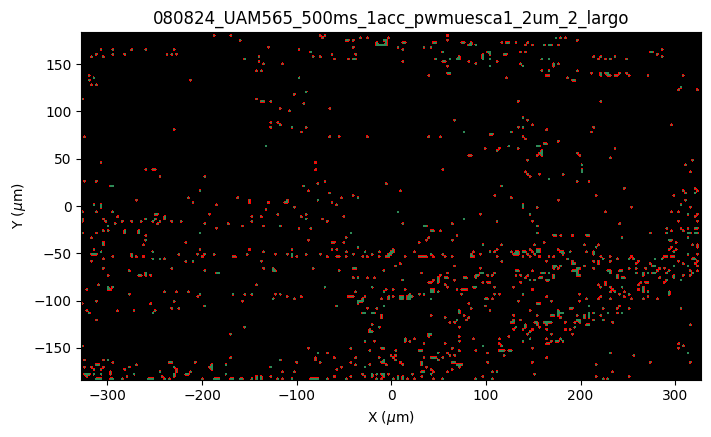


Procesando archivo: 080824_UAM565_700ms_1acc_pwmuesca1_6um_1
Válidos: 48, Outliers: 0


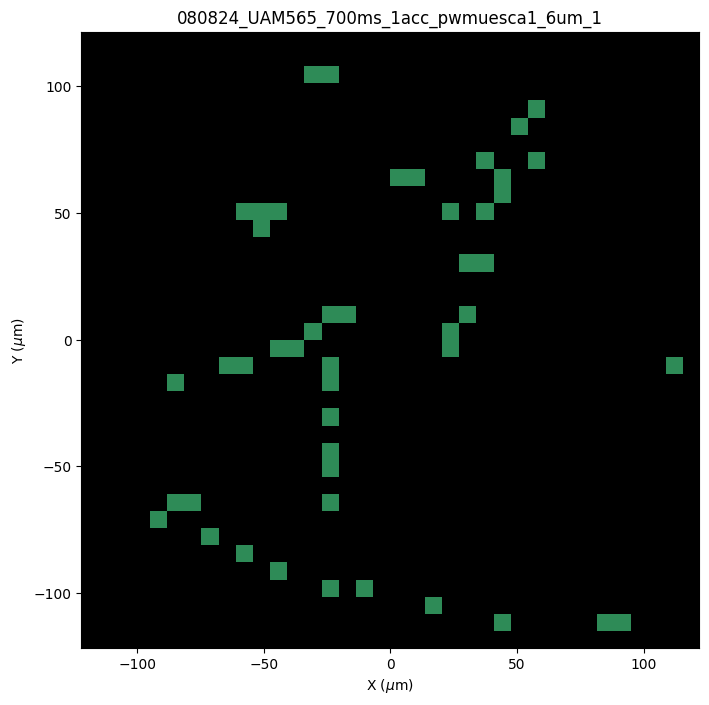


Procesando archivo: 080824_UAM565_700ms_1acc_pwmuesca1_6um_2
Válidos: 4, Outliers: 0


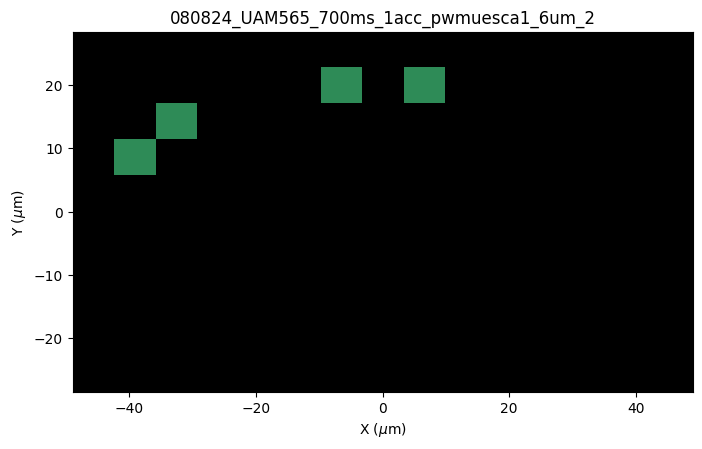


Procesando archivo: 080824_UAM565_700ms_1acc_pwmuesca1_6um_3
Válidos: 41, Outliers: 0


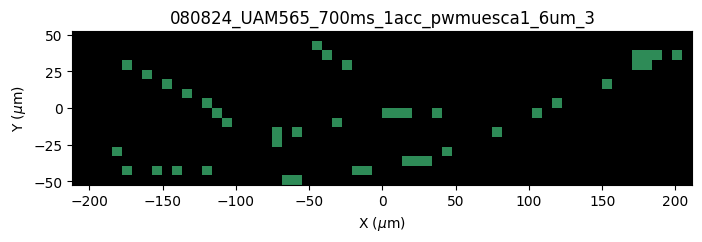


Procesando archivo: 080824_UAM565_700ms_1acc_pwmuesca1_6um_4
Válidos: 28, Outliers: 0


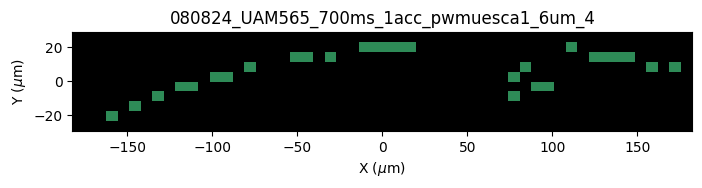


Procesando archivo: 090723_UAM588_500ms_1acc_pwcasi1_5um
Válidos: 1171, Outliers: 0


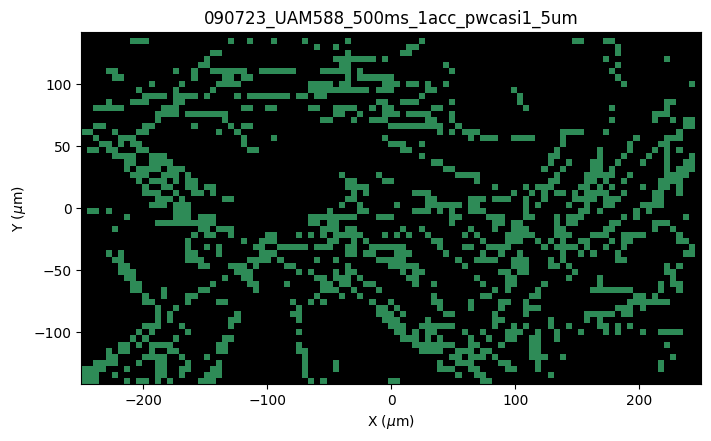


Procesando archivo: 090724_UAM588_1s_2acc_3um_pwcasiras
Válidos: 229, Outliers: 0


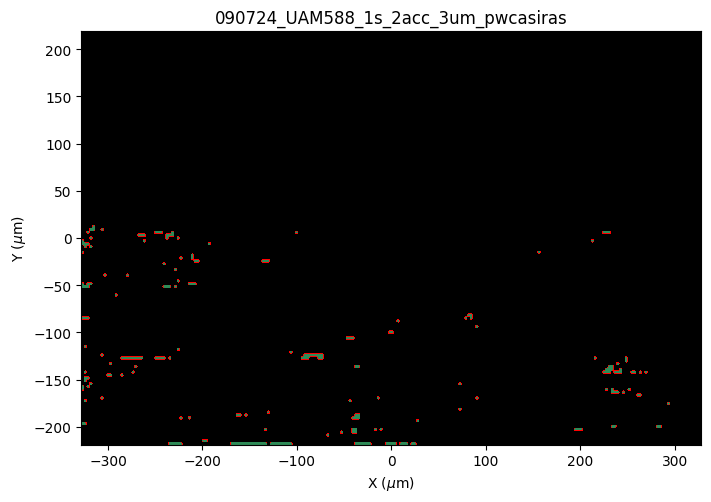


Procesando archivo: 090724_UAM588_500ms_1acc_5um_pwcasi1
Válidos: 357, Outliers: 0


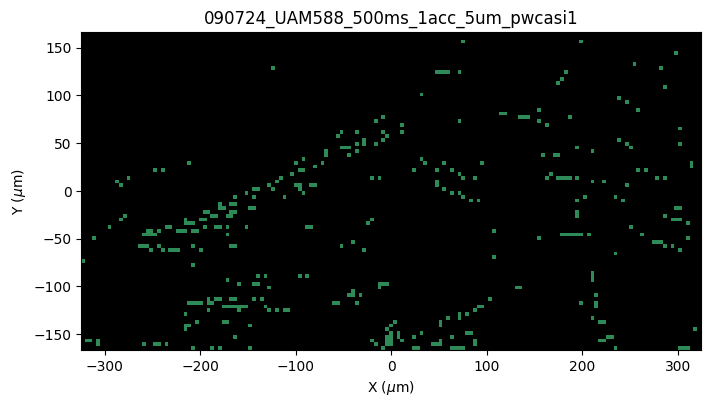


Procesando archivo: 090824_UAM565_300ms_1acc_pwmuescacasi1_5um_1
Válidos: 237, Outliers: 0


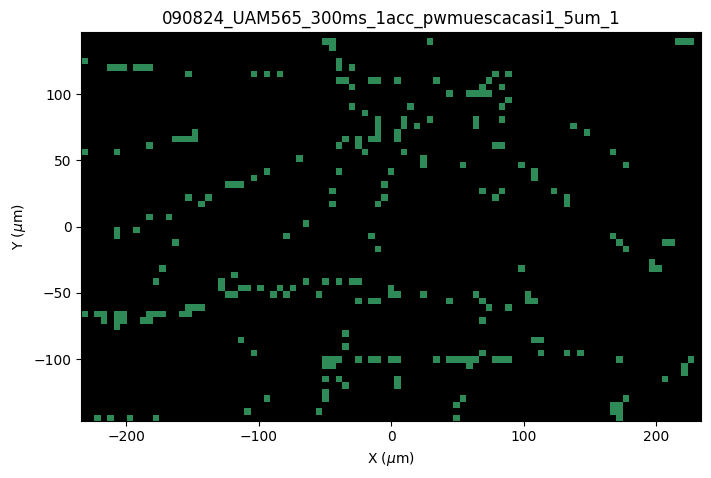


Procesando archivo: 090824_UAM565_500ms_1acc_pwcasiras_5um_1
Válidos: 67, Outliers: 0


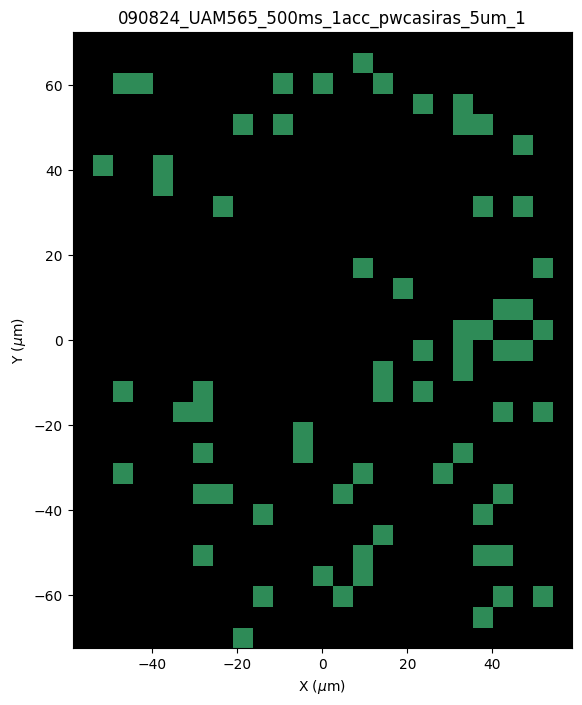


Procesando archivo: 090824_UAM565_500ms_1acc_pwcasiras_5um_2
Válidos: 245, Outliers: 0


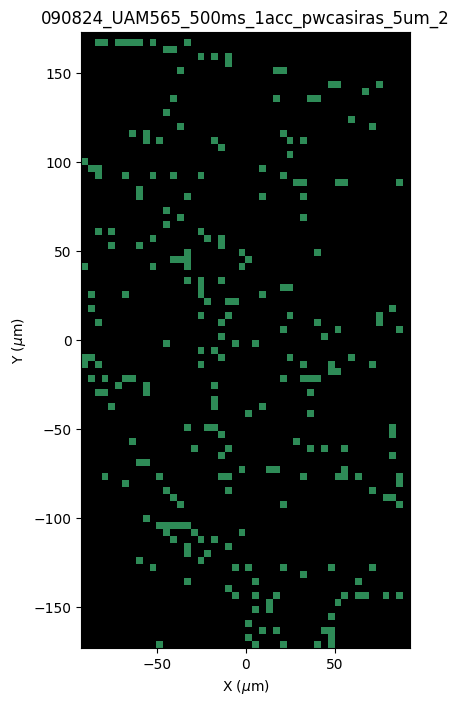


Procesando archivo: 090824_UAM565_500ms_1acc_pwcasiras_5um_3
Válidos: 256, Outliers: 0


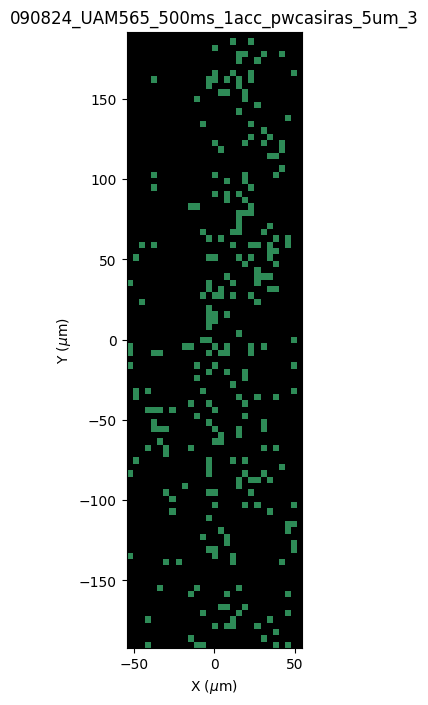


Procesando archivo: 090824_UAM565_500ms_1acc_pwmuescacasi1_5um_1
Válidos: 173, Outliers: 0


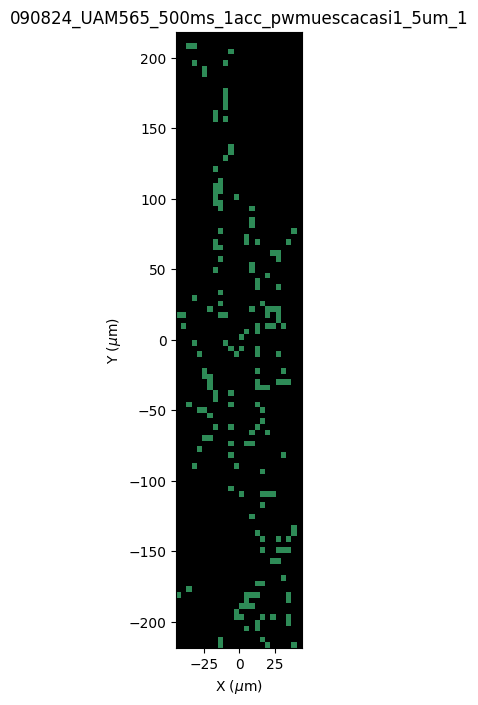


Procesando archivo: 090824_UAM565_500ms_1acc_pwmuescacasi1_5um_2
Válidos: 147, Outliers: 0


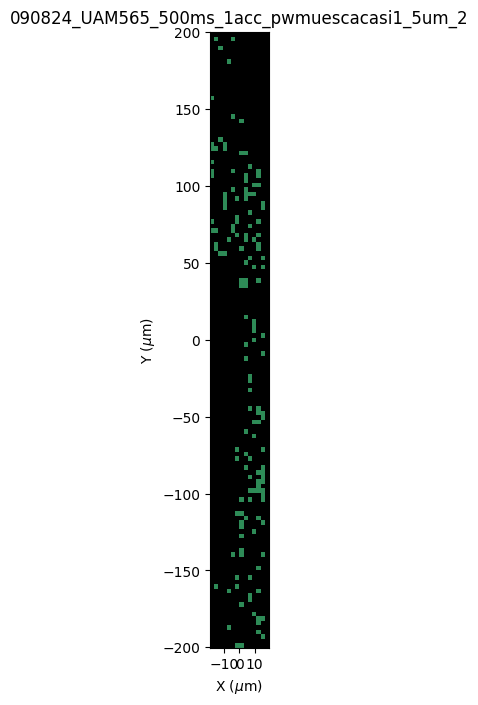


Procesando archivo: 090824_UAM565_700ms_1acc_pwmuescacasi1_5um_1
Válidos: 245, Outliers: 0


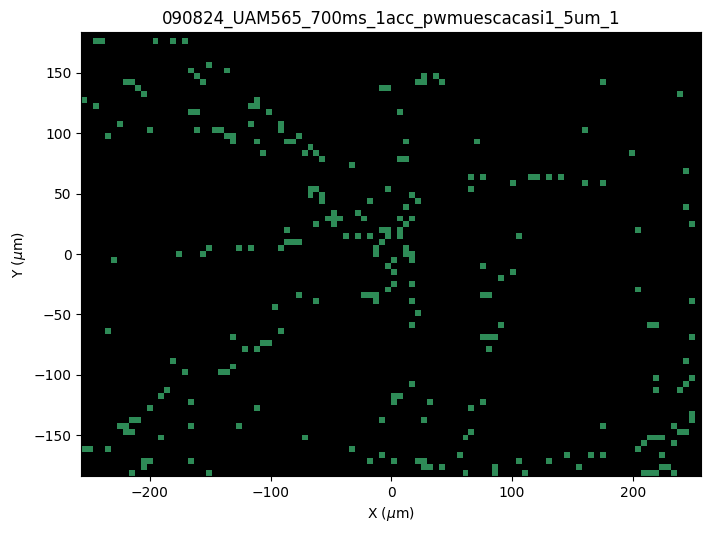


Procesando archivo: 090824_UAM565_700ms_1acc_pwmuescacasi1_5um_2
Válidos: 270, Outliers: 0


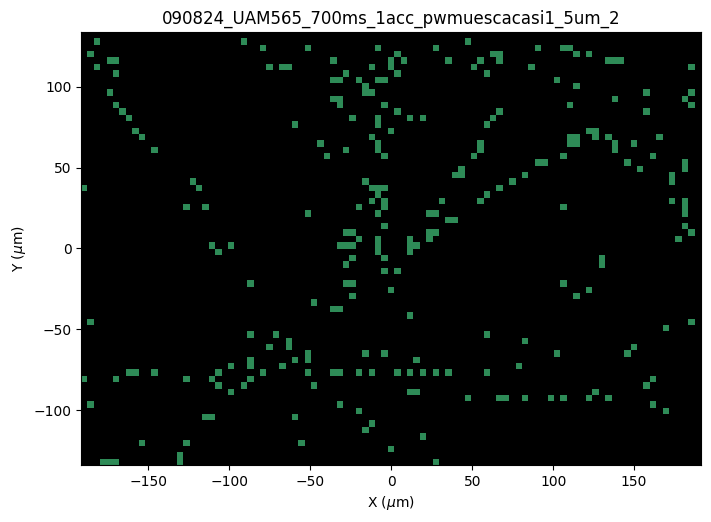


Procesando archivo: 091024_UAM253_500ms_1acc_pwras_1
Válidos: 173, Outliers: 0


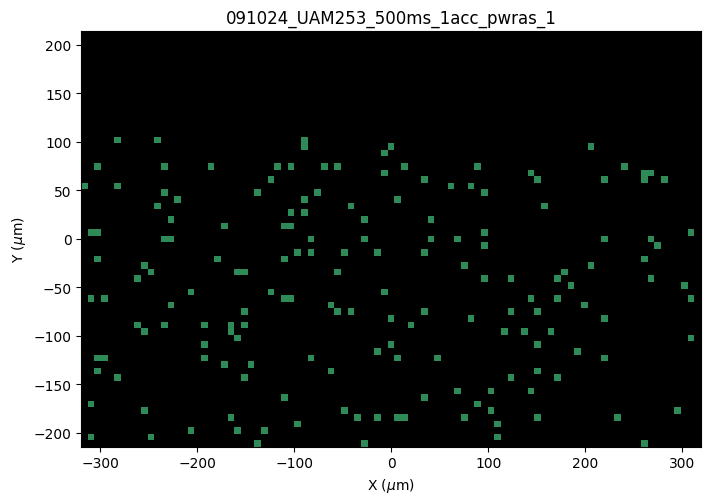


Procesando archivo: 091024_UAM253_500ms_1acc_pwras_2
Válidos: 54, Outliers: 0


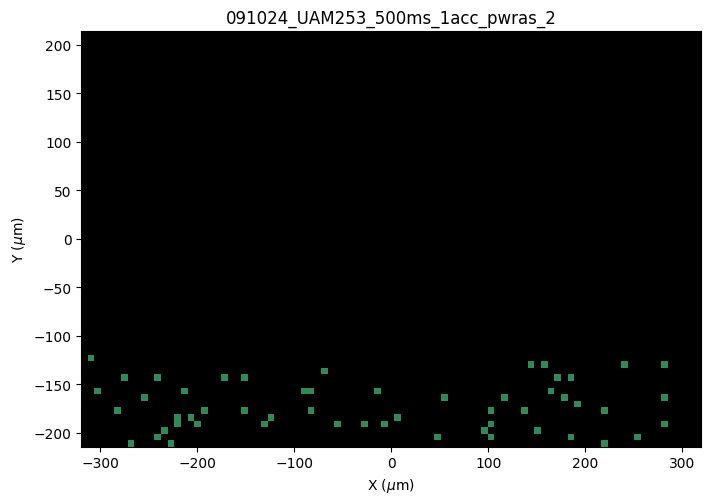


Procesando archivo: 091024_UAM253_500ms_1acc_pwras_3
Válidos: 106, Outliers: 0


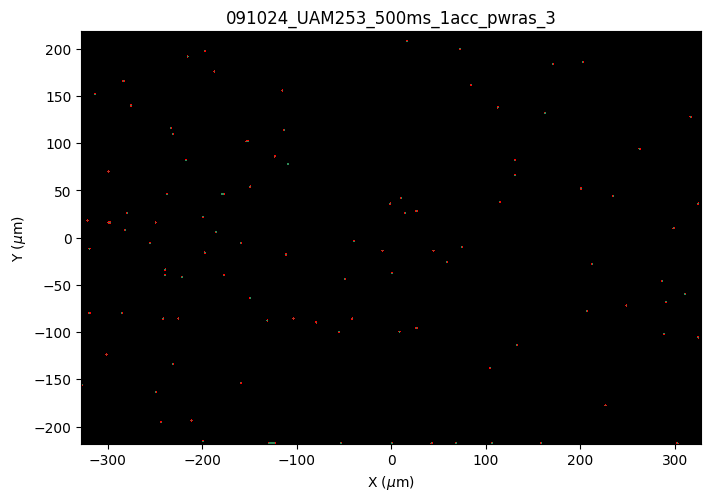


Procesando archivo: 091024_UAM253_500ms_1acc_pwras_4
Válidos: 83, Outliers: 0


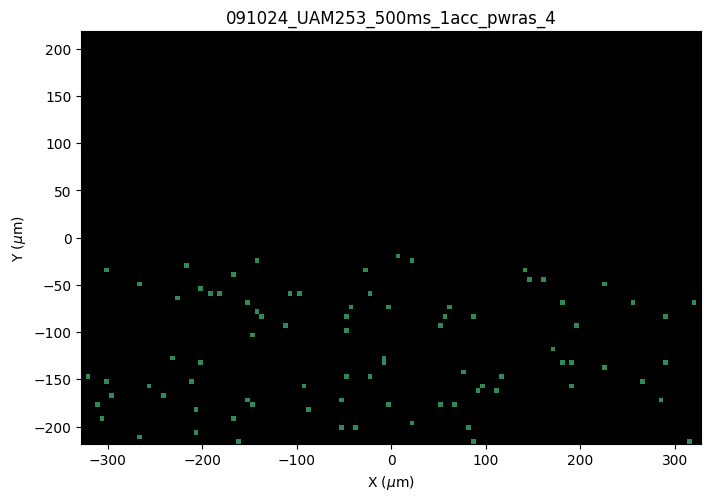


Procesando archivo: 091024_UAM253_500ms_1acc_pwras_5
Válidos: 158, Outliers: 0


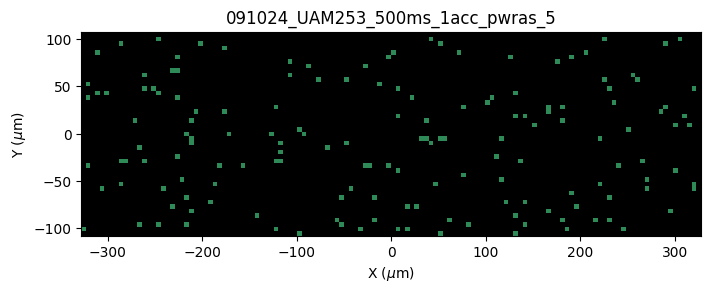


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_1
Válidos: 25, Outliers: 0


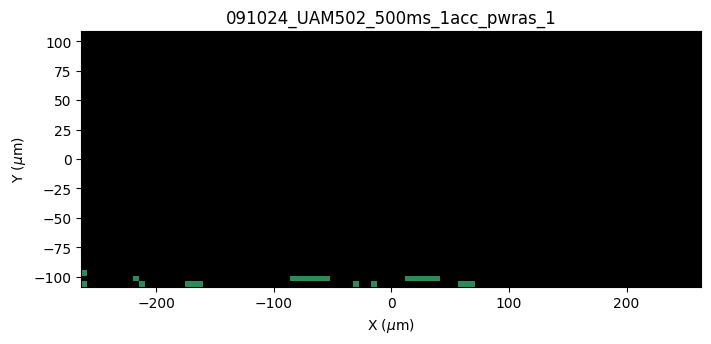


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_10
Válidos: 61, Outliers: 0


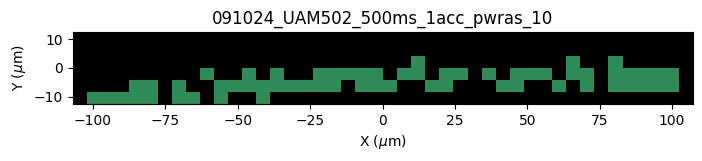


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_11
Válidos: 51, Outliers: 0


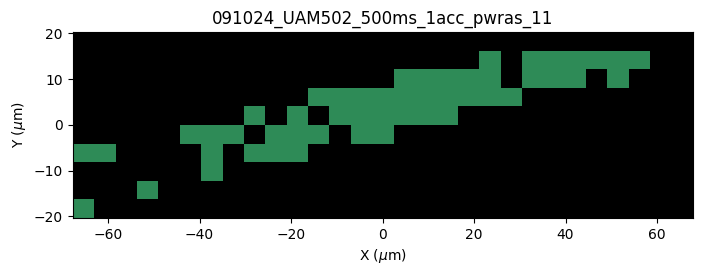


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_12
Válidos: 47, Outliers: 0


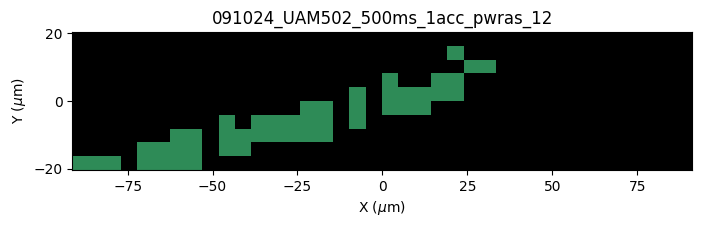


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_13
Válidos: 23, Outliers: 0


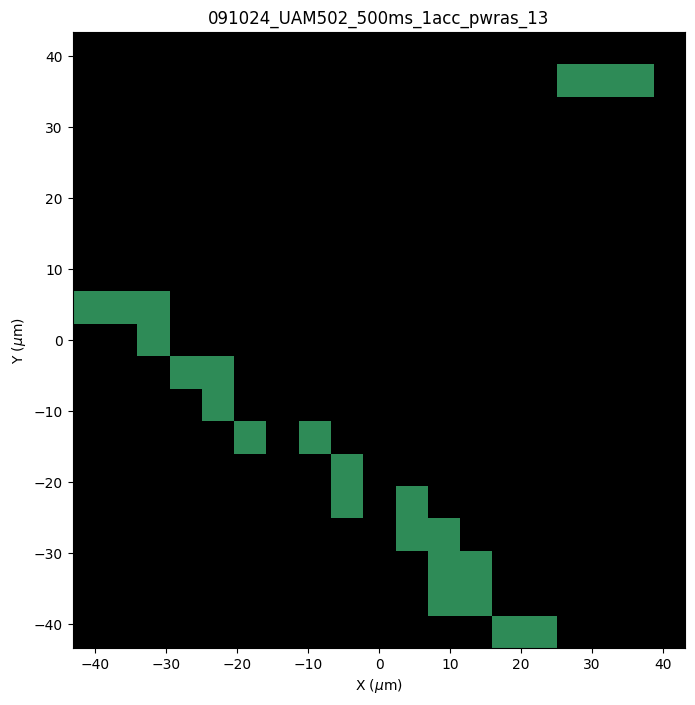


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_14
Válidos: 19, Outliers: 0


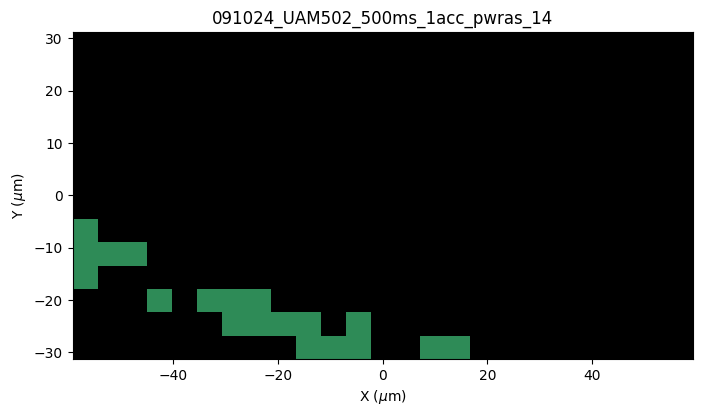


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_15
Válidos: 16, Outliers: 0


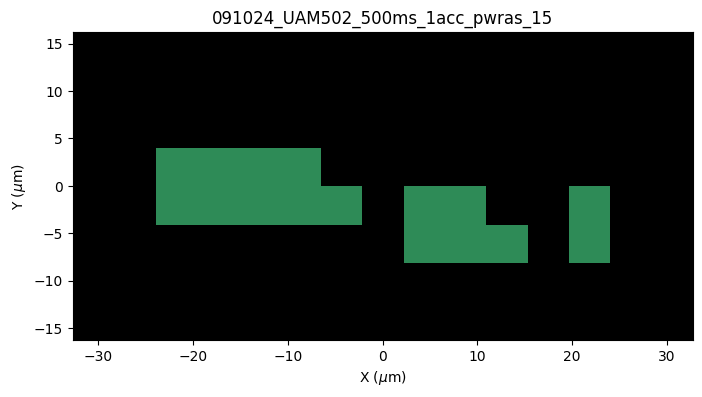


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_16
Válidos: 19, Outliers: 0


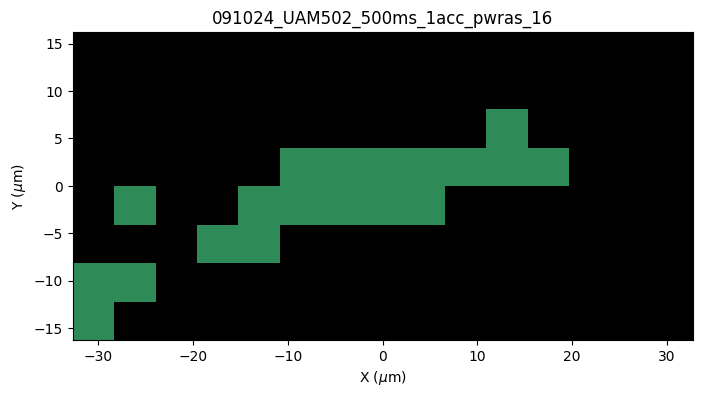


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_17
Válidos: 59, Outliers: 0


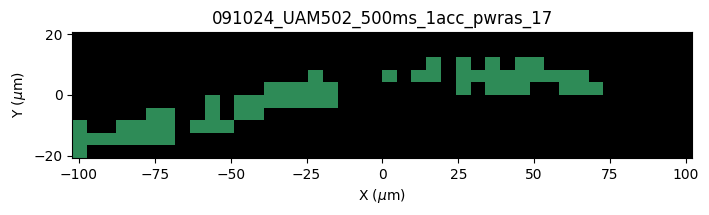


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_18
Válidos: 99, Outliers: 0


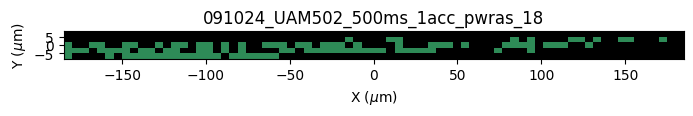


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_19
Válidos: 64, Outliers: 0


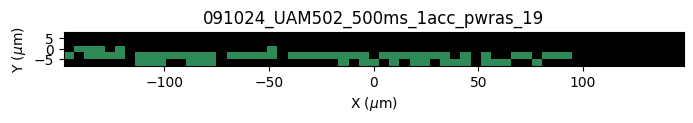


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_2
Válidos: 110, Outliers: 0


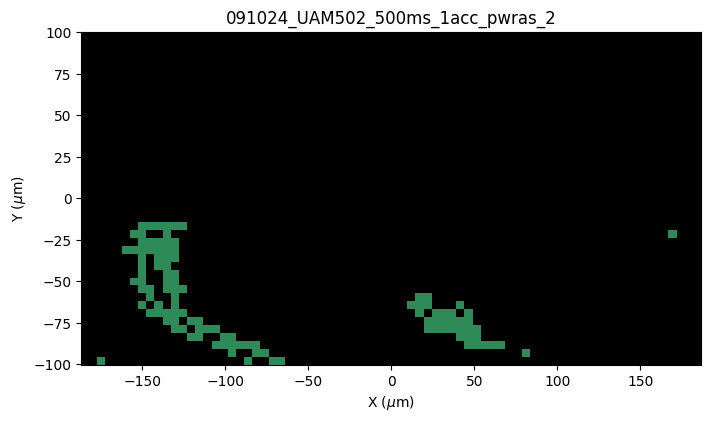


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_20
Válidos: 68, Outliers: 0


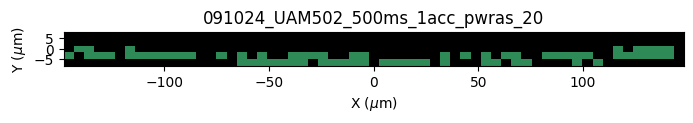


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_3
Válidos: 12, Outliers: 0


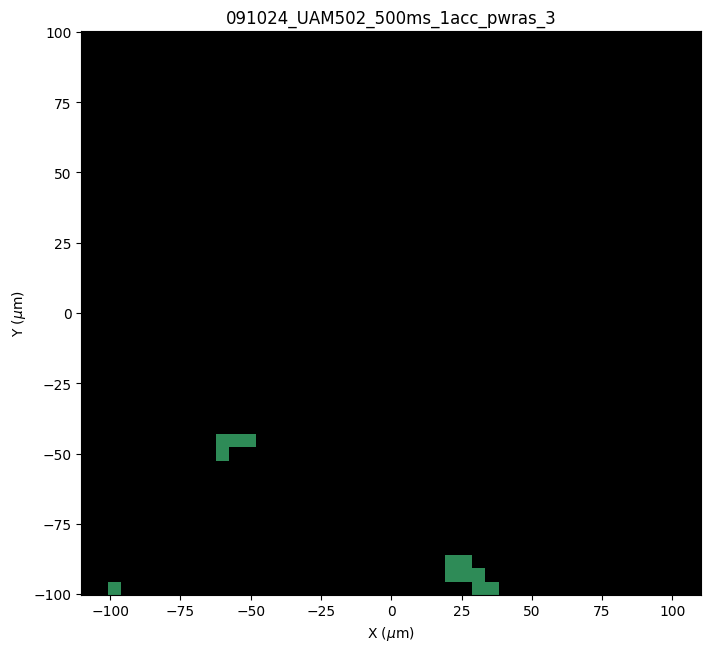


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_4
Válidos: 33, Outliers: 0


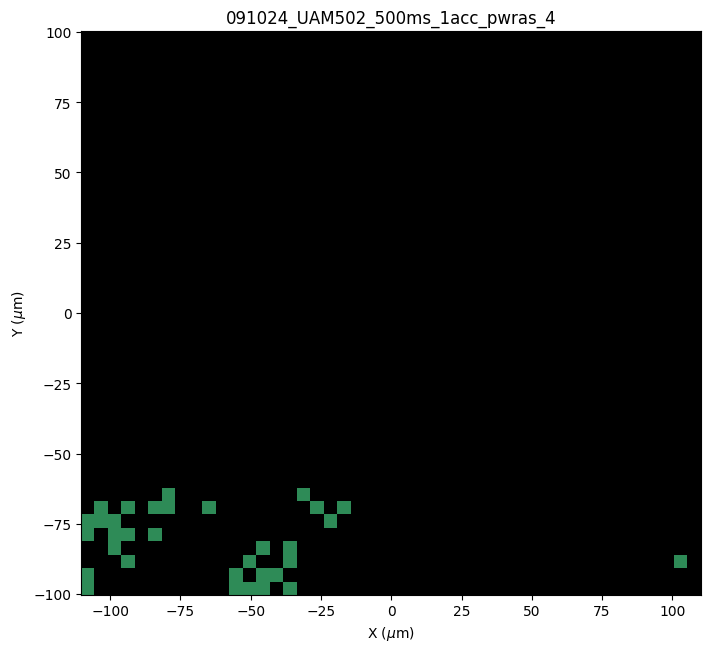


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_5
Válidos: 15, Outliers: 0


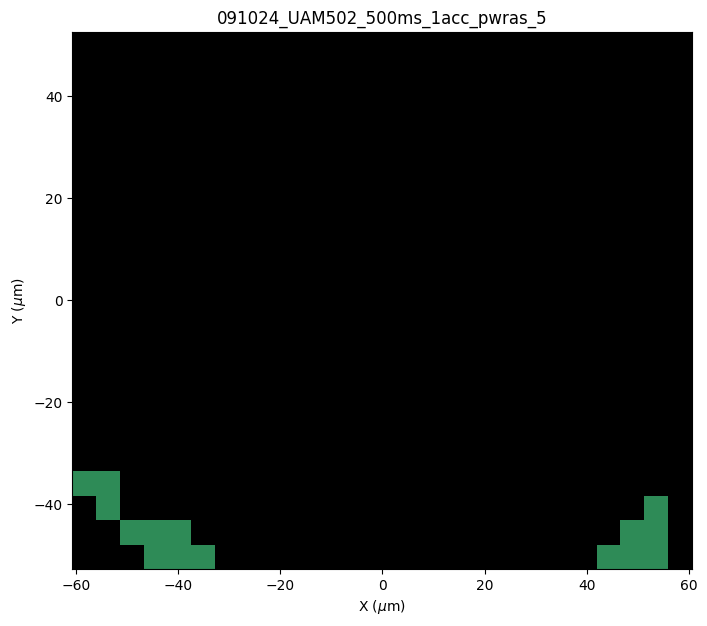


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_6
Válidos: 5, Outliers: 0


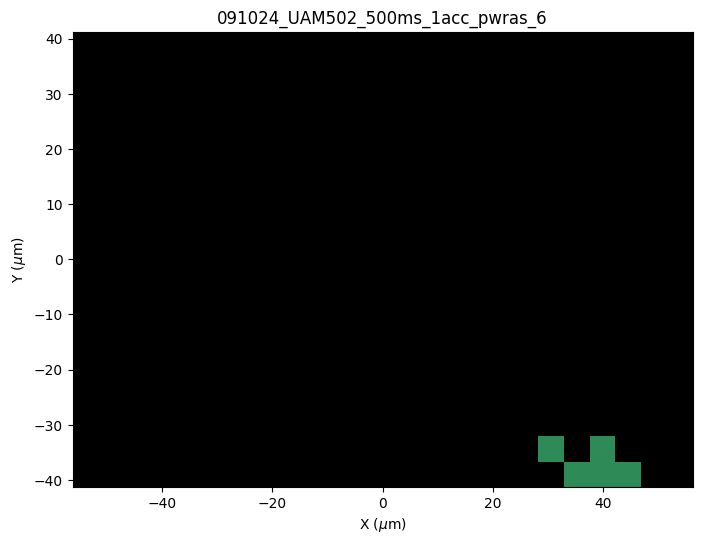


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_7
Válidos: 34, Outliers: 0


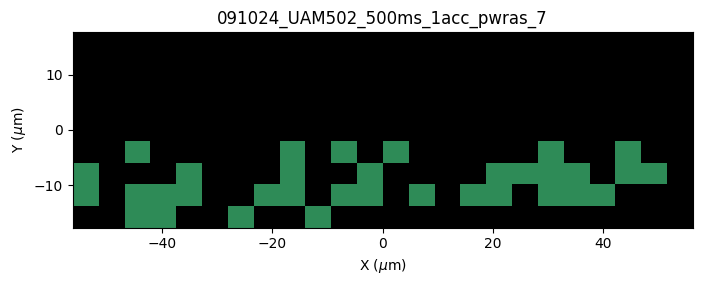


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_8
Válidos: 101, Outliers: 0


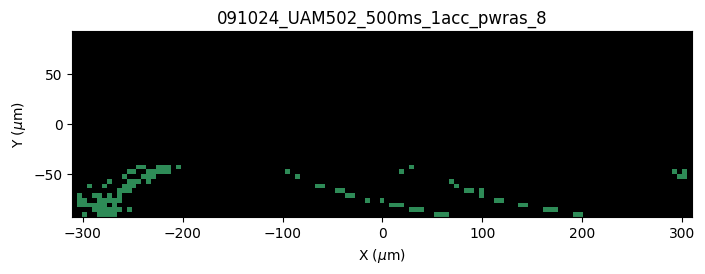


Procesando archivo: 091024_UAM502_500ms_1acc_pwras_9
Válidos: 130, Outliers: 0


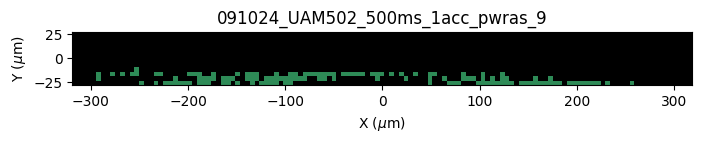


Procesando archivo: 091024_UAM565_500ms_1acc_pwras_1
Válidos: 2, Outliers: 0


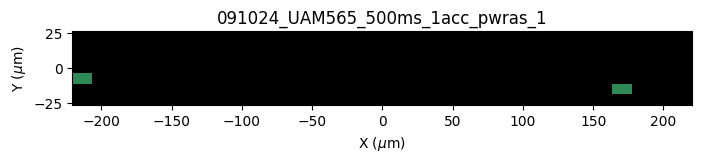


Procesando archivo: 091024_UAM565_500ms_1acc_pwras_10
Válidos: 4, Outliers: 0


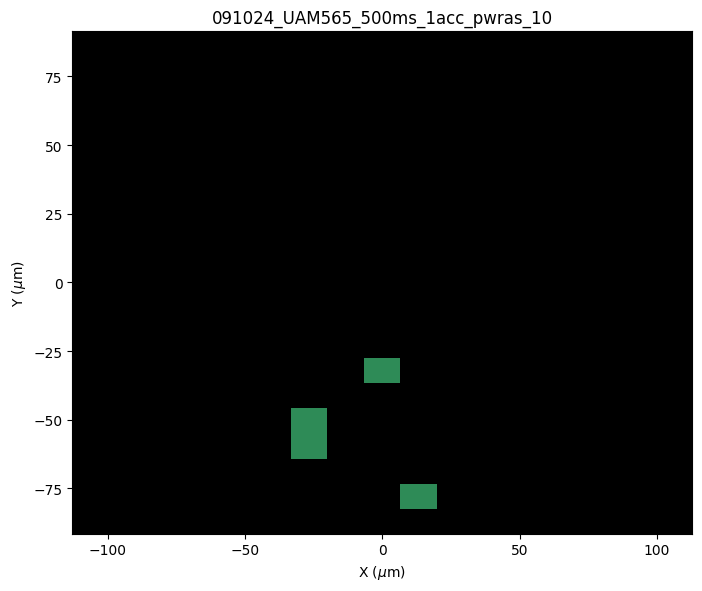


Procesando archivo: 091024_UAM565_500ms_1acc_pwras_11
Válidos: 128, Outliers: 0


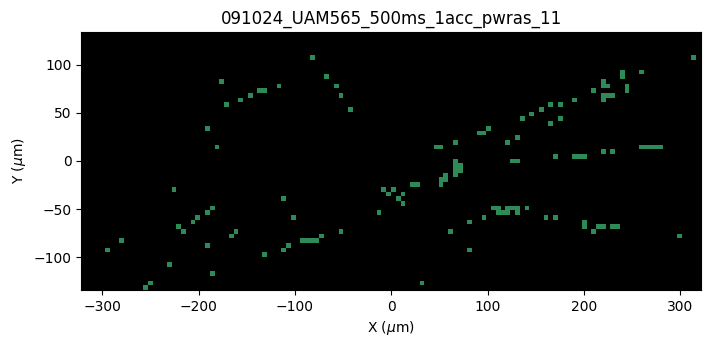


Procesando archivo: 091024_UAM565_500ms_1acc_pwras_16
Válidos: 137, Outliers: 0


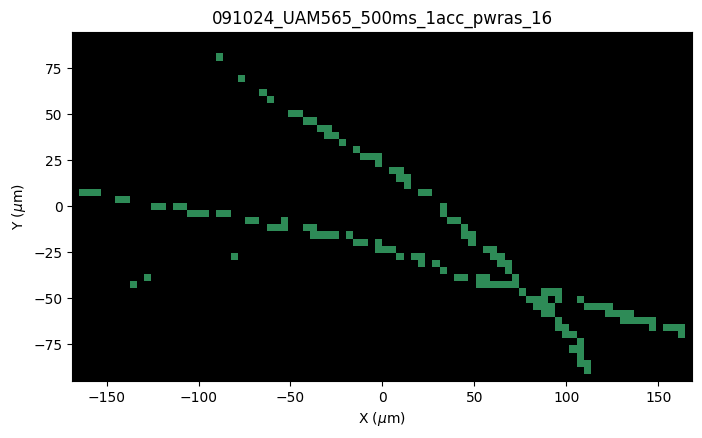


Procesando archivo: 091024_UAM565_500ms_1acc_pwras_2
Válidos: 9, Outliers: 0


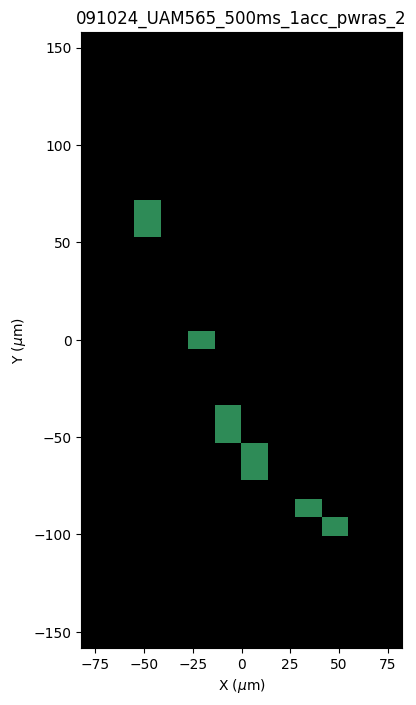


Procesando archivo: 091024_UAM565_500ms_1acc_pwras_3
Válidos: 8, Outliers: 0


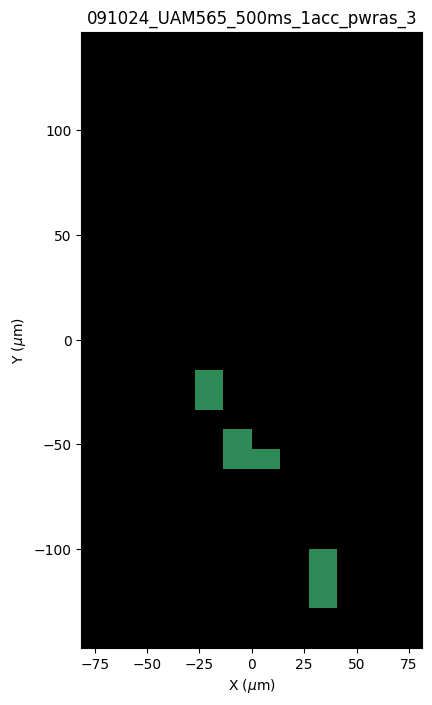


Procesando archivo: 091024_UAM565_500ms_1acc_pwras_4
Válidos: 1, Outliers: 0


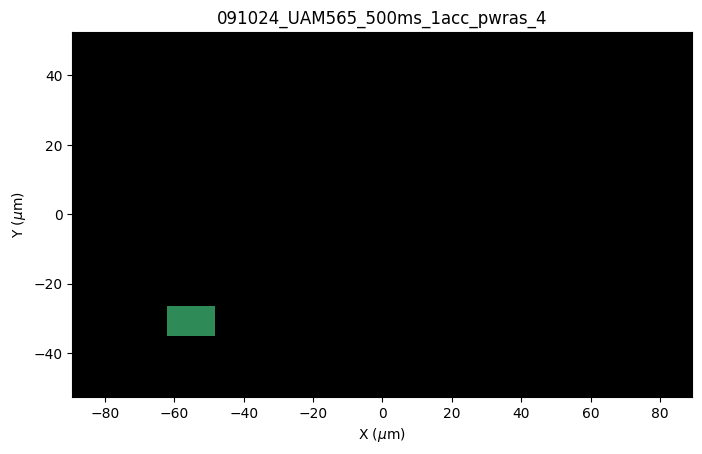


Procesando archivo: 091024_UAM565_500ms_1acc_pwras_5
Válidos: 8, Outliers: 0


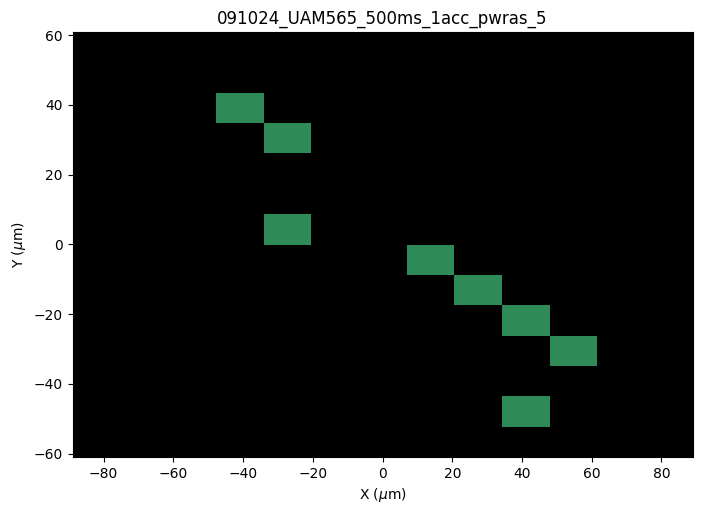


Procesando archivo: 091024_UAM565_500ms_1acc_pwras_6
Válidos: 4, Outliers: 0


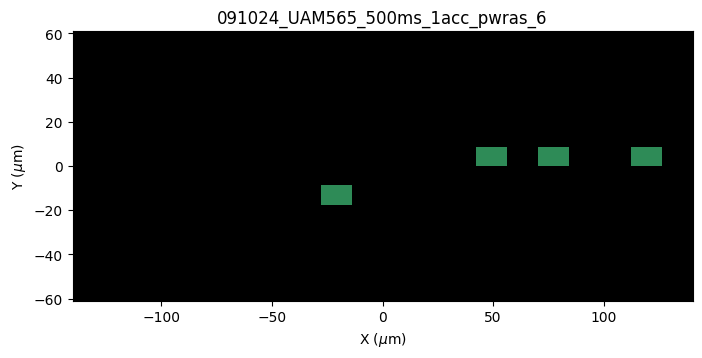


Procesando archivo: 091024_UAM565_500ms_1acc_pwras_7
Válidos: 15, Outliers: 0


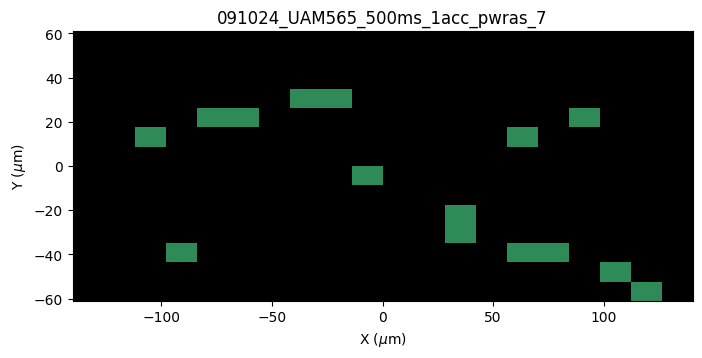


Procesando archivo: 091024_UAM565_500ms_1acc_pwras_8
Válidos: 5, Outliers: 0


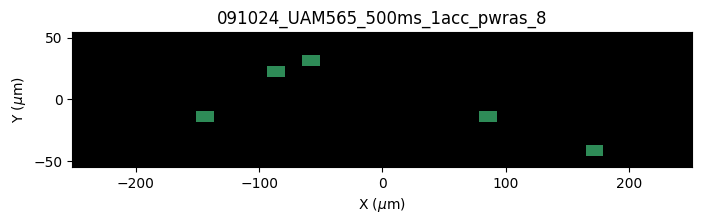


Procesando archivo: 091024_UAM565_500ms_1acc_pwras_9
Válidos: 29, Outliers: 0


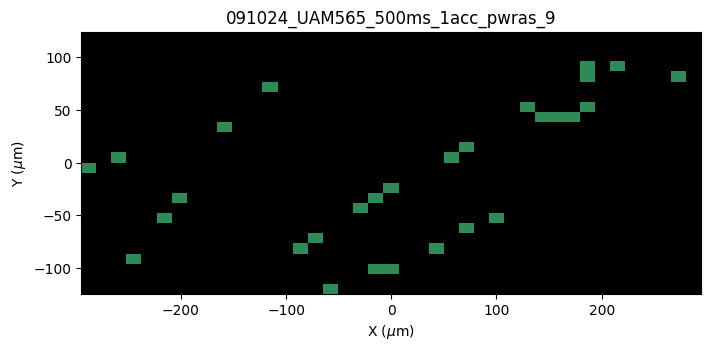


Procesando archivo: 091024_UAM565_controzos_500ms_1acc_pwras_12
Válidos: 16, Outliers: 0


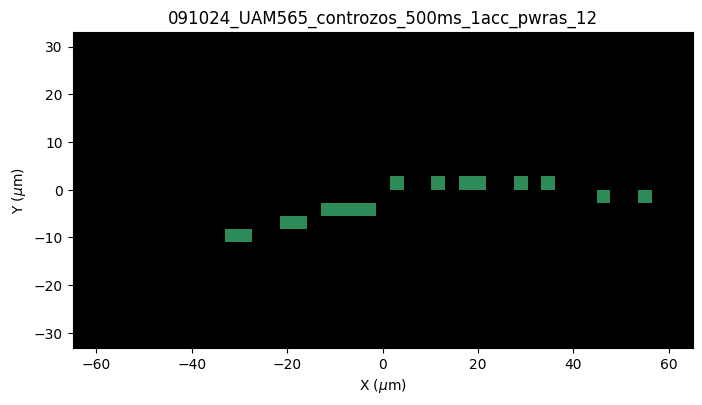


Procesando archivo: 091024_UAM565_controzos_500ms_1acc_pwras_13
Válidos: 102, Outliers: 0


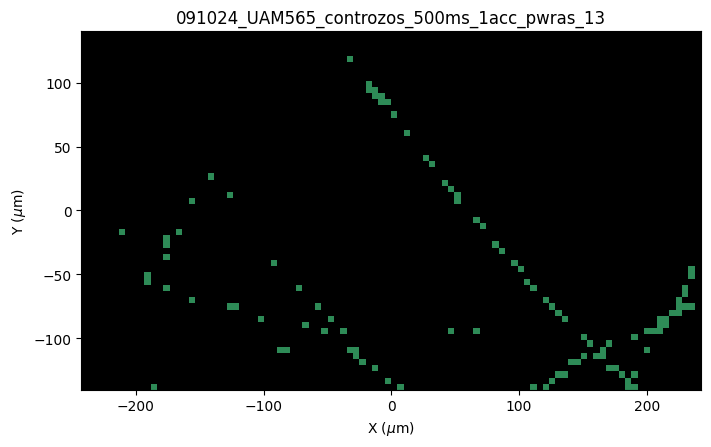


Procesando archivo: 091024_UAM565_controzos_500ms_1acc_pwras_14
Válidos: 104, Outliers: 0


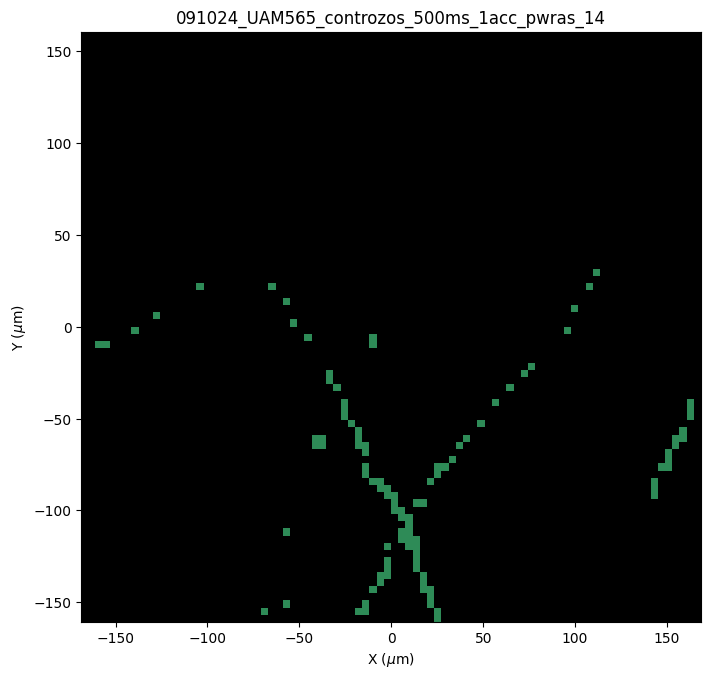


Procesando archivo: 091024_UAM565_controzos_500ms_1acc_pwras_15
Válidos: 41, Outliers: 0


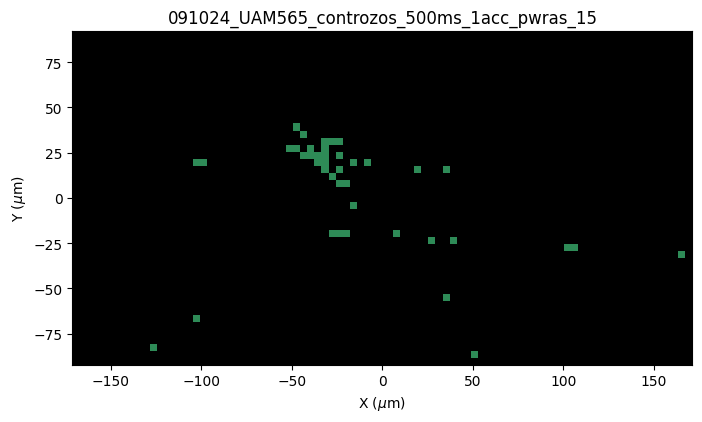


Procesando archivo: 091024_UAM565_controzos_500ms_1acc_pwras_17
Válidos: 62, Outliers: 0


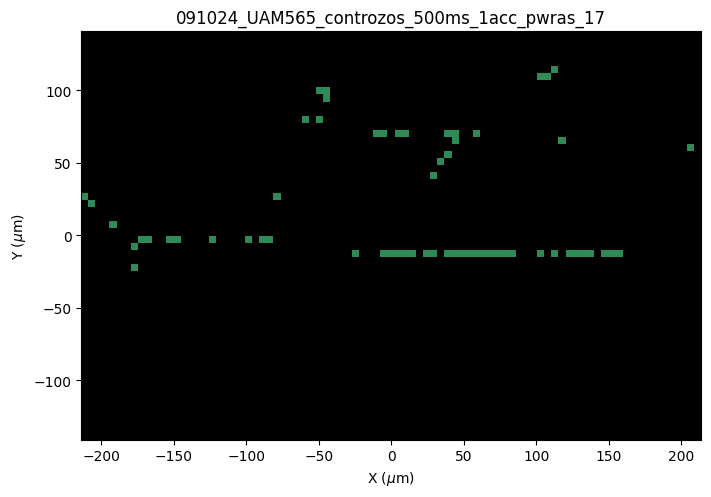


Procesando archivo: 091024_UAM588_2_500ms_1acc_pwras_1
Válidos: 39, Outliers: 0


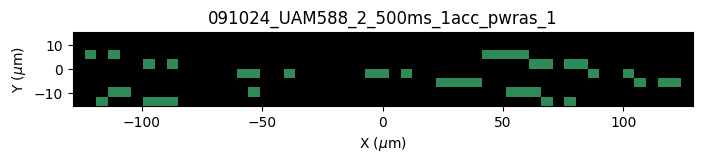


Procesando archivo: 091024_UAM588_2_500ms_1acc_pwras_2
Válidos: 10, Outliers: 0


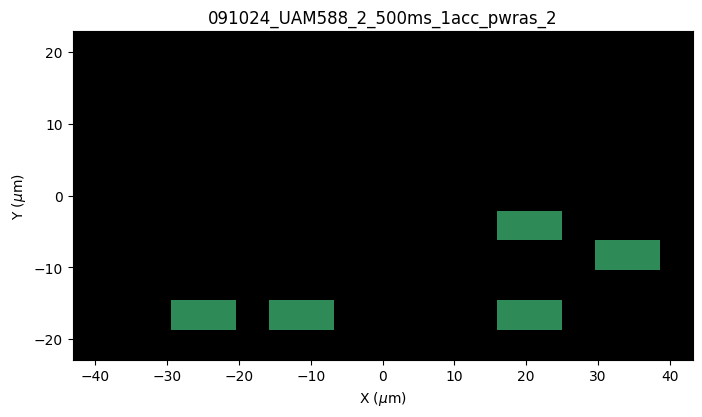


Procesando archivo: 091024_UAM588_2_500ms_1acc_pwras_3
Válidos: 52, Outliers: 0


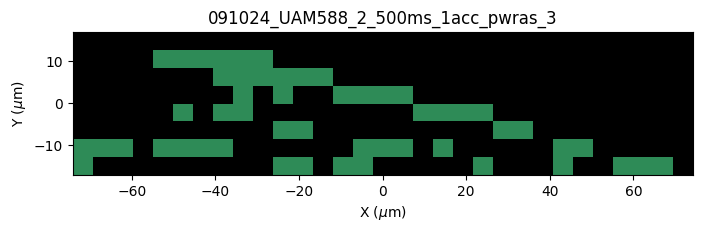


Procesando archivo: 091024_UAM588_2_500ms_1acc_pwras_4
Válidos: 56, Outliers: 0


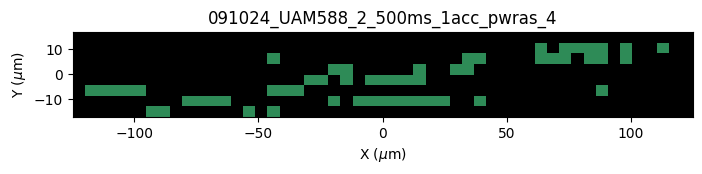


Procesando archivo: 091024_UAM588_2_500ms_1acc_pwras_5
Válidos: 111, Outliers: 0


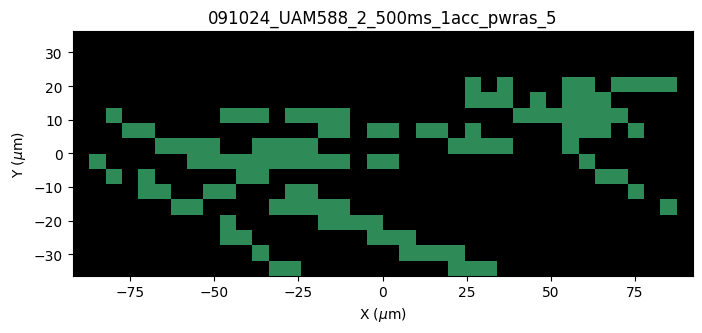


Procesando archivo: 091024_UAM588_2_500ms_1acc_pwras_6
Válidos: 48, Outliers: 0


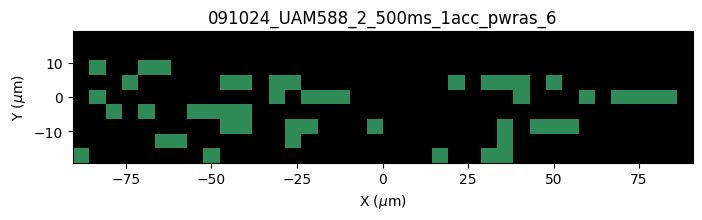


Procesando archivo: 091024_UAM588_2_500ms_1acc_pwras_7
Válidos: 46, Outliers: 0


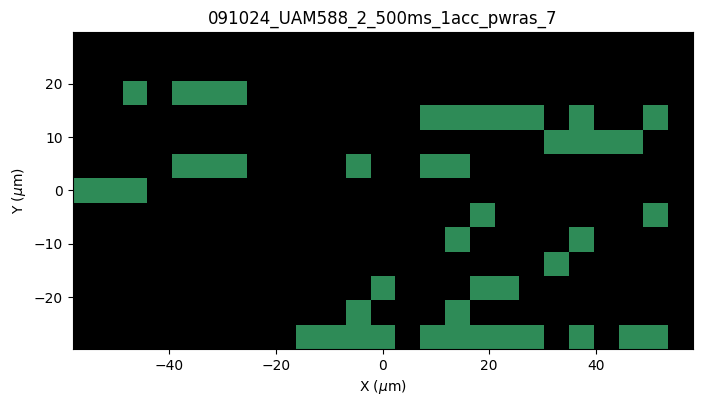


Procesando archivo: 091024_UAM588_2_500ms_1acc_pwras_8
Válidos: 183, Outliers: 0


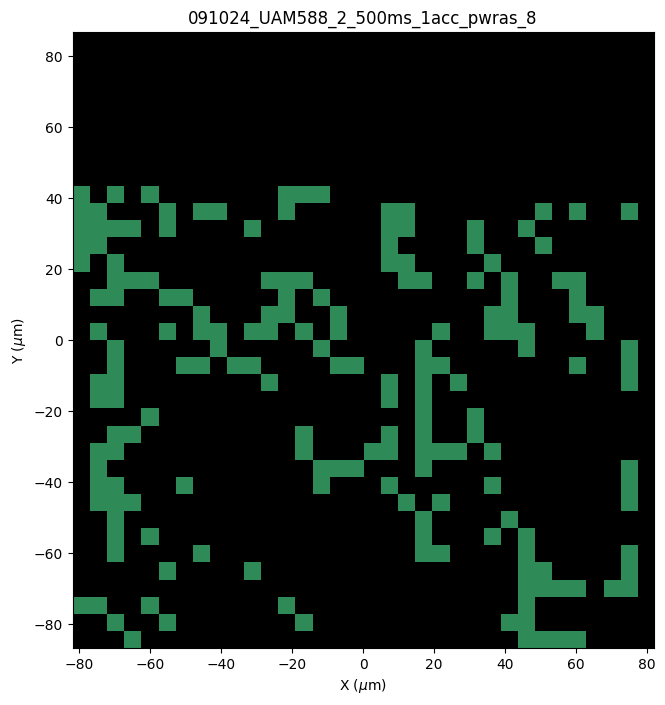


Procesando archivo: 091024_UAM588_500ms_1acc_pwras_1
Válidos: 424, Outliers: 0


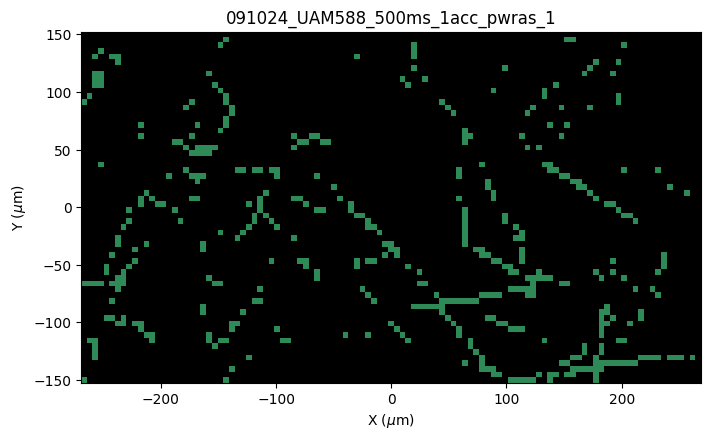


Procesando archivo: 091024_UAM588_500ms_1acc_pwras_2
Válidos: 181, Outliers: 0


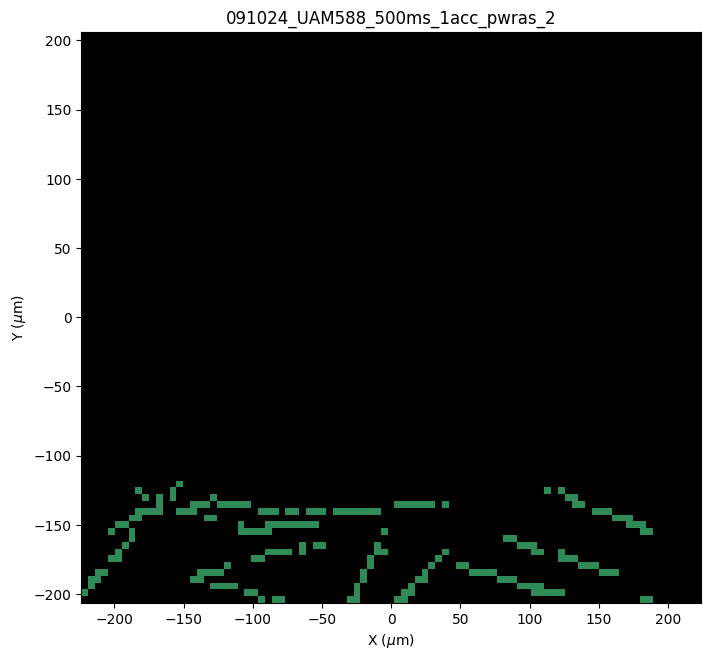


Procesando archivo: 091024_UAM588_500ms_1acc_pwras_3
Válidos: 353, Outliers: 0


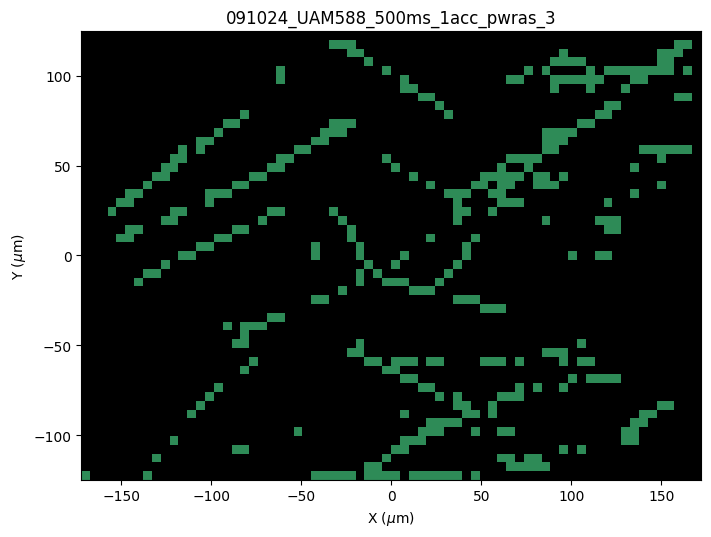


Procesando archivo: 091024_UAM588_500ms_1acc_pwras_4
Válidos: 5, Outliers: 0


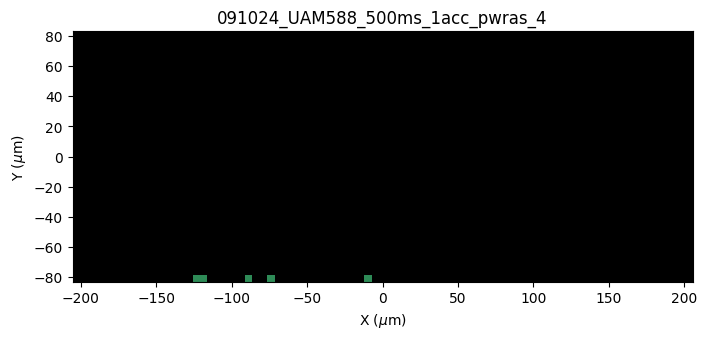


Procesando archivo: 091024_UAM588_500ms_1acc_pwras_5
Válidos: 157, Outliers: 0


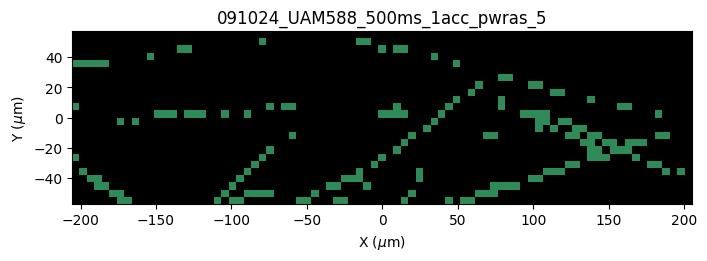


Procesando archivo: 100724_UAM502_500ms_1acc_pwmuesca1
Válidos: 375, Outliers: 0


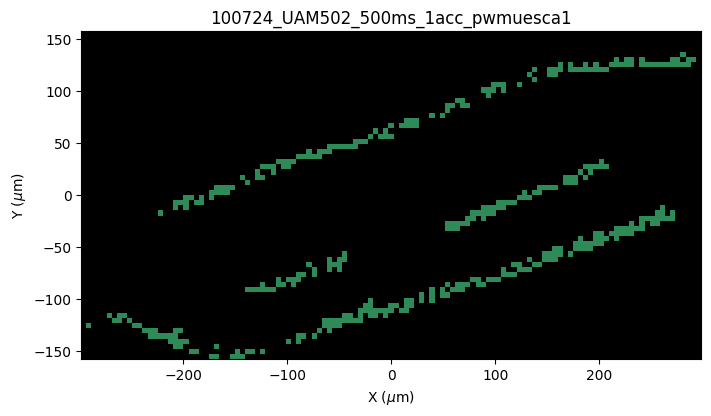


Procesando archivo: 100724_UAM502_500ms_1acc_pwmuesca1_2
Válidos: 96, Outliers: 0


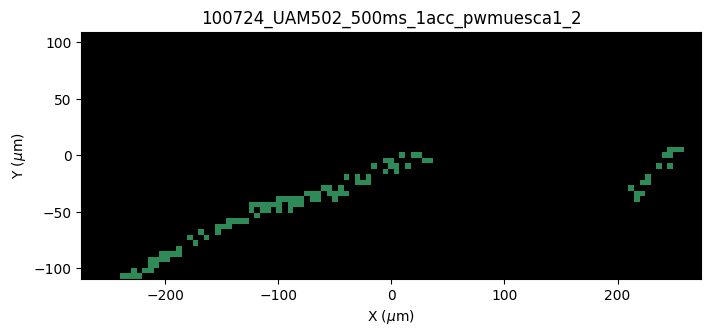


Procesando archivo: 100724_UAM502_500ms_1acc_pwmuesca1_3
Válidos: 37, Outliers: 0


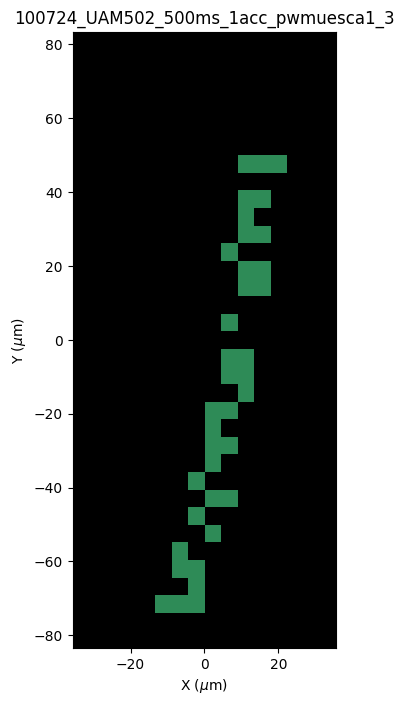


Procesando archivo: 100724_UAM588_1s_2acc_2um
Válidos: 756, Outliers: 0


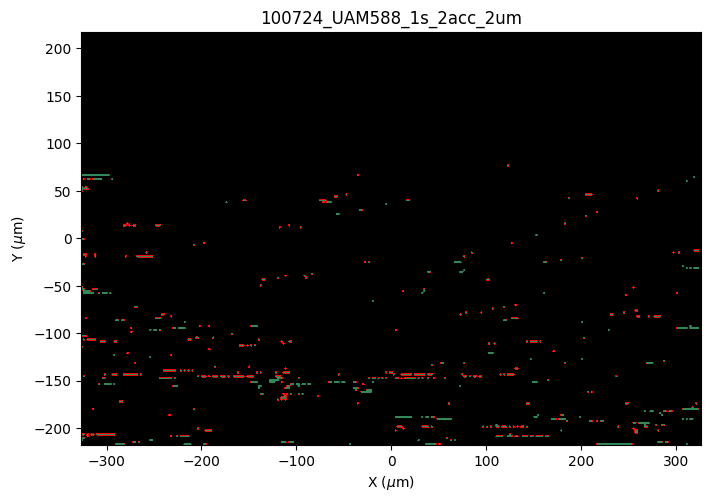


Procesando archivo: 100824_UAM565_1s_1acc_pwcasi1_2um_1
Válidos: 279, Outliers: 0


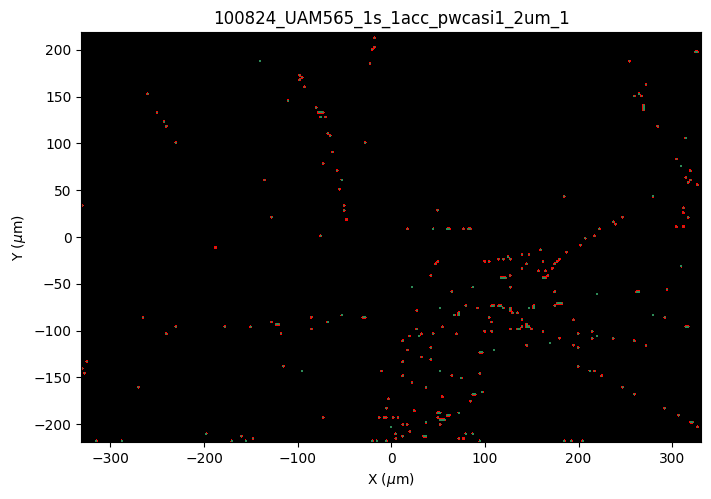


Procesando archivo: 110624_UAM253_1s_1acc_pwmuesca1_10um_3
Válidos: 201, Outliers: 0
No se encontraron datos en infomapas para el archivo: 110624_UAM253_1s_1acc_pwmuesca1_10um_3

Procesando archivo: 110624_UAM253_1s_1acc_pwmuesca1_5um_1
Válidos: 879, Outliers: 0


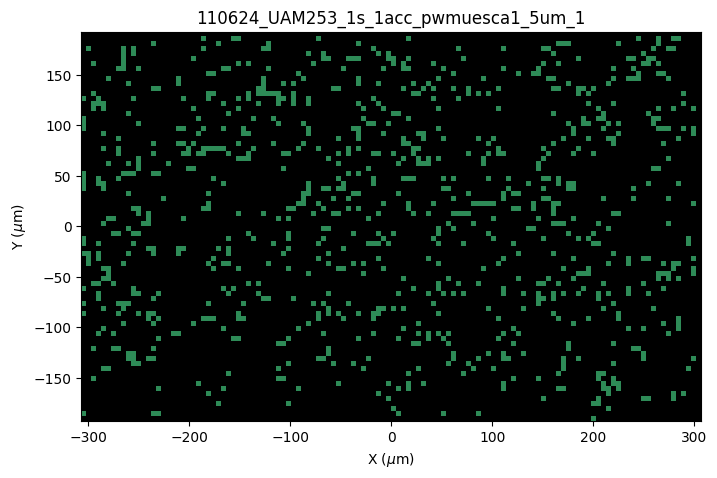


Procesando archivo: 110624_UAM253_1s_1acc_pwmuesca1_7um_2
Válidos: 391, Outliers: 0


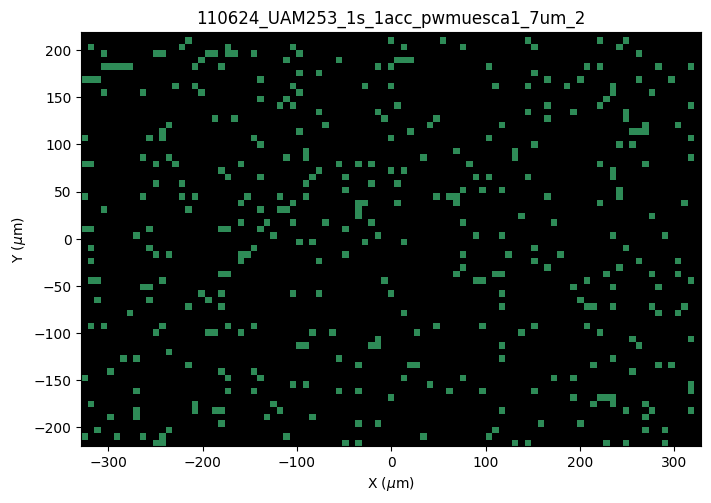


Procesando archivo: 120624_UAM253_1s_1acc_pwmuesca1_10um_4
Válidos: 272, Outliers: 0


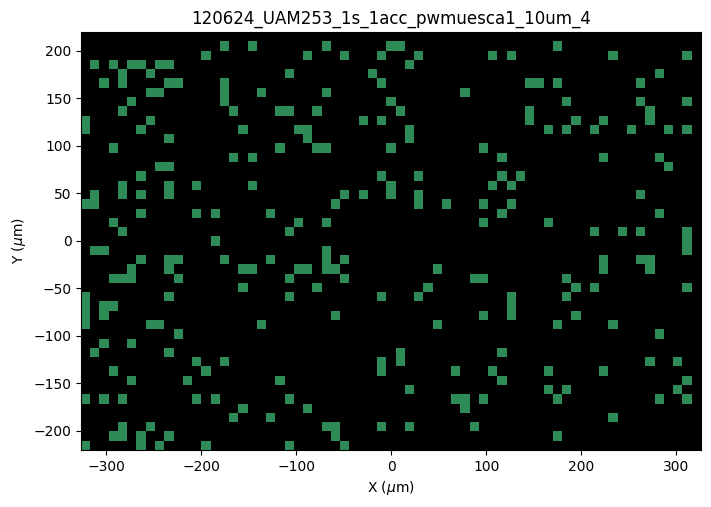


Procesando archivo: 120624_UAM253_1s_1acc_pwmuesca1_10um_6
Válidos: 233, Outliers: 0


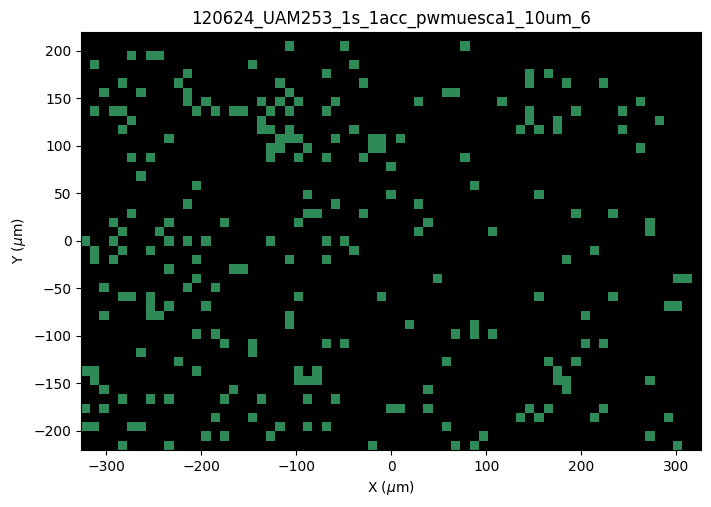


Procesando archivo: 120624_UAM253_1s_1acc_pwmuesca1_5um_5
Válidos: 636, Outliers: 0


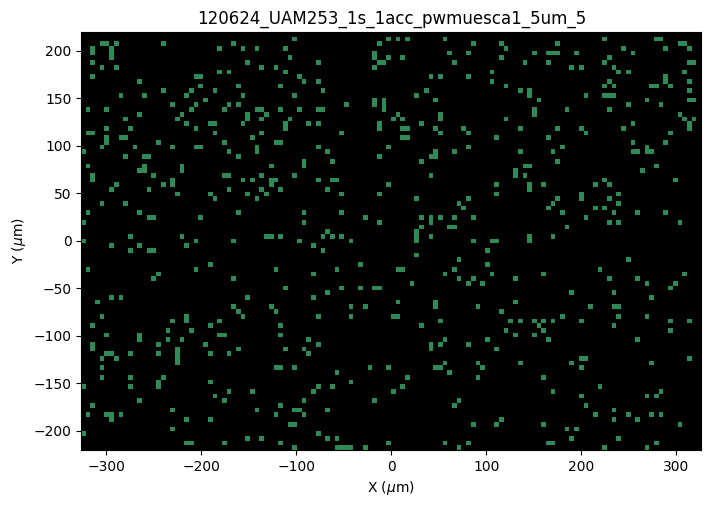


Procesando archivo: 120624_UAM253_1s_1acc_pwras_5um_10
Válidos: 159, Outliers: 0


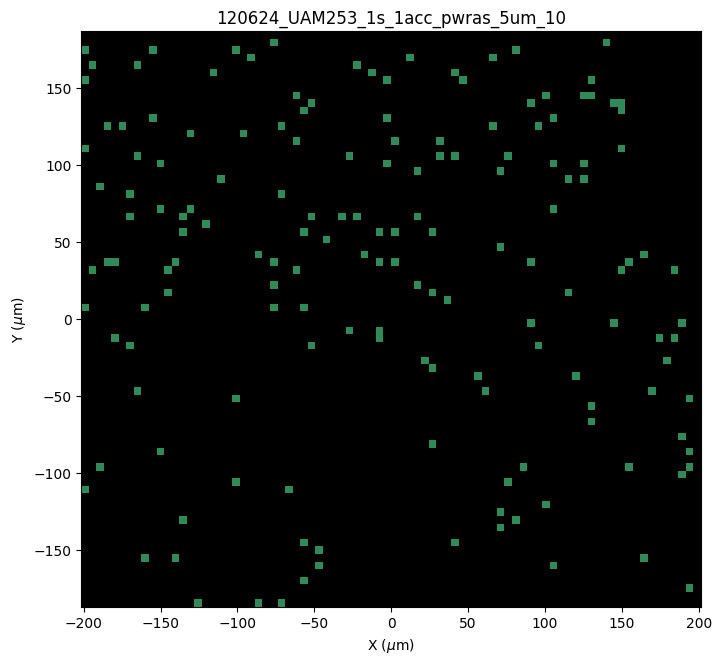


Procesando archivo: 120624_UAM253_1s_1acc_pwras_5um_9
Válidos: 493, Outliers: 0


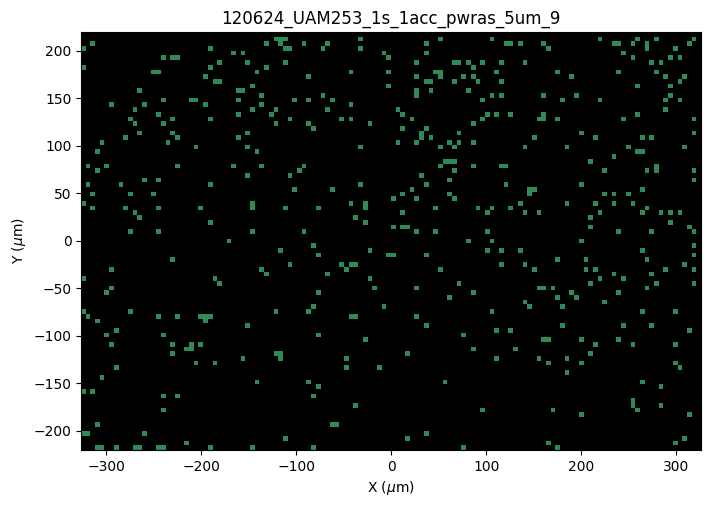


Procesando archivo: 120624_UAM253_2s_1acc_pwmuesca1_10um_7
Válidos: 340, Outliers: 0


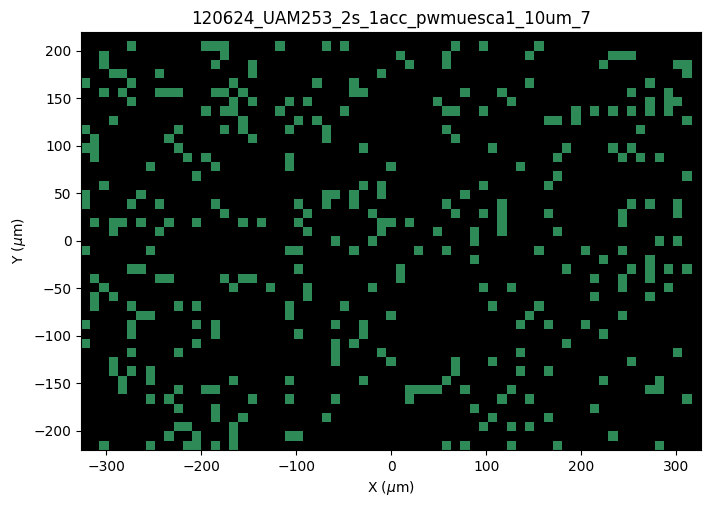


Procesando archivo: 120624_UAM253_2s_1acc_pwmuesca1_10um_8
Válidos: 406, Outliers: 0


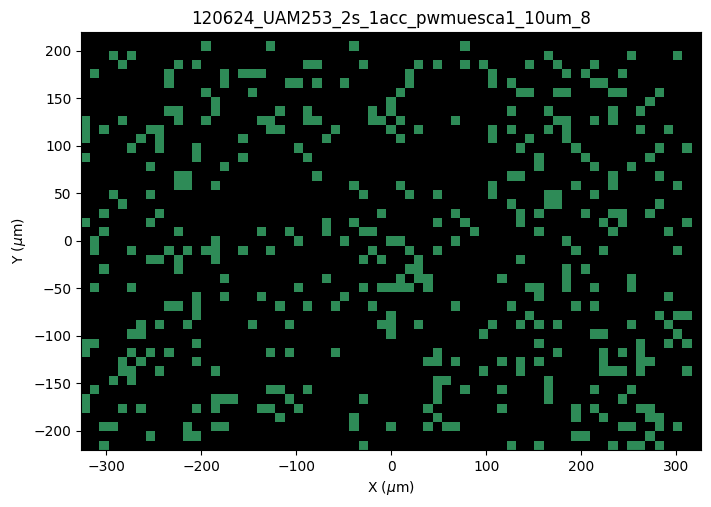


Procesando archivo: 120824_UAM565_300ms_1acc_pwcasiras_6um_1
Válidos: 359, Outliers: 0


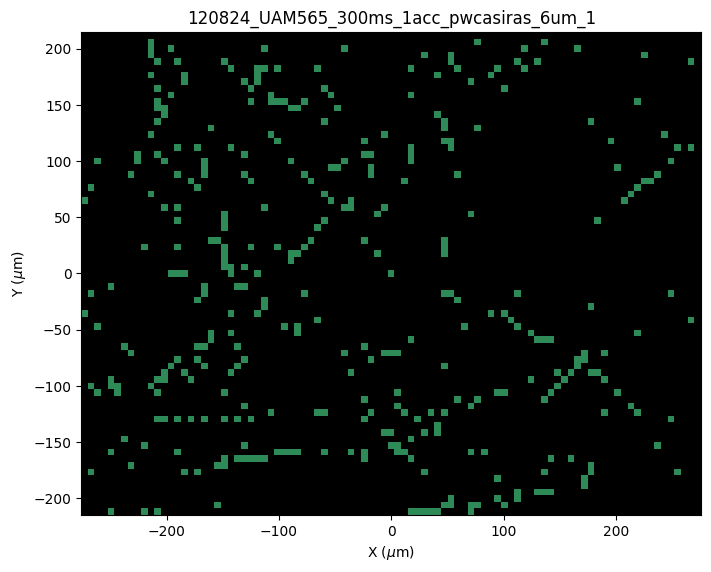


Procesando archivo: 120824_UAM565_300ms_1acc_pwcasiras_6um_2
Válidos: 237, Outliers: 0


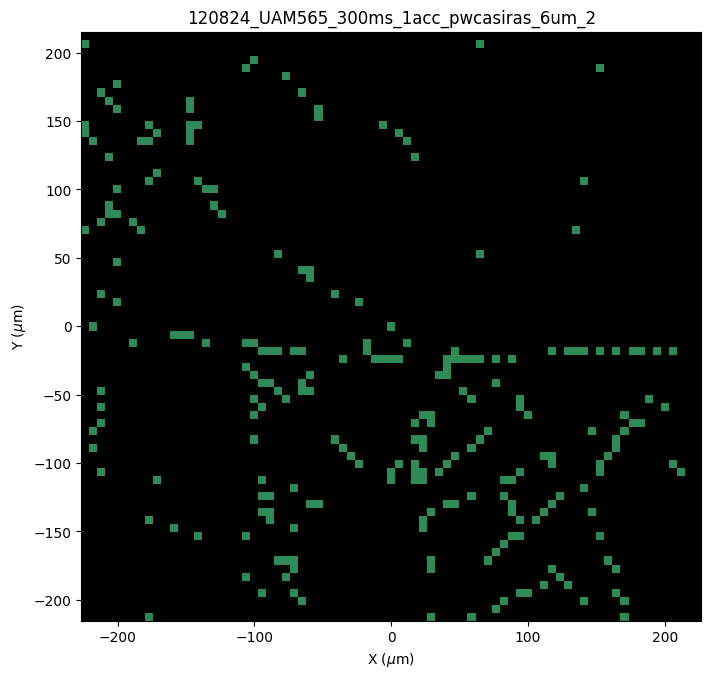


Procesando archivo: 120824_UAM565_300ms_1acc_pwcasiras_6um_3
Válidos: 206, Outliers: 0


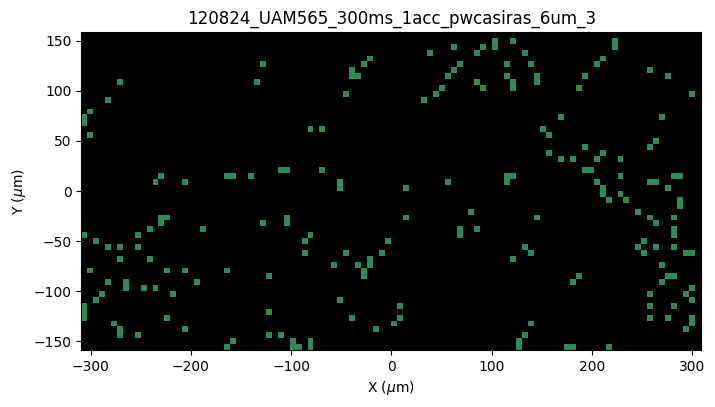


Procesando archivo: 120824_UAM565_300ms_1acc_pwcasiras_6um_4
Válidos: 31, Outliers: 0


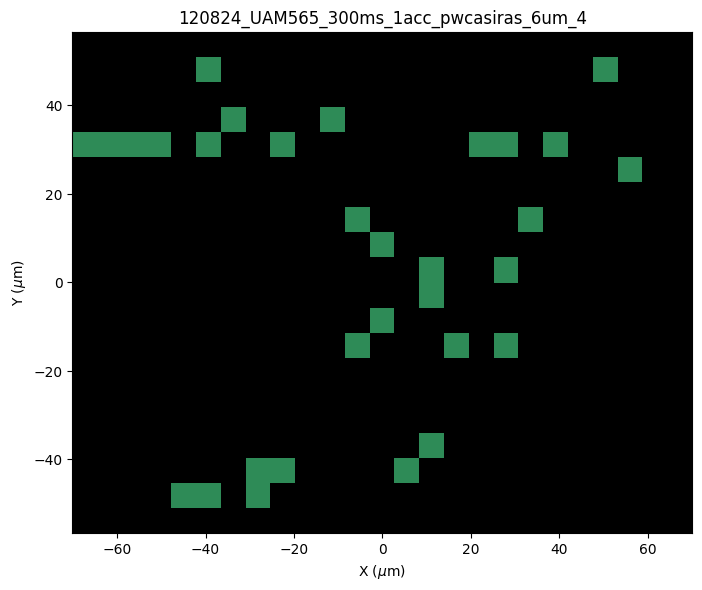


Procesando archivo: 120824_UAM565_300ms_1acc_pwcasiras_6um_5
Válidos: 135, Outliers: 0


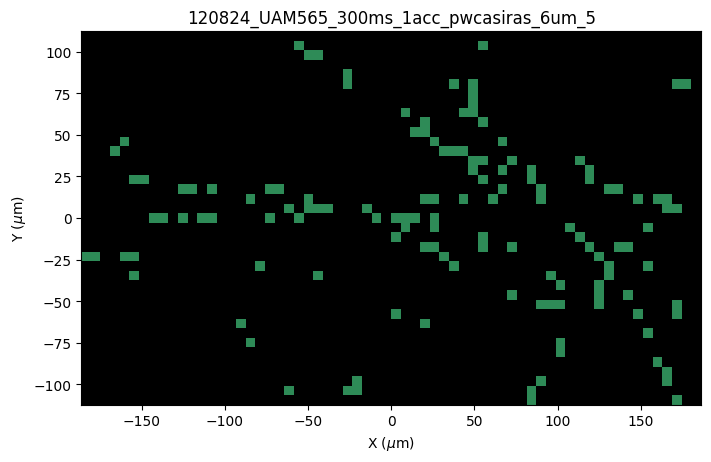


Procesando archivo: 120824_UAM565_300ms_1acc_pwmedio1_5um_3
Válidos: 172, Outliers: 0


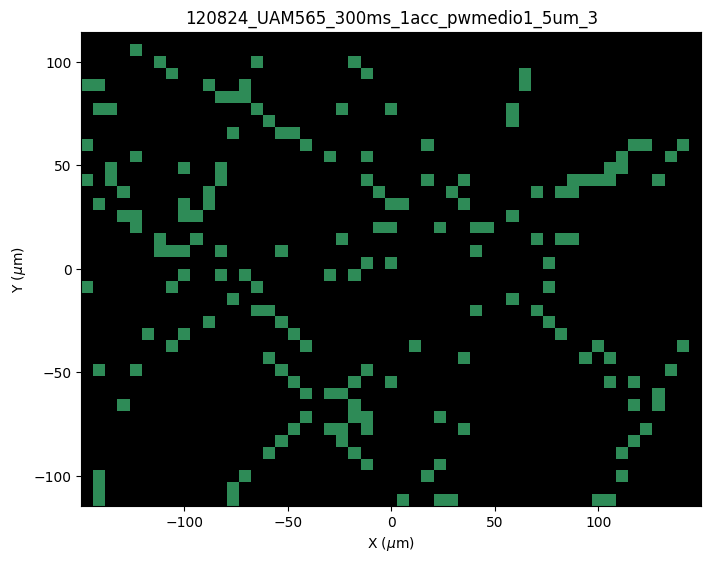


Procesando archivo: 120824_UAM565_500ms_1acc_pwmedio1_5um_1
Válidos: 251, Outliers: 0


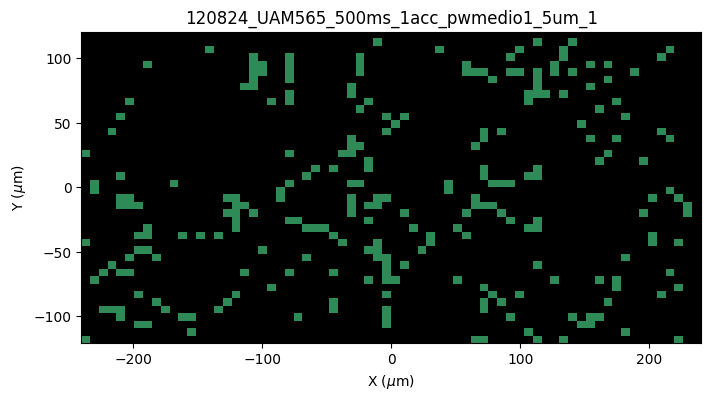


Procesando archivo: 120824_UAM565_500ms_1acc_pwmedio1_5um_2
Válidos: 280, Outliers: 0


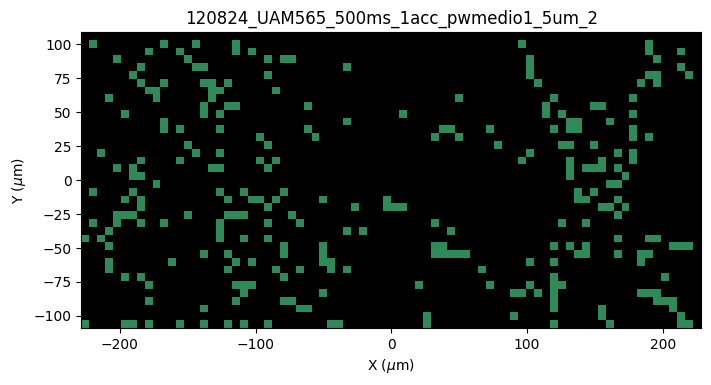


Procesando archivo: 120824_UAM565_500ms_1acc_pwmedio1_5um_3
Válidos: 116, Outliers: 0


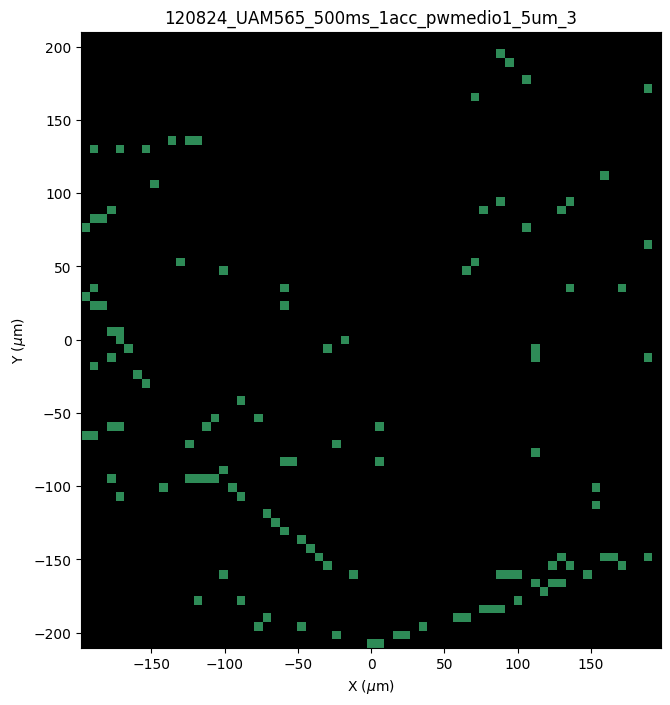


Procesando archivo: 120824_UAM565_500ms_1acc_pwmedio1_5um_4
Válidos: 71, Outliers: 0


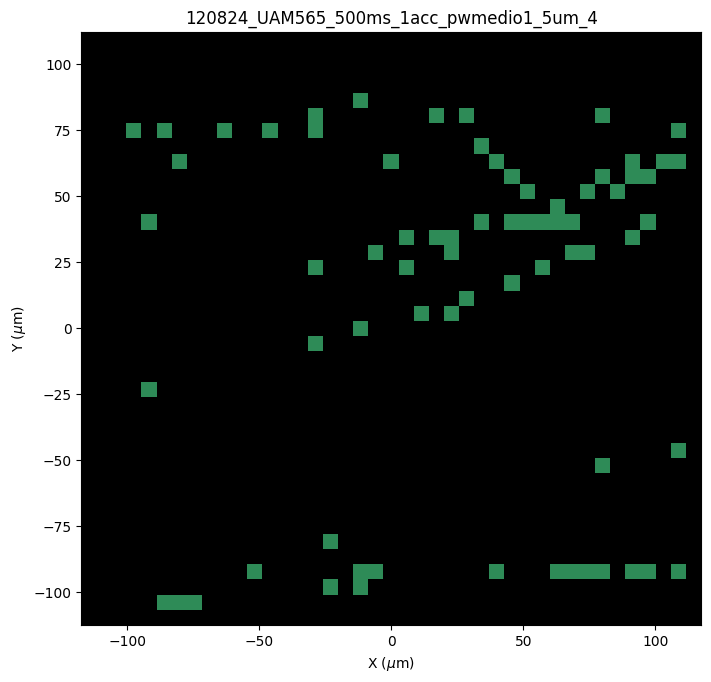


Procesando archivo: 120824_UAM565_500ms_1acc_pwmedio1_5um_5
Válidos: 109, Outliers: 0


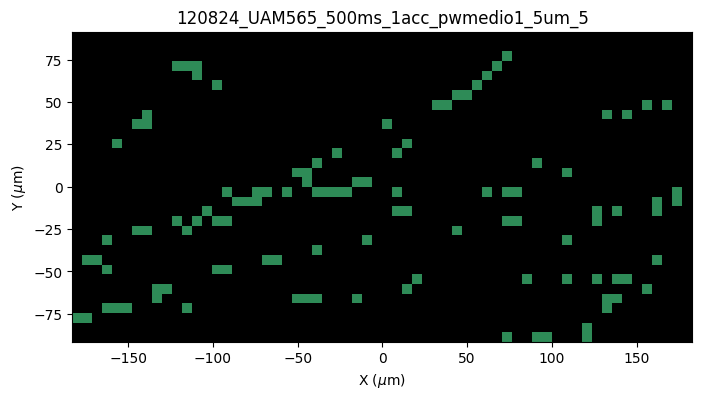


Procesando archivo: 120824_UAM565_500ms_1acc_pwmedio1_5um_6
Válidos: 66, Outliers: 0


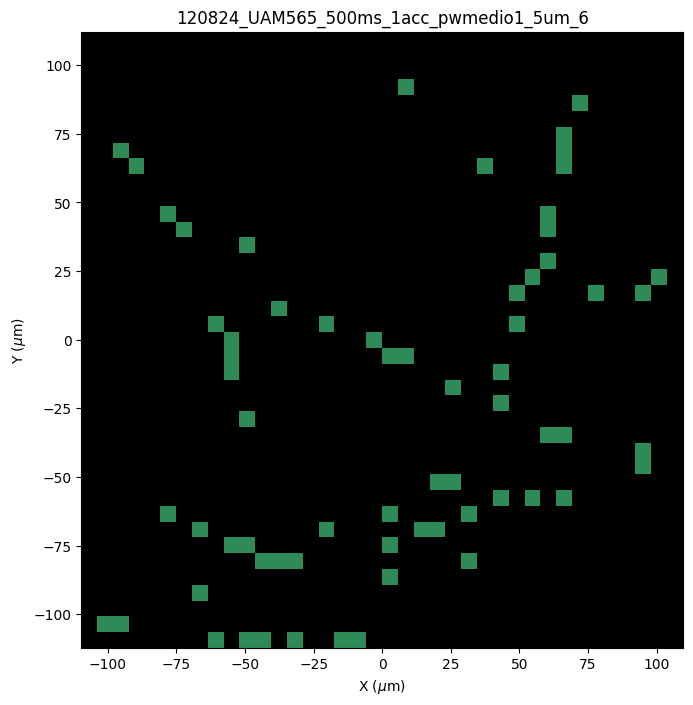


Procesando archivo: 130824_UAM253_500ms_1acc_pwcasi1_6um_1
Válidos: 208, Outliers: 0


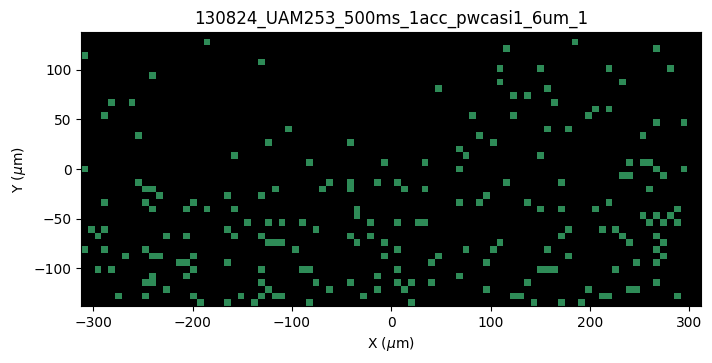


Procesando archivo: 130824_UAM253_500ms_1acc_pwcasi1_6um_2
Válidos: 130, Outliers: 0


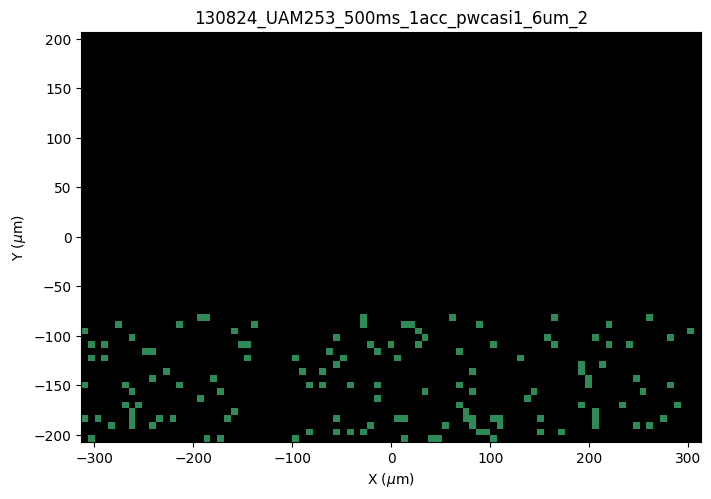


Procesando archivo: 130824_UAM565_1s_1acc_pwmuesca1_6um_1
Válidos: 32, Outliers: 0


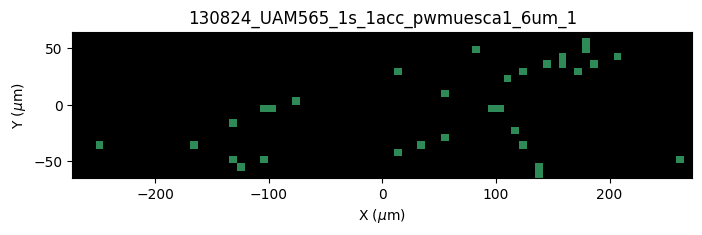


Procesando archivo: 130824_UAM565_1s_1acc_pwmuesca1_6um_2
Válidos: 34, Outliers: 0


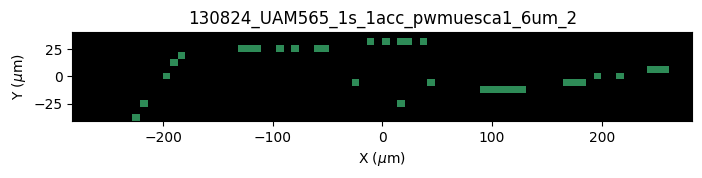


Procesando archivo: 130824_UAM565_1s_1acc_pwmuesca1_6um_3
Válidos: 54, Outliers: 0


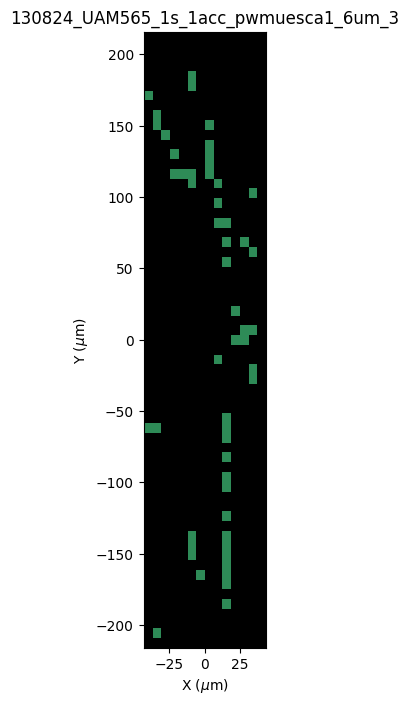


Procesando archivo: 130824_UAM565_1s_1acc_pwmuesca1_6um_4
Válidos: 14, Outliers: 0


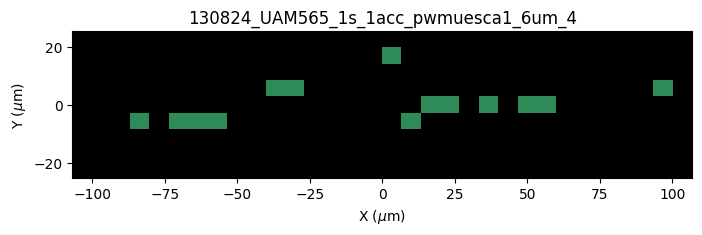


Procesando archivo: 130824_UAM565_300ms_1acc_pwmedio_6um_1
Válidos: 136, Outliers: 0


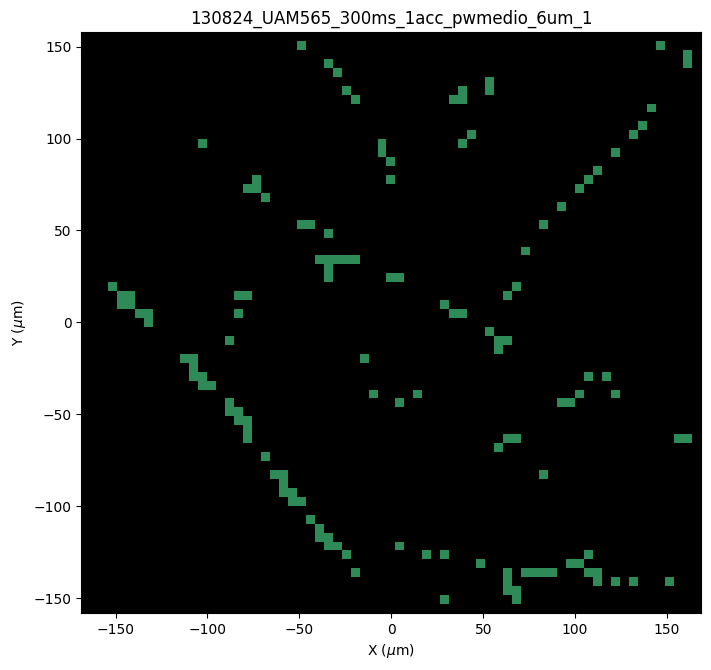


Procesando archivo: 130824_UAM565_300ms_1acc_pwmedio_6um_2
Válidos: 158, Outliers: 0


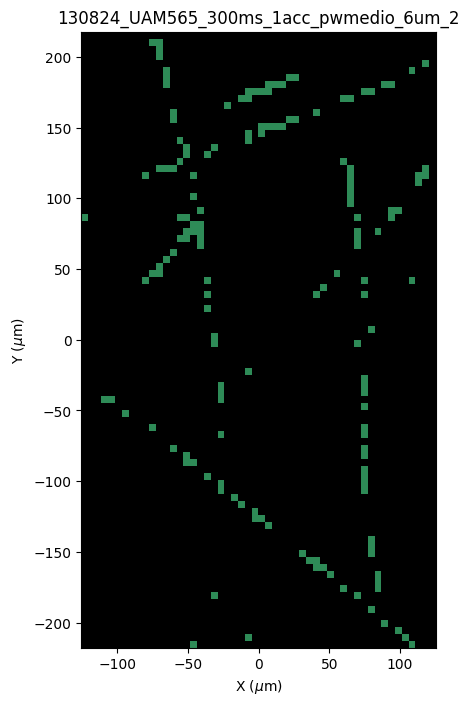


Procesando archivo: 130824_UAM565_300ms_1acc_pwmedio_6um_3
Válidos: 142, Outliers: 0


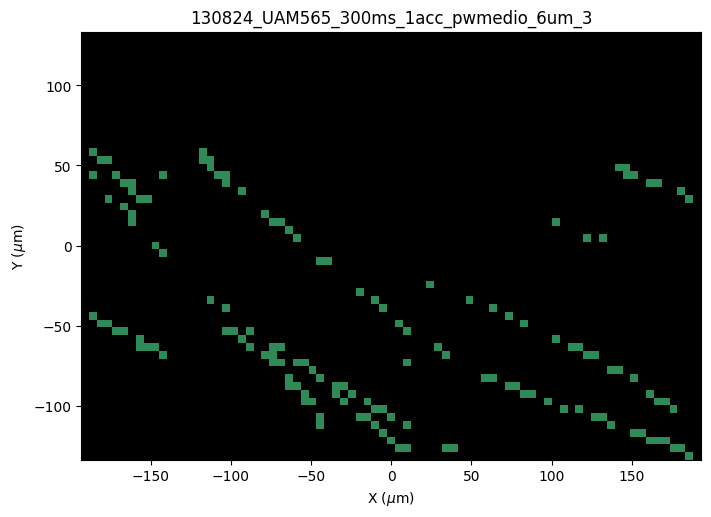


Procesando archivo: 130824_UAM565_300ms_1acc_pwmedio_6um_4
Válidos: 85, Outliers: 0


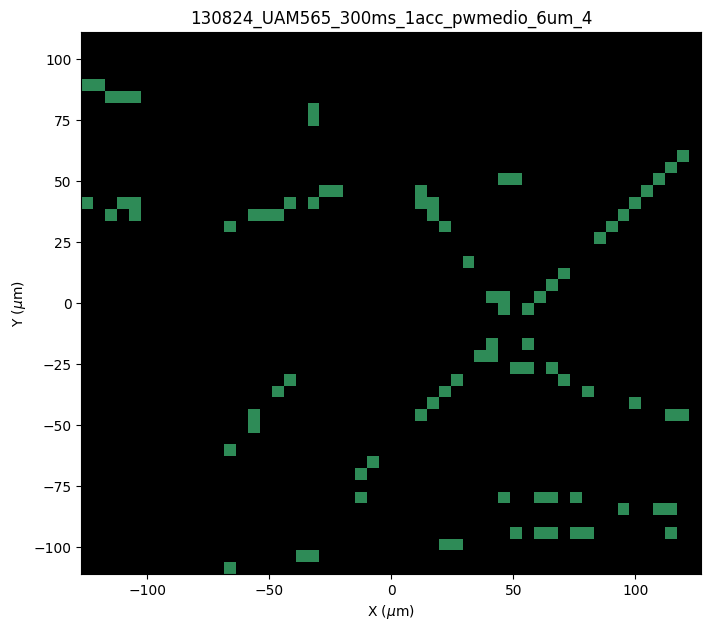


Procesando archivo: 130824_UAM565_500ms_1acc_pwmuescacasi1_5um_1
Válidos: 67, Outliers: 0


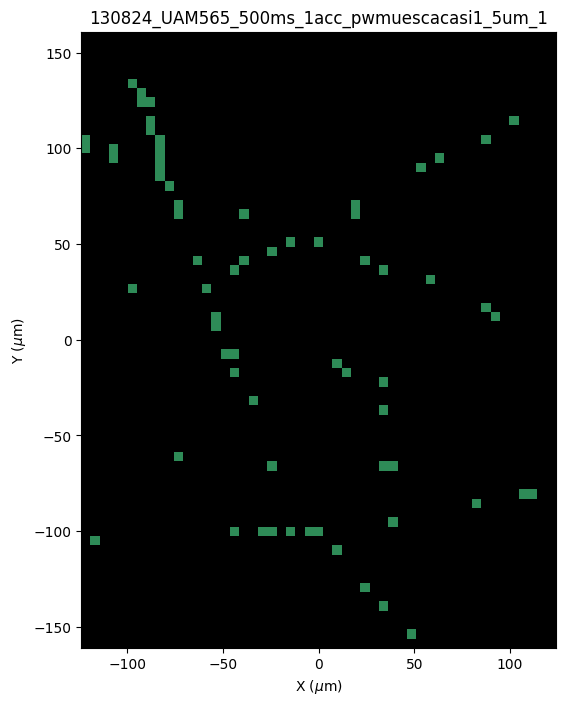


Procesando archivo: 130824_UAM565_500ms_1acc_pwmuescacasi1_5um_2
Válidos: 206, Outliers: 0


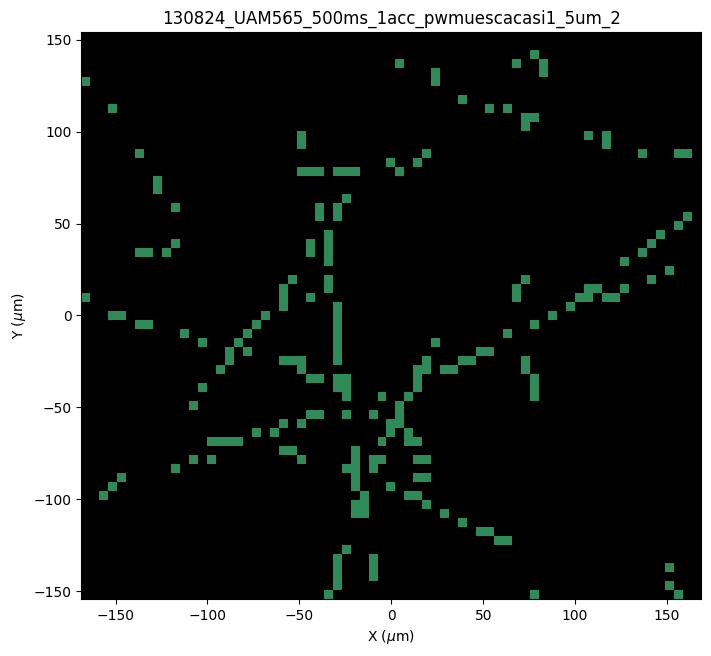


Procesando archivo: 140323_UAM588_2s_1acc_pwmuesca2_3um
Válidos: 45, Outliers: 0
No se encontraron datos en infomapas para el archivo: 140323_UAM588_2s_1acc_pwmuesca2_3um

Procesando archivo: 140323_UAM588_2s_1acc_pwmuesca2_4um
Válidos: 32, Outliers: 0
No se encontraron datos en infomapas para el archivo: 140323_UAM588_2s_1acc_pwmuesca2_4um

Procesando archivo: 140824_UAM253_500ms_1acc_pwcas1_5um_1
Válidos: 62, Outliers: 0


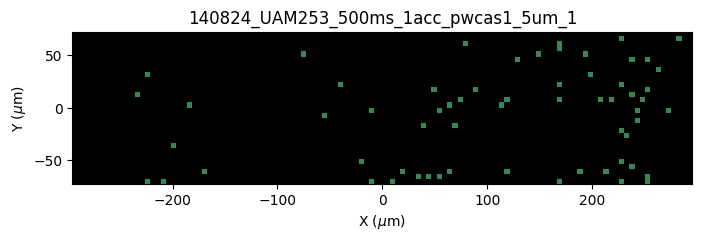


Procesando archivo: 140824_UAM253_500ms_1acc_pwcas1_5um_2
Válidos: 861, Outliers: 0


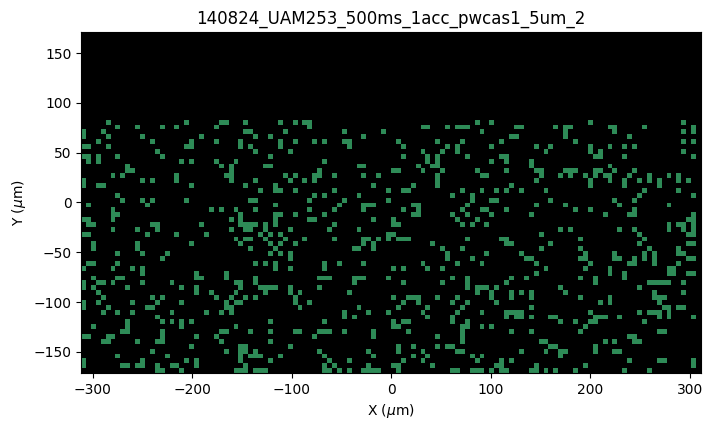


Procesando archivo: 140824_UAM565_500ms_1acc_pwmuesca1_2um_1_largo
Válidos: 1502, Outliers: 0


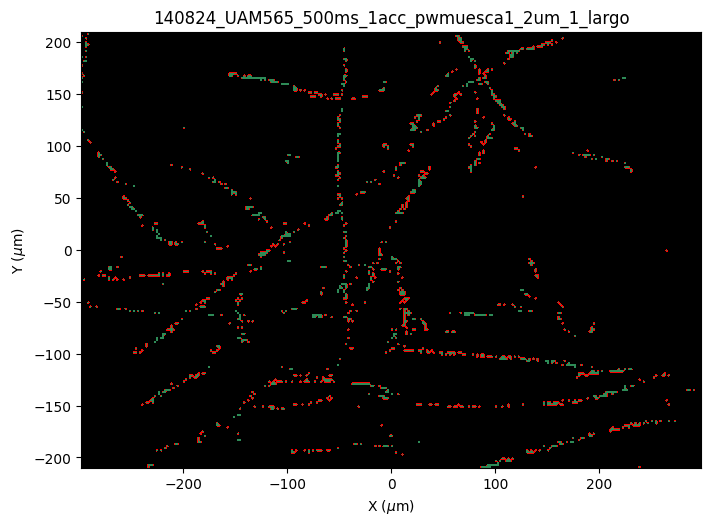


Procesando archivo: 140824_UAM565_500ms_1acc_pwmuesca1_5um_1
Válidos: 113, Outliers: 0


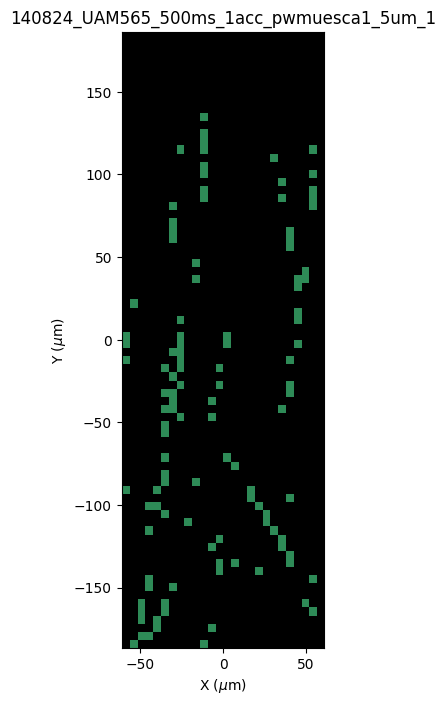


Procesando archivo: 140824_UAM565_500ms_1acc_pwmuesca1_5um_10
Válidos: 10, Outliers: 0


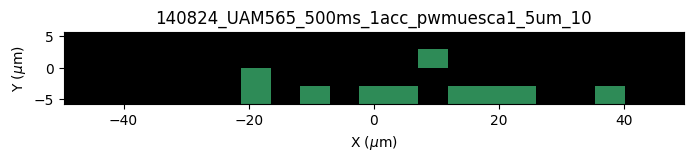


Procesando archivo: 140824_UAM565_500ms_1acc_pwmuesca1_5um_2
Válidos: 31, Outliers: 0


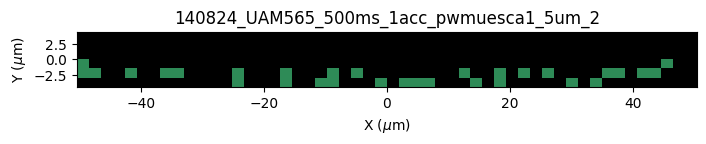


Procesando archivo: 140824_UAM565_500ms_1acc_pwmuesca1_5um_3
Válidos: 11, Outliers: 0


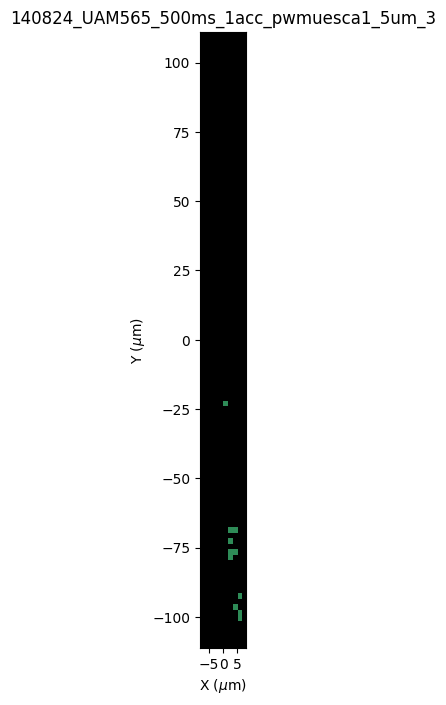


Procesando archivo: 140824_UAM565_500ms_1acc_pwmuesca1_5um_4
Válidos: 3, Outliers: 0


KeyboardInterrupt: 

In [102]:

# Función para graficar el mapa de coordenadas basado en los valores de X e Y y usando índices de outliers
def plot_coordinate_map(group, outliers_indices, df_infomapas, name, custom_cmap):
    # Mapa de coordenadas basado en el archivo infomapas
    group_infomapas = df_infomapas[df_infomapas['filename'] == name]

    if group_infomapas.empty:
        print(f"No se encontraron datos en infomapas para el archivo: {name}")
        return

    # Obtener los límites y el tamaño del paso
    X_min = group_infomapas['X_min'].values[0]
    X_max = group_infomapas['X_max'].values[0]
    Y_min = group_infomapas['Y_min'].values[0]
    Y_max = group_infomapas['Y_max'].values[0]
    X_step = group_infomapas['X_step'].values[0]
    Y_step = group_infomapas['Y_step'].values[0]

    # Crear una matriz para el mapa con los límites y pasos conocidos
    x_range = np.arange(X_min, X_max + X_step, X_step)
    y_range = np.arange(Y_min, Y_max + Y_step, Y_step)
    mapa = np.full((len(y_range), len(x_range)), -1)  # Inicializar el mapa en negro (-1 para faltantes)

    # Trazar las coordenadas del grupo en el mapa
    for index, row in group.iterrows():
        x_coord = row['X']
        y_coord = row['Y']

        # Determinar si el índice es un outlier
        is_outlier = index in outliers_indices

        # Encontrar las posiciones en el mapa
        x_idx = np.argmin(np.abs(x_range - x_coord))
        y_idx = np.argmin(np.abs(y_range - y_coord))

        # Asignar el color: 1 para verde (no outlier), 0 para rojo (outlier)
        mapa[y_idx, x_idx] = 0 if is_outlier else 1  # Rojo si es outlier, verde si no lo es

    # Graficar el mapa
    plt.figure(figsize=(8, 8))
    plt.imshow(mapa, cmap=custom_cmap, origin='lower', extent=[X_min, X_max, Y_min, Y_max])
    plt.title(f"{name}")
    plt.xlabel("X ($\\mu$m)")
    plt.ylabel("Y ($\\mu$m)")
    plt.show()

# Cargar el archivo infomapas
ruta_infomapas = r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\infomapas.CSV'
df_infomapas = pd.read_csv(ruta_infomapas)

# Colormap personalizado: negro (-1), verde (1), rojo (0)
custom_cmap = ListedColormap(['black', 'red', 'seagreen'])

# Función principal para procesar trainval y test
def process_spectra_and_plot_maps(df_corrected, outliers_indices, df_infomapas, process_title):
    # Agrupar por 'name' para generar gráficos y calcular promedios por archivo
    grouped_by_name = df_corrected.groupby('name')

    for name, group in grouped_by_name:
        # Contar los espectros válidos y los descartados
        valid_spectra_count = len(group) - sum(group.index.isin(outliers_indices))
        outliers_count = sum(group.index.isin(outliers_indices))

        # Imprimir información del procesamiento
        print(f"\nProcesando archivo: {name}")
        print(f"Válidos: {valid_spectra_count}, Outliers: {outliers_count}")
        
        # Generar el mapa de coordenadas
        plot_coordinate_map(group, outliers_indices, df_infomapas, name, custom_cmap)


process_spectra_and_plot_maps(df, outliers_indices_trainval, df_infomapas, "Trainval")
process_spectra_and_plot_maps(df_test_corrected, outliers_indices_test, df_infomapas, "Test")


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def plot_coordinate_map_subplots(df_corrected, outliers_indices, df_infomapas, names, custom_cmap):
    # Configuración de subplots 4x4
    fig, axes = plt.subplots(4, 4, figsize=(20, 20))
    axes = axes.flatten()  # Convertir a una lista para iterar fácilmente
    
    # Iterar sobre los nombres proporcionados
    for i, name in enumerate(names):
        if i >= 16:  # Limitar a 4x4 subplots
            break
        
        # Filtrar el DataFrame por el nombre actual
        group = df_corrected[df_corrected['name'] == name]
        group_infomapas = df_infomapas[df_infomapas['filename'] == name]

        if group.empty or group_infomapas.empty:
            print(f"No hay datos para el archivo: {name}")
            axes[i].set_title(f"{name} (No data)")
            axes[i].axis('off')
            continue

        # Extraer límites y pasos del archivo infomapas
        X_min = group_infomapas['X_min'].values[0]
        X_max = group_infomapas['X_max'].values[0]
        Y_min = group_infomapas['Y_min'].values[0]
        Y_max = group_infomapas['Y_max'].values[0]
        X_step = group_infomapas['X_step'].values[0]
        Y_step = group_infomapas['Y_step'].values[0]

        # Crear matriz para el mapa
        x_range = np.arange(X_min, X_max + X_step, X_step)
        y_range = np.arange(Y_min, Y_max + Y_step, Y_step)
        mapa = np.full((len(y_range), len(x_range)), -1)  # Inicializar el mapa

        # Rellenar el mapa con los valores
        for index, row in group.iterrows():
            x_coord = row['X']
            y_coord = row['Y']
            is_outlier = index in outliers_indices

            # Coordenadas en el mapa
            x_idx = np.argmin(np.abs(x_range - x_coord))
            y_idx = np.argmin(np.abs(y_range - y_coord))

            # Asignar valores: 0 (outlier), 1 (válido)
            mapa[y_idx, x_idx] = 0 if is_outlier else 1

        # Graficar en el subplot correspondiente
        ax = axes[i]
        ax.imshow(mapa, cmap=custom_cmap, origin='lower', extent=[X_min, X_max, Y_min, Y_max])
        ax.set_title(f"{name}", fontsize=12)
        ax.set_xlabel("X ($\\mu$m)")
        ax.set_ylabel("Y ($\\mu$m)")

    # Desactivar subplots vacíos
    for j in range(len(names), 16):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

# Configuración del colormap personalizado
custom_cmap = ListedColormap(['black', 'red', 'seagreen'])

# Lista de nombres de infomapas a graficar

names_to_plot = ['130824_UAM502_500ms_1acc_pwcasi1_6um_7',  '091024_UAM588_500ms_1acc_pwras_1','090824_UAM565_700ms_1acc_pwmuescacasi1_5um_2', '110624_UAM253_1s_1acc_pwmuesca1_5um_1']


names_to_plot = ['130824_UAM502_500ms_1acc_pwcasi1_6um_7', '091024_UAM588_500ms_1acc_pwras_1', '100724_UAM502_500ms_1acc_pwmuesca1',  '220724_UAM588_500ms_pwras_2um_5','090824_UAM565_700ms_1acc_pwmuescacasi1_5um_2', '110624_UAM253_1s_1acc_pwmuesca1_5um_1']

# Llamada a la función
plot_coordinate_map_subplots(df_corrected, outliers_indices_trainval, df_infomapas, names_to_plot, custom_cmap)


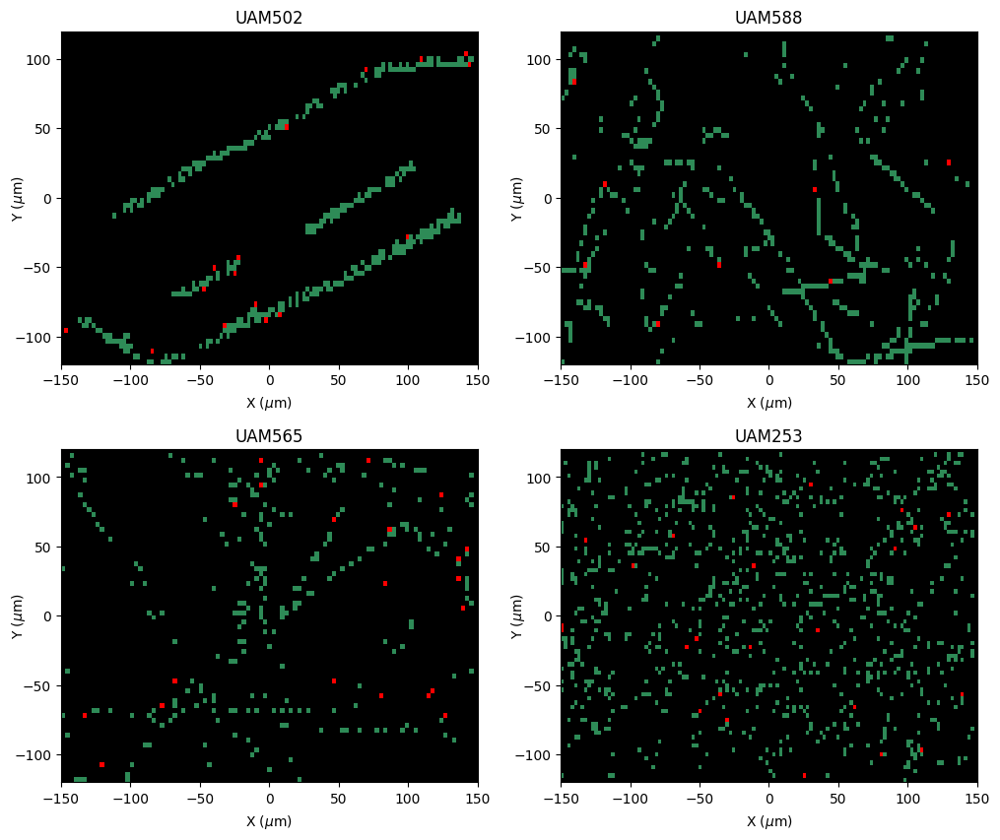

In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def plot_coordinate_map_subplots_2x2(df_corrected, outliers_indices, df_infomapas, names, custom_cmap):
    # Configuración de subplots 2x2 con espaciado personalizado
    fig, axes = plt.subplots(2, 2, figsize=(12, 12), gridspec_kw={'wspace': 0.2, 'hspace': -0.15})
    axes = axes.flatten()  # Convertir en lista para iterar

    # Iterar sobre los nombres proporcionados
    for i, name in enumerate(names):
        # Filtrar el DataFrame por el nombre actual

        titles = ['UAM502', 'UAM588', 'UAM565', 'UAM253']
        group = df_corrected[df_corrected['name'] == name]
        group_infomapas = df_infomapas[df_infomapas['filename'] == name]

        if group.empty or group_infomapas.empty:
            print(f"No hay datos para el archivo: {name}")
            axes[i].set_title(f"{name} (No data)")
            axes[i].axis('off')
            continue

        # Extraer límites y pasos del archivo infomapas
        X_min = group_infomapas['X_min'].values[0]
        X_max = group_infomapas['X_max'].values[0]
        Y_min = group_infomapas['Y_min'].values[0]
        Y_max = group_infomapas['Y_max'].values[0]
        X_step = group_infomapas['X_step'].values[0]
        Y_step = group_infomapas['Y_step'].values[0]

        # Crear matriz para el mapa
        x_range = np.arange(X_min, X_max + X_step, X_step)
        y_range = np.arange(Y_min, Y_max + Y_step, Y_step)
        mapa = np.full((len(y_range), len(x_range)), -1)  # Inicializar el mapa

        # Rellenar el mapa con los valores
        for index, row in group.iterrows():
            x_coord = row['X']
            y_coord = row['Y']
            is_outlier = index in outliers_indices

            # Coordenadas en el mapa
            x_idx = np.argmin(np.abs(x_range - x_coord))
            y_idx = np.argmin(np.abs(y_range - y_coord))

            # Asignar valores: 0 (outlier), 1 (válido)
            mapa[y_idx, x_idx] = 0 if is_outlier else 1

        # Graficar en el subplot correspondiente
        ax = axes[i]
        im = ax.imshow(mapa, cmap=custom_cmap, origin='lower', extent=[-150, 150, -120, 120])
        ax.set_title(f"{titles[i]}", fontsize=12)
        ax.set_xlabel("X ($\\mu$m)", labelpad=5)
        ax.set_ylabel("Y ($\\mu$m)",    labelpad=-10)

    # Desactivar subplots vacíos si hay menos de 4 nombres
    for j in range(len(names), len(axes)):
        axes[j].axis('off')


    fig.savefig(
    'C:\\Users\\fmantecam\\OneDrive - UNICAN\\Figuraspapercianos\\2Dmaps_outliers.svg',
    format='svg', bbox_inches='tight'
    )
    plt.show()

# Configuración del colormap personalizado
custom_cmap = ListedColormap(['black', 'red', 'seagreen'])

# Lista de nombres de infomapas a graficar
names_to_plot = [
    '100724_UAM502_500ms_1acc_pwmuesca1',
    '091024_UAM588_500ms_1acc_pwras_1',
    '090824_UAM565_700ms_1acc_pwmuescacasi1_5um_2',
    '110624_UAM253_1s_1acc_pwmuesca1_5um_1'
]

# Llamada a la función
plot_coordinate_map_subplots_2x2(df, outliers_indices_trainval, df_infomapas, names_to_plot, custom_cmap)
